<a href="https://colab.research.google.com/github/cgbartnik/comparison_between_visual_saliency_maps_of_CNN_and_those_of_human_beings/blob/master/A_Comparison_between_Visual_Saliency_Maps_of_Convolutional_Neural_Networks_and_those_of_Human_Beings_A_Study_on_Facial_Expression_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A Comparison between Visual Saliency Maps of Convolutional Neural Networks and those of Human Beings: A Study on Facial Expression Recognition

**Overview**
-----------------
This Notebook is part of the master thesis of Clemens Bartnik and contains the code and instructions to run the code involved in the thesis. This notebook conains the code to preprocess the Data, train the network, evaluate the network, evalute the eye-tracking experiment and compare both approaches. 

**Abstract**

This master thesis uses facial expression recognition of the six basic emotions as ground to compare the salient regions used by a CNN and 28 human subjects in a head to head comparison on the same set of facial expression images. Because no state of the art CNN for facial expression recognition was suitable for the targeted comparison, a VGG Face CNN originally trained for face recognition was fine tuned by transfer learning for facial expression recognition. The regions that were most relevant for the network's prediction were visualised using the propagation based explanation method LRP. The salient regions on which the human subjects focused their visual attention were recorded by eye tracking and visualized in heatmaps. The comparison of both visual saliency maps was done by perturbation analysis. It was determined that the CNN and the human subjects focused on different salient regions when classifying the facial expressions. An additional visual inspection of each class of expression suggests that some classes contribute more than others to the overall difference. 

# Preprocessing

At first the Drive to use the data needs to get mounted:

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/Thesis/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
import os #for acess to the operating system and loops over directories
import sys #for system stuff noch umschreiben ---- vielleicht rausnehmen
import cv2 # open-cv for image cropping, loading and Viola-Jones- Algorithm 
import random

import numpy as np #algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #for showing and plotting the images

In this thesis we use the **KDEF Database**. This can be found and downloaded at (http://kdef.se/).

The KDEF database is a publicly available dataset containing 4900 colored pictures of human facial expressions from 70 individuals (35 females and 35 males). All individuals are caucasian amateur actors (mean age: 25 years; range: 20-30 years) and were instructed to pose different emotional expressions: afraid, angry, disgusted, happy, neutral, sad and surprised. The pictures were taken in two sessions and each expression is available from five different angles (full left profile, half left profile, straight, half right profile, and full right profile). For this master thesis, only the subset of 980 facial expressions, displaying the straight viewing condition, was used. The dataset contains images from two photo sessions (A & B).  

After downloading and extracting the KDEF dataset you need to assign the path.

In [ ]:
data_dir = "/content/gdrive/My Drive/Thesis/KDEF/"   # noch auf G Drive aktualisieren

## Sampling of the test-persons

For the fair comparioson we need a testset on which we can test the networks and the human participants performance. 

In this whole Thesis only a subset of the whole KDEF-Dataset is used. We restrict the selection of the pictures on the streight viewing condition. The subset contains all 70 individuals with all 7 expressions from both photographing sessions. (70 * 7 * 2 = 980 Pictures)

Out of this subset of the whole KDEF-dataset we randomly pick 16 different indivduals for our testingset. (16 * 7 = 112 Pictures) Our testing set contains 112 pictures. Because the emotion pictures of the different sessions are very close to each other and the testset should be in a leave-one-subject-out manner. We also exclude the pictures of the aquivalent individuals in the other phtographing session. 

The pictures for the testset are stored in the variable *test_set* and the not used duplicates in the variable *dublicates_test*.

In [ ]:
def random_number(seed,number,group,dublicate):
    dublicates_test = []
    test_set = []
    random.seed(seed)
    sample = random.sample(range(1,35), number)
    for i in sample:
        if len(str(i)) == 1:
            i = "0" + str(i)
    
        person_1 = str(group)+ str(i)
        person_1_D = str(dublicate)+ str(i)
        test_set.append(person_1)
        dublicates_test.append(person_1_D)
    return test_set,dublicates_test

In [ ]:
test_f, dublicate_f = random_number(1,8,"AF","BF")   # the seed used is 1 
test_m, dublicate_m = random_number(2,8,"AM","BM")   # the seed used is 2

testset = test_f + test_m
dublicatesset = dublicate_f + dublicate_m

In [ ]:
print(testset)

['AF09', 'AF05', 'AF17', 'AF04', 'AF16', 'AF25', 'AF15', 'AF30', 'AM04', 'AM06', 'AM33', 'AM12', 'AM27', 'AM32', 'AM24', 'AM26']


The testset for the experiment is comprised 16 subjects of the KDEF database with respectivly 7 images of facial expressions.  

This are the subjects:


**AF09, AF05, AF17, AF04, AF16, AF25, AF15, AF30, AM04, AM06, AM33, AM12, AM27, AM32, AM24, AM26**




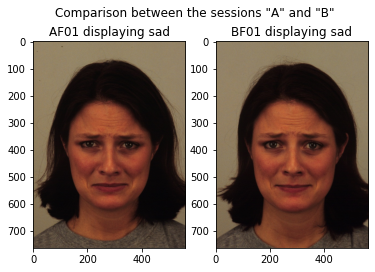

In [ ]:
img_A = cv2.imread(data_dir + "AF01/AF01SAS.JPG", cv2.COLOR_BGR2RGB)
img_B = cv2.imread(data_dir + "BF01/BF01SAS.JPG", cv2.COLOR_BGR2RGB)

fig, axarr = plt.subplots(1, 2)
fig.suptitle('Comparison between the sessions "A" and "B"')
plt.sca(axarr[0])
plt.title('AF01 displaying sad')
axarr[0].imshow(cv2.cvtColor(img_A, cv2.COLOR_BGR2RGB))
plt.sca(axarr[1])
plt.title('BF01 displaying sad')
axarr[1].imshow(cv2.cvtColor(img_B, cv2.COLOR_BGR2RGB))

plt.show(fig)

Because the pictures from the first and the second photographing session are very similar the responding dublices are excluded from the training set.

In [ ]:
print(dublicatesset)

['BF09', 'BF05', 'BF17', 'BF04', 'BF16', 'BF25', 'BF15', 'BF30', 'BM04', 'BM06', 'BM33', 'BM12', 'BM27', 'BM32', 'BM24', 'BM26']


Helper funtions to compare the lists of participants.

In [ ]:
def equal_elements(t1, t2):
    return list(set(t1).intersection(set(t2)))

def not_equal_elements(t1, t2):
    return list(set(t1).symmetric_difference(set(t2)))

In [ ]:
# Defining Variables
all_participants = []   # List of all Participants. 2 * 70 = 140 (70 for session A and 70 for session B)
test_pathes = []        # List of the pathes with the testing images. 16 * 7 = 112 Pathes
train_pathes = []       # List of the training pathes. (70 - 16) * 7 * 2 = 756 // in this way also the 112 dublicates are excluded
all_out = testset + dublicatesset  # in this variable all excluded images are stored. (the ones in the testset and the not used dublicates)


## Loop for train set (112  pictures)
for participant in os.listdir(data_dir): # loops over every particpant in the KDEF-Dataset directory (70)
    all_participants.append(participant) # appending the participants to the list with all participants. 
    if participant in equal_elements(all_participants, testset): # loop over all participants and check if they are in the testset: if Yes load the pictures
        for pictures in os.listdir(os.path.join(data_dir,participant)): # loops over every picture in the every participant folder
            if pictures[-5] == "S": #selects only the pictures containing an S at the last position indicating the straight viewing condition
                test_pathes.append(os.path.join(data_dir,participant, pictures))  # appending the full image path to the test_pathes list         

                
## Loop for train set (756  pictures)
for participant in all_participants:
    if participant in not_equal_elements(all_participants, all_out): # check if the participant is not in the testset or the dublicates set.
        for pictures in os.listdir(os.path.join(data_dir,participant)):
            if pictures[-5] == "S":
                train_pathes.append(os.path.join(data_dir,participant, pictures))


print("After loading:")
print("Trining images:", len(train_pathes))
print("Testing images:", len(test_pathes))

After loading:
Trining images: 753
Testing images: 112


The Variables containing the pathes for the training- and testsingset are now used to load in the pictures and futher preprocess and cropp them to fit the requirements of the pre-trained VGG-Face model.

The next cell block loops over every image path in the image_pathes list. 
1. Opens the picture, extracts the face using the Viola-Jones-Face Detection Algorithm with Face Cascades. Then uses the so found rectangluar Region of Intrest (ROI), extend it by 20 pixel on the side (XX) and (XX) and cuts 20 pixel of the side (XX) and (XX) and uses this Box to crop the original picture.  
2. The Image name gets sorted by the emotion expression abbrevations and the right number gets appended to a list. 
3. The list-variable "training_data" gets filled with the img_array and the numeric labels 
4. If an Exeption accures the loop prints an error and counts the errors. 

In [ ]:
cascade = cv2.CascadeClassifier('/content/gdrive/My Drive/Thesis/haarcascade_frontalface_default.xml') 
#the localisation of the cascade haar filter used to identify the faces in the images

## Training-set Block

In the next code cell you should select a Directory where the cropped images should be saved. **(Not activated)**

In [ ]:
# Train directory
os.chdir("/content/gdrive/My Drive/Thesis/Train")

In [ ]:
count = 0   # counter 
error = 0   # error counter

cropped_train_arrays = []
label = []
label_num = []
ID = []
image_path = []

for picture in train_pathes:
    print("Trying to load image", picture)
    try:
        img_array = cv2.imread(picture, cv2.COLOR_BGR2RGB)
        faces_rect = cascade.detectMultiScale(img_array, scaleFactor = 1.3, minNeighbors = 6)
        for (x, y, w, h) in faces_rect:
            img_array = img_array[y-20:y+h+20,x-20:x+w+20] 
        img_array = cv2.resize(img_array,(224,224))
        #hier Histrogram equbilization
        
        # extract the emotion label expressed on the picture from the filename
        if picture[-7:-5] == "AF":
            labels = "afraid"
            labels_num = 1
        elif picture[-7:-5] == "AN":
            labels = "angry"
            labels_num = 2
        elif picture[-7:-5] == "DI":
            labels = "disgusted"
            labels_num = 3
        elif picture[-7:-5] == "HA":
            labels = "happy"
            labels_num = 4
        elif picture[-7:-5] == "SU":
            labels = "surprise"
            labels_num = 5
        elif picture[-7:-5] == "SA":
            labels = "sad"
            labels_num = 6
        else:
            labels = "neutral"
            labels_num = 7
            

        cropped_train_arrays.append(img_array) # without labels
        
        # count variable for the ID
        count += 1 
        
        #appending additional variables for the simuli.csv 
        label.append(labels)           # label of the shown expression (as words)
        label_num.append(labels_num)   # label of the shown expression (numeric)
        ID.append(count)               # ID 
        
        #saving the image in the specified training path
        cv2.imwrite(picture[-11:-4]+ ".png", img_array)    # needs to be uncommentet if the files should be safed speratly in the above defined folders
        
        cropped_path = "/home/cb/masterarbeit/cropped_data/Train/" +  picture[-11:-4] + ".png"
        image_path.append(cropped_path)
        print("Sucessfully loaded and saved image:", count)
        
    except Exception as e:
        error +=1
        print("Error for", picture)
        print("Error number:", error)
        pass

Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23NES.JPG
Sucessfully loaded and saved image: 1
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23SUS.JPG
Sucessfully loaded and saved image: 2
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23SAS.JPG
Sucessfully loaded and saved image: 3
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23AFS.JPG
Sucessfully loaded and saved image: 4
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23DIS.JPG
Sucessfully loaded and saved image: 5
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23ANS.JPG
Sucessfully loaded and saved image: 6
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM23/AM23HAS.JPG
Sucessfully loaded and saved image: 7
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/BF14/BF14DIS.JPG
Sucessfully loaded and saved image: 8
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/BF14/BF14SAS.JPG
Sucessfully loaded an

In [ ]:
train_data = {'Image_ID':ID, 'Image':image_path, 'label':label, 'label_num':label_num}
train_dataframe = pd.DataFrame(train_data)

In [ ]:
train_csv_file_path = "/content/gdrive/My Drive/Thesis/Train_Test_CSV/"
os.chdir(train_csv_file_path)

In [ ]:
train_dataframe.to_csv("train_data.csv", sep=',', encoding='utf-8')

## Test-set Block

In [ ]:
# Test directory
os.chdir("/content/gdrive/My Drive/Thesis/Test")

In [ ]:
count = 0   # counter 
error = 0   # error counter

cropped_test_arrays = []
label = []
label_num = []
ID = []
sex_in_image = []
image_path = []

for picture in test_pathes:
    print("Trying to load image", picture)
    try:
        img_array = cv2.imread(picture, cv2.COLOR_BGR2RGB)
        faces_rect = cascade.detectMultiScale(img_array, scaleFactor = 1.3, minNeighbors = 6)
        for (x, y, w, h) in faces_rect:
            img_array = img_array[y-20:y+h+20,x-20:x+w+20] 
        #img_array = cv2.resize(img_array,(224,224))
        
        # extract the emotion label expressed on the test stimuli from the filename
        if picture[-7:-5] == "AF":
            labels = "afraid"
            labels_num = 1
        elif picture[-7:-5] == "AN":
            labels = "angry"
            labels_num = 2
        elif picture[-7:-5] == "DI":
            labels = "disgusted"
            labels_num = 3
        elif picture[-7:-5] == "HA":
            labels = "happy"
            labels_num = 4
        elif picture[-7:-5] == "SU":
            labels = "surprise"
            labels_num = 5
        elif picture[-7:-5] == "SA":
            labels = "sad"
            labels_num = 6
        else:
            labels = "neutral"
            labels_num = 7
        
        # extract the sex of the show person on the test stimuli from the filename
        if picture[-10] == "M":
            sex = "male"
        else: 
            sex = "female"
        
        # count variable for the ID
        count += 1 
        
        # appending the array of the testimage to the list with all images     
       
        #appending additional variables for the simuli.csv 
        label.append(labels)           # label of the shown expression (as words)
        label_num.append(labels_num)   # label of the shown expression (numeric)
        sex_in_image.append(sex)       # sex of the person
        ID.append(count)               # ID 
        
        
        
        #saving the image in the specified test path
        cv2.imwrite(picture[-11:-4]+ ".png", img_array)    
        
        cropped_path = "/home/cb/masterarbeit/cropped_data/Test/" +  picture[-11:-4] + ".png"
        image_path.append(cropped_path)
        
        print("Sucessfully loaded and saved image:", count)
        
    except Exception as e:
        error +=1
        print("Error for", picture)
        print("Error number:", error)
        pass

Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26ANS.JPG
Sucessfully loaded and saved image: 1
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26HAS.JPG
Sucessfully loaded and saved image: 2
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26AFS.JPG
Sucessfully loaded and saved image: 3
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26DIS.JPG
Sucessfully loaded and saved image: 4
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26NES.JPG
Sucessfully loaded and saved image: 5
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26SUS.JPG
Sucessfully loaded and saved image: 6
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM26/AM26SAS.JPG
Sucessfully loaded and saved image: 7
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM04/AM04HAS.JPG
Sucessfully loaded and saved image: 8
Trying to load image /content/gdrive/My Drive/Thesis/KDEF/AM04/AM04DIS.JPG
Sucessfully loaded an

Creating a pandas Dataframe with the test image IDs, full image pathes, labels as words and numerics and the sex of the person displayed on the test stimuli. 

This Dataframe will be written to a csv and then used in the Eye-Tracking Experiment

In [ ]:
test_data = {'Image_ID':ID, 'Image':image_path, 'label':label, 'label_num':label_num, 'sex':sex_in_image}
test_dataframe = pd.DataFrame(test_data)

In [ ]:
os.chdir("/content/gdrive/My Drive/Thesis/Train_Test_CSV/")

In [ ]:
test_dataframe.to_csv("test_data.csv", sep=',', encoding='utf-8')

# Fine tuning the pretrained VGG Face model

## Loading packages for the network

In [ ]:
# Loading required packages 
%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)


from keras_preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras import models
from keras import layers

from keras.engine import  Model
from keras.layers import Input, Flatten, Dense, AveragePooling2D 

from keras.callbacks import ModelCheckpoint

TensorFlow 1.x selected.
1.15.2


Using TensorFlow backend.


Installing the library containing the pretrained VGG Face Keras implementation

In [ ]:
!pip install git+https://github.com/rcmalli/keras-vggface.git

  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-0fboi7j7
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-0fboi7j7
  Created wheel for keras-vggface: filename=keras_vggface-0.6-cp36-none-any.whl size=8311 sha256=b404484e6bceddcd690741fabdb171ddc36a5d5c43d0076a751a4310a40d6b9d
  Stored in directory: /tmp/pip-ephem-wheel-cache-y3loz0vi/wheels/36/07/46/06c25ce8e9cd396dabe151ea1d8a2bc28dafcb11321c1f3a6d
Successfully built keras-vggface


In [ ]:
# Loading the VGGFace library
from keras_vggface.vggface import VGGFace

## Reading in the preprocessed train- and testdata

If not running the notebook the complete notebook you can read in preprocessed Train-and Testdata using the saved csv-files.

TODO: Change the code that the column is directly split.

In [ ]:
test_data = pd.read_csv('/content/gdrive/My Drive/Thesis/Train_Test_CSV/test_data.csv')
train_data = pd.read_csv('/content/gdrive/My Drive/Thesis/Train_Test_CSV/train_data.csv')

Rename the **Image** colum to not show the full path but only the image name.

In [ ]:
new_train = train_data["Image"].str.split("Train/", n = 1, expand = True)
train_data['Image'] = new_train[1]

In [ ]:
new_test = test_data["Image"].str.split("Test/", n = 1, expand = True)
test_data['Image'] = new_test[1]

In [ ]:
#saving the new csv files with the split Image column
os.chdir("/content/gdrive/My Drive/Thesis/Train_Test_CSV/")
train_data.to_csv("train_data_2.csv", sep=',', encoding='utf-8')
test_data.to_csv("test_data_2.csv", sep=',', encoding='utf-8')

In [ ]:
# Reading in the new dataframes.
test_data = pd.read_csv('/content/gdrive/My Drive/Thesis/Train_Test_CSV/test_data_2.csv')
train_data = pd.read_csv('/content/gdrive/My Drive/Thesis/Train_Test_CSV/train_data_2.csv')

## Image Data Generator

In [ ]:
datagen = ImageDataGenerator(rescale=1./255.,
                           validation_split=0.2,
                           width_shift_range=0.2,
                           height_shift_range=0.2,
                           shear_range=0.2,
                           zoom_range=0.2,
                           horizontal_flip=True,
                           brightness_range = [0.5, 1.5],
                           fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale = 1./255.)

Rotation another classic augmentation technique is not used because when rotating faces the human recognition performance drops. Could be checked in different studys how CNNs are effected by rotating faces. 

In [ ]:
train_generator = datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = "/content/gdrive/My Drive/Thesis/Train",
    x_col="Image",
    y_col="label",
    subset="training",
    color_mode="rgb",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224,224))

valid_generator = datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = "/content/gdrive/My Drive/Thesis/Train",
    x_col="Image",
    y_col="label",
    subset="validation",
    batch_size=32,
    seed=42,
    shuffle=True,
    class_mode="categorical",
    target_size=(224,224))

Found 603 validated image filenames belonging to 7 classes.
Found 150 validated image filenames belonging to 7 classes.


## Model definition


In [ ]:
modelname = "FER_VGGFace_finetune"
nb_class = 7   # number of classes. 
hidden_dim = 512

vgg_model = VGGFace(include_top=False, input_shape=(224, 224, 3))
last_layer = vgg_model.get_layer('pool5').output
x = Flatten(name='flatten')(last_layer)
x = Dense(hidden_dim, activation='relu', name='fc6')(x)
x = Dense(hidden_dim, activation='relu', name='fc7')(x)
out = Dense(nb_class, activation='softmax', name='fc8')(x)
custom_vgg_model = Model(vgg_model.input, out)





58916864/58909280 [==============================] - 1s 0us/step








**Overview over the used VGG Face model for the finetuning**

**fc6, fc7** and **fc8** are finetuned. 

This is called transfer learning. Then the VGG Face model is trained on face recognition, recognizing the faces of 2.622 celebreties. In this work the first part of the CNN the feature extractor is kept and the second part the classifier is retrained to classify facial expressions. 

In [ ]:
custom_vgg_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 224, 224, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 224, 224, 64)      36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 112, 112, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 112, 112, 128)     147584    
_________________________________________________________________
pool2 (MaxPooling2D)         (None, 56, 56, 128)       0   

**Setting the Hyperparameters:**

For training the hyperparameters were choosen as followed. The ADAM optimizer was used with a learning rate of 1e-5 and a decay of 1e-6, categorical crossentropy was used as loss function. The network was fine-tuned for 20 epochs with 19 steps each and 5 validation steps.

In [ ]:
opt = optimizers.Adam(lr=1e-5, decay=1e-6)
  
custom_vgg_model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

**Creating the Callbacks for the training process:**

Each epoch the model is saved to the folder **Saved_models**.

In [ ]:
os.chdir("/content/gdrive/My Drive/Thesis/Saved_models")

In [ ]:
filepath = "saved-model-{epoch:02d}-{val_acc:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=False, mode='max')

In [ ]:
history = custom_vgg_model.fit_generator(train_generator,
                    steps_per_epoch = 19,
                    epochs = 20,
                    validation_data = valid_generator,
                    validation_steps = 5,
                    callbacks = [checkpoint])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/20
19/19 [==============================] - 1225s 64s/step - loss: 1.9370 - acc: 0.2047 - val_loss: 1.9196 - val_acc: 0.2467

Epoch 00001: saving model to saved-model-01-0.25.hdf5
Epoch 2/20
19/19 [==============================] - 1215s 64s/step - loss: 1.8985 - acc: 0.3207 - val_loss: 1.8345 - val_acc: 0.4267

Epoch 00002: saving model to saved-model-02-0.43.hdf5
Epoch 3/20
19/19 [==============================] - 1205s 63s/step - loss: 1.6224 - acc: 0.5268 - val_loss: 1.2063 - val_acc: 0.6067

Epoch 00003: saving model to saved-model-03-0.61.hdf5
Epoch 4/20
19/19 [==============================] - 1209s 64s/step - loss: 0.9845 - acc: 0.6546 - val_loss: 1.0359 - val_acc: 0.6000

Epoch 00004: saving model to saved-model-04-0.60.hdf5
Epoch 5/20
19/19 [==============================] - 1219s 64s/step - loss: 0.7301 - acc: 0.7506 - val_loss: 0.6831 - val_acc: 0.7867

Epoch 00005: savin

# Analysis

In this notebook the permutation analysis for the eye-tracker experiment is statetd. 

## Loading packages for the Analysis

In [ ]:
!pip install innvestigate

     |████████████████████████████████| 102kB 2.7MB/s 
     |████████████████████████████████| 317kB 7.7MB/s 
  Found existing installation: Keras 2.3.1
    Uninstalling Keras-2.3.1:
      Successfully uninstalled Keras-2.3.1


In [ ]:
!pip install tikzplotlib

     |████████████████████████████████| 92kB 2.5MB/s 


In [ ]:
import warnings
warnings.simplefilter('ignore')

In [ ]:
%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)

TensorFlow 1.x selected.
1.15.2


In [ ]:
import os #for acess to the operating system and loops over directories
import sys #for system stuff noch umschreiben ---- vielleicht rausnehmen
import cv2 # open-cv for image cropping, loading and Viola-Jones- Algorithm 
import random
import imp
import tikzplotlib
import itertools
import json

import innvestigate
import innvestigate.utils as iutils

import numpy as np #algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #for showing and plotting the images
import seaborn as sns
from matplotlib import cm
import matplotlib.gridspec as gridspec
from sklearn.metrics import auc
from sklearn.metrics import classification_report, confusion_matrix

from keras_preprocessing.image import ImageDataGenerator
from keras.models import load_model


Using TensorFlow backend.


Mounting the Google Drive with the necessary data

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/Thesis/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


## Read in the data

In [ ]:
# Directory with the test images
data_dir = "/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/"
# Directory with the human heatmaps
#human_heatmap_dir = "/content/gdrive/My Drive/Thesis/human_heatmaps/"
human_heatmap_dir = "/content/gdrive/My Drive/Thesis/Heatmap_array/"
number_of_correct =  pd.read_csv("/content/gdrive/My Drive/Thesis/nr_correct_human_trials.csv")

#creating dummy arrays to store the images (data) and the human heatmaps
data = np.zeros((112, 224,224,3), dtype = np.float32)
human_heatmap = np.zeros((112, 224,224), dtype = np.float32)
names = [] # name of the image
labels = [] #labels
correct_human = []
j = 0 # index 
for i in os.listdir(data_dir):
  try:
    # Load the image resize and append to data array
    name = data_dir + i
    img = cv2.imread(name, cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
    img = cv2.resize(img, (224,224))   
    b,g,r = cv2.split(img)           # get the single color channels and flip them to account for the flipped reading by opencv
    rgb_img1 = cv2.merge([r,g,b]) 
    data[j] = rgb_img1
    names.append(i[:7])

    # if statement to extract and append the right label
    if i[-7:-5] == "AF":
        labels_num = 0
    elif i[-7:-5] == "AN":
        labels_num = 1
    elif i[-7:-5] == "DI":
        labels_num = 2
    elif i[-7:-5] == "HA":
        labels_num = 3
    elif i[-7:-5] == "NE":
        labels_num = 4
    elif i[-7:-5] == "SA":
        labels_num = 5
    else:
        labels_num = 6
    
    labels.append(labels_num)



    for index, row in number_of_correct.iterrows():
      if row['Image_name'] == i[:7]:
        correct_human.append(row['correct'])
    # Load the respective human heatmap and store it in the human heatmap array
    
    #heatmap_name = "Heatmap_array" + i[:7] + ".npy"   # for coorect and inccorect classifications in the human heatmaps
    heatmap_name = i[:7] + ".npy"   # heatmaps only with correct human trials
    human_heatmap[j] = np.load(human_heatmap_dir + heatmap_name)

    j += 1
  except:
    print(name)
    print("File that is no png")

print("Total number of images:"+ str(j))

/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/.ipynb_checkpoints
File that is no png
Total number of images:112


In [ ]:
# turning the list of labels to an array 
new_labels = np.zeros((112, 7))
for i in range(len(new_labels)):
  np.put(new_labels[i], labels[i], 1)

## Functions

### Functions for human heatmaps

In [ ]:
def image_to_heatmap(file_name):
    """
    Function loading the Trial Data and the backround image and plot a kernel 
    density estimation of the fixation points, saveing it as a numpy array
    :param file_name: name of the trial subset (found in the Trial Subset folder)
                      with .csv file extension
    """
    subset = pd.read_csv("/content/gdrive/My Drive/Thesis/Trial_Subsets/" + file_name)
    subset = subset[subset["correct"] == "correct"]
    image = plt.imread("/content/gdrive/My Drive/Thesis/test_images_with_backround/" + subset["Picture"].iloc[0])
    img = np.zeros([1200, 1920,4],dtype=np.float32)
    fig = plt.figure()
    fig.set_figheight(23)
    fig.set_figwidth(25.4)
    ax1 = fig.add_subplot(1, 1, 1)
    ax1.imshow(img)
    test = sns.kdeplot(subset.xp, subset.yp, kernel="gau", bw = 25, cmap="hot_r", n_levels = 100, shade=True, shade_lowest=False , gridsize=100, zorder = 2)
    plt.xlim(0, 1920)
    plt.ylim(1200, 0)
    plt.axis('off')
    filename = file_name[:7]
    fig.savefig("/content/gdrive/My Drive/Thesis/human_heatmaps/" + file_name + ".png" ,transparent=True,bbox_inches='tight', dpi=96)
    plt.close()
    
    img = cv2.imread("/content/gdrive/My Drive/Thesis/human_heatmaps/" + file_name + ".png" , cv2.IMREAD_GRAYSCALE)
    img = img[160:1040, 513:1393]
    img_array = cv2.resize(img,(224,224))
    invert = cv2.bitwise_not(img_array)
    
    invert = np.float32(invert / 255)
    
    np.save('/content/gdrive/My Drive/Thesis/Heatmap_array/' + filename +".npy" , invert)

In [ ]:
def human_heatmaps(class_index, labels, data):
  """
  Function creating a 4x4 plot containg all trials of a given emotion
  :param class_index: afraid:0, angry:1,disgusted:2, happy:3, neutral:4, sad:5, surprise:6)
  :param labels: array containg the labels 
  :param data: arrays containg image arrays of the trials (in this case the heatmaps) 
  :return fig:
  """
  emotion_subset = []
  for index,value in enumerate(labels):
    if value == class_index:
      emotion_subset.append(index)
  
  data_subset = [data[i] for i in emotion_subset]
  name_subset = [names[i] for i in emotion_subset]
  fig, axs = plt.subplots(4,4, figsize=(10, 10))
  fig.tight_layout()
  #fig.suptitle("Human fixation heatmaps for the emotion: "+ emotion_string)


  axs = axs.ravel()
  for i in range(len(data_subset)):
    axs[i].imshow(data_subset[i], cmap = "hot")
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].title.set_text("("+ str((i+1))+ ") " + name_subset[i][:4])
  plt.subplots_adjust(hspace = 0.15,wspace = 0.15)
  #plt.close()
  return fig

In [ ]:
def human_heatmaps_with_corr(class_index, labels, data, correct):
  """
  Function creating a 4x4 plot containg all trials of a given emotion
  :param class_index: afraid:0, angry:1,disgusted:2, happy:3, neutral:4, sad:5, surprise:6)
  :param labels: array containg the labels 
  :param data: arrays containg image arrays of the trials (in this case the heatmaps) 
  :param data: arrays containg the number of correct classifications by the human participants 
  :return fig:
  """
  emotion_subset = []
  for index,value in enumerate(labels):
    if value == class_index:
      emotion_subset.append(index)
  
  data_subset = [data[i] for i in emotion_subset]
  name_subset = [names[i] for i in emotion_subset]
  nr_corr_subset = [correct[i] for i in emotion_subset]
  fig, axs = plt.subplots(4,4, figsize=(10, 10))
  fig.tight_layout()
  #fig.suptitle("Human fixation heatmaps for the emotion: "+ emotion_string)


  axs = axs.ravel()
  for i in range(len(data_subset)):
    axs[i].imshow(data_subset[i], cmap = "hot")
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].title.set_text("("+ str((i+1))+ ") " + name_subset[i][:4] + " ["+ str(nr_corr_subset[i])+ "]" )
  plt.subplots_adjust(hspace = 0.15,wspace = 0.15)
  #plt.close()
  return fig

### Functions for Permutation analysis

In [ ]:
def create_noise(height = 7, width = 7, channels = 3):
  """
    Function that creates a patch of gaussian noise with a specific size
    :param height: height of the created image
    :param width: width of the created image
    :param channels: how many channels are crated (3 for RGB)
    :return noise_patch:
  """
  noise_patch =  np.random.normal(0,1,(height,width,channels)).astype(np.float64)
  return noise_patch

In [ ]:
def image_to_tiles(im, number_of_tiles = 7, plot=False):
    """
    Function that splits SINGLE channel images into tiles
    :param im: image: single channel image (NxN matrix)
    :param number_of_tiles: squared number
    :param plot:
    :return tiles:
    """
    n_slices = np.sqrt(number_of_tiles)
    assert int(n_slices + 0.5) ** 2 == number_of_tiles, "Number of tiles is not a perfect square"

    n_slices = n_slices.astype(np.int)
    [w, h] = im.shape

    r = np.linspace(0, w, n_slices+1) # .title.set_text('First Plot')
    r_tuples = [(np.int(r[i]), np.int(r[i+1])) for i in range(0, len(r)-1)]
    q = np.linspace(0, h, n_slices+1)
    q_tuples = [(np.int(q[i]), np.int(q[i+1])) for i in range(0, len(q)-1)]

    tiles = []
    tiles_coord = []
    tiles_means = []
    for row in range(n_slices):
        for column in range(n_slices):
            [x1, y1, x2, y2] = *r_tuples[row], *q_tuples[column]
            tile = im[x1:y1, x2:y2]
            tiles.append(im[x1:y1, x2:y2])
            coords = [x1, y1, x2, y2]
            tiles_coord.append(coords)
            tiles_means.append(np.mean(tile))

    if plot:
        fig, axes = plt.subplots(n_slices, n_slices, figsize=(10,10))
        fig.set_facecolor('xkcd:gray')
        c = 0
        for row in range(n_slices):
            for column in range(n_slices):
                axes[row,column].imshow(tiles[c], cmap="seismic", clim=(0, 1))
                axes[row,column].axis('off')
                axes[row,column].title.set_text(str(np.mean(tiles[c])))
                c+=1
    return tiles, tiles_coord, tiles_means

In [ ]:
def reverse_ranks(ranks):
  '''
  Function reverses the ordering of the ranks (0 is the most important)
  :param ranks: a rank ordering computed from tiles_means 
                (from Function image_to_tiles) with 15 as most important
  :return reversed_ranks:
  '''
  i = 0
  reversed_ranks = np.zeros(len(ranks), dtype = int)
  while i < len(ranks):
    max_value = ranks.argmax()
    reversed_ranks[max_value] = i
    ranks[max_value] = -1 
    i +=1
  return reversed_ranks

In [ ]:
# Plot with the ordering of the image tiles
def order_plot(image, coords_ranked):
  '''
  Function creating a plot displaying the permutation ordering
  :param image: the image that is permuatated 
  :param coords_ranked: an array containg the ranks of the image tiles.  
  :return img:
  '''
  color_range = np.arange(0, 1, (1/len(coords_ranked)))
  i = 0
  img = np.copy(image)
  for [x, xH, y, yW] in coords_ranked:
    k = cm.viridis_r(color_range[i])
    img[x:xH,y:yW] = [k[0], k[1], k[2]]
    i += 1

  return img

In [ ]:
def perturbation(analyzer, image, number_of_tiles = 16):
  '''
  Function uses an with the LRP approach created analyzer and splits a given 
  input image accourding the relevance scores produced by the analyzer. 
  :param analyzer: the analyzer with which the image is analysed 
  :param image: the input image that is analised and then split into tiles
  :param number_of_tiles: the number of tiles the image is splitted in. (16 by default)  
  :return image:
  '''
  # From LRP analyse the picture 
  a = analyzer.analyze(image)

  # Aggregate along color channels and normalize to [-1, 1]
  a = a.sum(axis=np.argmax(np.asarray(a.shape) == 3))
  a /= np.max(np.abs(a))
  a = a[0]
  analyzer_image_rescaled = (a - (-1)) / (1 - (-1))  # rescale the values to only have positive values.

  tiles, tiles_coord, tiles_means = image_to_tiles(analyzer_image_rescaled, number_of_tiles= number_of_tiles, plot = False)

  # extract the ranks and sort them 
  array = np.array(tiles_means)
  order = array.argsort()
  ranks = order.argsort()
  #reverse the ranks to have the right ordering

  new_ranks = reverse_ranks(ranks)

  return new_ranks, tiles_coord, analyzer_image_rescaled

In [ ]:
def human_perturbation(heatmap, image, number_of_tiles = 16):
  '''
  Function uses an heatmap generated from human fixation data and splits a given 
  input image accourding to the important regions. 
  image given the relevance scores produced by the analyzer.
  :param analyzer: the analyzer with which the image is analysed 
  :param image: the input image that is analised and then split into tiles
  :param number_of_tiles: the number of tiles the image is splitted in. (16 by default)  
  :return image:
  '''
  tiles, tiles_coord, tiles_means = image_to_tiles(heatmap, number_of_tiles= number_of_tiles, plot = False)

  resulting_heatmap = heatmap

  # extract the ranks and sort them 
  array = np.array(tiles_means)
  order = array.argsort()
  ranks = order.argsort()
  #reverse the ranks to have the right ordering

  new_ranks = reverse_ranks(ranks)

  return new_ranks, tiles_coord, resulting_heatmap

In [ ]:
def ranks_to_coordList(ranks, tiles_coord):
  """
  Function that gives a list with the coordinates of the tiles in the order 
    specified by the ranks array
  :param ranks: array with the ranks giving the perturbation order of the tiles 
  :param tiles_coord: coordinates of the tiles that are permutated in the input 
                      image
  :return coords_in_rank:
  """
  i = 0
  coords_in_rank = []
  while i < len(ranks):
    index = np.where(ranks == i)
    coord = tiles_coord[index[0][0]]
    coords_in_rank.append(coord)
    i += 1
  return coords_in_rank

In [ ]:
def create_perturbation_images(image, coords_in_rank, number_of_tiles):
  """
  Function that perturbates the input image in respect to the importance in the analyser 
  :param image: the input image that is permutated 
  :param coords_in_rank: the list with the right order of the image coords that are permutated
  :param number_of_tiles: the total number of tiles the image is split in 
  :return images: array with the images [0 = input image][-1 = fully permutated image]
  """

  img = np.copy(image.squeeze())
  h = img.shape[0]  # height
  w = img.shape[1]  # width
  c = img.shape[2]  #channels
  tiles_per_axis = int(np.sqrt(number_of_tiles))
  pixel_per_tile_axis = int(h / tiles_per_axis) 
  images = np.zeros(((number_of_tiles +1) , h, w, c))  # number of pictures =16 needs to be changed as well as the sizes
  i = 0
  images[i] = img
  i = 1 
  for [x, xH, y, yW] in coords_in_rank:
    #plt.ion() 
    noise = create_noise(pixel_per_tile_axis,pixel_per_tile_axis,c)
    img[x:xH,y:yW] = noise
    images[i] = img
    #p_img[i] = test
    #plt.imshow(test, cmap='gray', interpolation='nearest')
    #plt.show()     # show the figure, non-blocking
    #_ = input("Press [enter] to continue.") # wait for input from the user
    #plt.close()
    i +=1
  return images

In [ ]:
def LRP(analyzer, image):
  """
  Function producing a rescaled LRP heatmap only containg positive values. 
  :param analyzer: the analyzer with which the image is analysed  
  :param image: the input image for which the LRP heatmap is computed 
  :return analyzer_image_rescaled:
  """
  a = analyzer.analyze(image)

  # Aggregate along color channels and normalize to [-1, 1]
  a = a.sum(axis=np.argmax(np.asarray(a.shape) == 3))
  a /= np.max(np.abs(a))
  a = a[0]
  analyzer_image_rescaled = (a - (-1)) / (1 - (-1))
  return analyzer_image_rescaled

In [ ]:
## New######
def emotion_heatmaps(analyzer, class_index, labels, data):
  """
  Function creating a 4x4 plot containg all trials of a given emotion
  :param emotion: which emotion is displayed as string
  :param class_index: afraid:0, angry:1,disgusted:2, happy:3, neutral:4, sad:5, surprise:6)
  :param labels: array containg the labels 
  :param data: arrays containg image arrays of the trials 
  :return fig:
  """
  emotion_subset = []
  for index,value in enumerate(labels):
    if np.argmax(value) == class_index:
      emotion_subset.append(index)
  
  data_subset = [data[i] for i in emotion_subset]
  name_subset = [names[i] for i in emotion_subset]
  correct_subset = [correct[i] for i in emotion_subset]
  correct_subset_string = []
  for i in correct_subset:
    if i == 1:
      correct_subset_string.append("correct")
    else: 
      correct_subset_string.append("misclassified")

  LRP_heatmaps = np.zeros((len(emotion_subset), 224,224))
  for trial in range(len(data_subset)):
    new_shape = np.reshape(data_subset[trial], (1,224,224,3))
    LRP_heatmaps[trial] = LRP(analyzer, new_shape)

  fig, axs = plt.subplots(4,4, figsize=(10, 10))
  fig.tight_layout()
  #fig.suptitle("LRP heatmaps for the emotion: "+ emotion, fontsize=20)


  axs = axs.ravel()
  for i in range(len(data_subset)):
    axs[i].imshow(LRP_heatmaps[i], cmap = "seismic", clim = (0,1), interpolation= "nearest")
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].title.set_text("("+ str((i+1))+ ") " + name_subset[i][:4] + " " + correct_subset_string[i])

  plt.subplots_adjust(hspace = 0.15,wspace = 0.15)
  return fig

In [ ]:
def plot_perturbation(lrp, random, human): 
  """
  Function creating a 3x19 plot containg the input, analysis, ordering and each
       permutation step for random, LRP and humans all trials of a given emotion
  :param lrp: array containing (LPR perturbation images, ordering and LRP heatmap)
  :param random: array containing (random perturbation images, ordering)
  :param human: array containing (human perturbation images, ordering and 
                fixation heatmap) 
  :return fig:
  """
  fig2 = plt.figure(constrained_layout=True, figsize=(20,4))
  fig2.tight_layout()
  spec = gridspec.GridSpec(ncols=19, nrows=3, figure=fig2)

  ######## random ##################
  f2_ax1_p1 = fig2.add_subplot(spec[0, 0])
  f2_ax1_p1.imshow((random[0][0]* 255).astype(np.uint8))
  f2_ax1_p1.set_title('input')
  f2_ax1_p1.set_ylabel("random")
  f2_ax1_p1.set_xticks([])
  f2_ax1_p1.set_yticks([])

  f2_ax1_p2 = fig2.add_subplot(spec[0, 1])
  f2_ax1_p2.imshow((random[0][-1]* 255).astype(np.uint8))
  f2_ax1_p2.set_title('analysis')
  f2_ax1_p2.set_xticks([])
  f2_ax1_p2.set_yticks([])

  f2_ax1_p3 = fig2.add_subplot(spec[0, 2])
  f2_ax1_p3.imshow(random[1])
  f2_ax1_p3.set_title('order')
  f2_ax1_p3.set_xticks([])
  f2_ax1_p3.set_yticks([])

  for i in range(16):
    num_pic = i + 3
    pic_in_array = i +1
    f2_ax1_p4 = fig2.add_subplot(spec[0, num_pic])
    f2_ax1_p4.imshow((random[0][pic_in_array]* 255).astype(np.uint8))
    f2_ax1_p4.set_title('Step' +  str(pic_in_array))
    f2_ax1_p4.set_xticks([])
    f2_ax1_p4.set_yticks([])

  ######## LRP ##################
  f2_ax2_p1 = fig2.add_subplot(spec[1, 0])
  f2_ax2_p1.imshow(lrp[0][0])
  f2_ax2_p1.set_title('input')
  f2_ax2_p1.set_ylabel("LRP")
  f2_ax2_p1.set_xticks([])
  f2_ax2_p1.set_yticks([])

  f2_ax2_p2 = fig2.add_subplot(spec[1, 1])
  f2_ax2_p2.imshow(lrp[2], cmap='seismic', interpolation='nearest', clim = (0.0,1.0))
  f2_ax2_p2.set_title('analysis')
  f2_ax2_p2.set_xticks([])
  f2_ax2_p2.set_yticks([])

  f2_ax2_p3 = fig2.add_subplot(spec[1, 2])
  f2_ax2_p3.imshow(lrp[1])
  f2_ax2_p3.set_title('order')
  f2_ax2_p3.set_xticks([])
  f2_ax2_p3.set_yticks([])

  for i in range(16):
    num_pic = i + 3
    pic_in_array = i +1
    f2_ax2_p4 = fig2.add_subplot(spec[1, num_pic])
    f2_ax2_p4.imshow((lrp[0][pic_in_array]* 255).astype(np.uint8))
    f2_ax2_p4.set_title('Step' +  str(pic_in_array))
    f2_ax2_p4.set_xticks([])
    f2_ax2_p4.set_yticks([])


  ######## Human ##################
  f2_ax3_p1 = fig2.add_subplot(spec[2, 0])
  f2_ax3_p1.imshow(human[0][0])
  f2_ax3_p1.set_title('input')
  f2_ax3_p1.set_ylabel("human")
  f2_ax3_p1.set_xticks([])
  f2_ax3_p1.set_yticks([])

  f2_ax3_p2 = fig2.add_subplot(spec[2, 1])
  f2_ax3_p2.imshow(human[2], cmap='hot', interpolation='nearest', clim = (0.0,1.0))
  f2_ax3_p2.set_title('analysis')
  f2_ax3_p2.set_xticks([])
  f2_ax3_p2.set_yticks([])

  f2_ax3_p3 = fig2.add_subplot(spec[2, 2])
  f2_ax3_p3.imshow(human[1])
  f2_ax3_p3.set_title('order')
  f2_ax3_p3.set_xticks([])
  f2_ax3_p3.set_yticks([])

  for i in range(16):
    num_pic = i + 3
    pic_in_array = i +1
    f2_ax3_p4 = fig2.add_subplot(spec[2, num_pic])
    f2_ax3_p4.imshow((human[0][pic_in_array]* 255).astype(np.uint8))
    f2_ax3_p4.set_title('Step' +  str(pic_in_array))
    f2_ax3_p4.set_xticks([])
    f2_ax3_p4.set_yticks([])

  #plt.close()
  return fig2

In [ ]:
def permutation_plot(analyzer, image, number_of_tiles, human_heatmap):
  """
  Function creating the complete permutation plot (3x19)containg the input image,
       analysis, ordering and each permutation step for random, LRP and humans
       all trials of a given emotion
  :param analyzer: the analyzer with which the image is analysed  
  :param image: input image
  :param number_of_tiles: the total number of tiles the image is split in 
  :param human_heatmap: heatmap in form of an array from the human fixation points 
  :return plot:
  """

  ### LRP
  image = image.reshape(1,224,224,3) # LRP needs a 4 dimension array
  ranks, tile_coords, analyzer_image_rescaled = perturbation(analyzer, image, number_of_tiles)
  coords_in_rank = ranks_to_coordList(ranks, tile_coords)
  images = create_perturbation_images(image, coords_in_rank, 16)
  ordering = order_plot(image.squeeze(), coords_in_rank)

  #Random
  random.shuffle(coords_in_rank) #shuffle method
  ordering_random = order_plot(image.squeeze(), coords_in_rank)
  images_random = create_perturbation_images(image, coords_in_rank, 16)

  # Human
  ranks_human, tile_coords_human ,human_heatplot = human_perturbation(human_heatmap, image, number_of_tiles)
  coords_in_rank_human = ranks_to_coordList(ranks_human, tile_coords_human)
  images_human = create_perturbation_images(image, coords_in_rank_human, 16)
  ordering_human = order_plot(image.squeeze(), coords_in_rank_human)

  # Combination
  lrp = np.array([images, ordering, analyzer_image_rescaled], dtype=object)
  random_data = np.array([images_random, ordering_random], dtype=object)
  human = np.array([images_human, ordering_human, human_heatplot], dtype=object) 

  plot = plot_perturbation(lrp, random_data, human)
  return plot

In [ ]:
def permutation_pictures(analyzer, image, number_of_tiles, human_heatmap):

  image = image.reshape(1,224,224,3) # LRP needs a 4 dimension array
  ranks, tile_coords, analyzer_image_rescaled = perturbation(analyzer, image, number_of_tiles)
  coords_in_rank = ranks_to_coordList(ranks, tile_coords)
  images = create_perturbation_images(image, coords_in_rank, number_of_tiles)
  ordering = order_plot(image.squeeze(), coords_in_rank)

  #Random
  random.shuffle(coords_in_rank) #shuffle method
  ordering_random = order_plot(image.squeeze(), coords_in_rank)
  images_random = create_perturbation_images(image, coords_in_rank, number_of_tiles)

  # Human
  ranks_human, tile_coords_human ,human_heatplot = human_perturbation(human_heatmap, image, number_of_tiles)
  coords_in_rank_human = ranks_to_coordList(ranks_human, tile_coords_human)
  images_human = create_perturbation_images(image, coords_in_rank_human, number_of_tiles)
  ordering_human = order_plot(image.squeeze(), coords_in_rank_human)

  # Combination
  lrp = np.array([images, ordering, analyzer_image_rescaled], dtype=object)
  random_data = np.array([images_random, ordering_random], dtype=object)
  human = np.array([images_human, ordering_human, human_heatplot], dtype=object)

  return lrp, random_data, human

In [ ]:
# recently not used but implemented (maybe delete)
def check_image(num):
  print("Check if the picture was classified correct by the network:\n")
  if correct[num] != 1:
    print("Picture were incorrectly classfied!")
    return
  else:
    print("Correctly classified!")


  image = np.copy(data[num])
  heatmap = np.copy(human_heatmap[num])
  lrp , rand_data, human = permutation_pictures(analyzer, image, 16, heatmap)
  j = 1
  return j


In [ ]:
def get_values(y_pred, picture_num):
  values = []
  steps = []
  for i in range(len(y_pred)):
    value = y_pred[i][labels[picture_num]]
    steps.append(i)
    values.append(value)

  values = np.array(values)
  steps = np.array(steps)
  return steps, values

In [ ]:
def diff_to_random(values, values_random):
  diff = np.abs(values - values_random)
  return diff

In [ ]:
def multi_random_pictures(analyzer, image, number_of_tiles, shuffle_count):

  image = image.reshape(1,224,224,3) # LRP needs a 4 dimension array
  ranks, tile_coords, analyzer_image_rescaled = perturbation(analyzer, image, number_of_tiles)
  coords_in_rank = ranks_to_coordList(ranks, tile_coords)

  #Random
  multi_random_images = np.zeros((shuffle_count, (number_of_tiles+1), 224, 224, 3))
  for i in range(shuffle_count):
    random.shuffle(coords_in_rank) #shuffle method
    ordering_random = order_plot(image.squeeze(), coords_in_rank)
    multi_random_images[i] = create_perturbation_images(image, coords_in_rank, number_of_tiles)
  
  return multi_random_images

In [ ]:
def plot_curve_all_trials(analyzer, data, human_heatmap, labels, tiles = 16, random_n = 20):
  
  diff_array = np.zeros((len(data), 3, (tiles + 1)))
  correct = np.zeros((len(data)))

  for num in range(len(data)):
    #print("Image " + str(num) + " correct is perturbated!")
    image = np.copy(data[num]) # data [2]
    heatmap = np.copy(human_heatmap[num]) # human_heatmap [2]
    lrp , rand_data, human = permutation_pictures(analyzer, image, tiles, heatmap)

    random_pictures = multi_random_pictures(analyzer, data[num], tiles, random_n)
    print("Random images for Image "+ str(num) + " are created.")
    results = np.zeros((random_pictures.shape[0], random_pictures.shape[1]))
    for j in range(random_pictures.shape[0]):
      random_predict = model.predict(random_pictures[j], verbose = 1)
      for i in range(random_predict.shape[0]):
        results[j][i] = random_predict[i][np.argmax(labels[num])]

    mean_random = np.mean(results, axis = 0)

    y_pred_lrp = model.predict(lrp[0], verbose = 1)
    y_pred_human = model.predict(human[0], verbose = 1)

    if np.argmax(y_pred_lrp[0]) == np.argmax(labels[num]) and np.argmax(y_pred_human[0]) == np.argmax(labels[num]):

      steps_lrp, values_lrp = get_values(y_pred_lrp, num)
      steps_human, values_human = get_values(y_pred_human, num)

      lrp_rand = diff_to_random(values_lrp, mean_random)     #shape (17,)
      diff_array[num][0] = lrp_rand
      human_rand = diff_to_random(values_human, mean_random)
      diff_array[num][1] = human_rand
      rand_rand = diff_to_random(mean_random, mean_random)
      diff_array[num][2] = rand_rand

      correct[num] = 1

      print("Image " + str(num) + " was correct gets perturbated!")

    else:
      print("Image " + str(num) + " was not correctly classified and therefore is skipped.")

      correct[num] = 0


  length = np.sum(correct)
  only_correct = np.zeros((int(length), 3, 17))
  j = 0
  for i in range(len(correct)):
    if correct[i] == 1:
      only_correct[j][0] = diff_array[i][0]
      only_correct[j][1] = diff_array[i][1]
      only_correct[j][2] = diff_array[i][2]
      j += 1
    else:
      continue


  lrp_difference = np.zeros((only_correct.shape[0], 17))
  human_difference = np.zeros((only_correct.shape[0], 17))
  random_difference = np.zeros((only_correct.shape[0], 17))
  for i in range(len(only_correct)):
    lrp_difference[i] = only_correct[i][0]
    human_difference[i] = only_correct[i][1]
    random_difference[i] = only_correct[i][2]



  return only_correct, lrp_difference, human_difference, random_difference, steps_lrp

Function for creating the single perturbation plots:

In [ ]:
def permutation_subplots(emotion_string, class_index, labels_short, lrp_difference, human_difference, random_difference):
  """
  Function creating permutation comparison plot for a single stated emotion. 
  :param emotion_string: The displayed emotion as a string. e.g "afraid" 
  :param class_index: afraid:0, angry:1,disgusted:2, happy:3, neutral:4, sad:5, surprise:6)
  :param labels_short: array used to iterate over the difference arrays. Ensures that
                       only correct trials are used. 
  :param lrp_difference: the differences between the accuracy values generated using 
                         the lrp perturbation 
  :param human_difference: the differences between the accuracy values generated using 
                         the human perturbation                          
  :param random_difference: arrays containg the random baseline values. (Is always zero)
  :return displays the plot
  """

  emotion_subset = []
  for index,value in enumerate(labels_short):
    if np.argmax(value) == class_index:
      emotion_subset.append(index)

  lrp_diff_subset = np.array([lrp_difference[i] for i in emotion_subset])
  human_diff_subset = np.array([human_difference[i] for i in emotion_subset])
  random_diff_subset = np.array([random_difference[i] for i in emotion_subset])


  # Computing the Mean | Max | Min
  # LRP
  mean_lrp_diff_subset = np.mean(lrp_diff_subset, axis = 0)
  #Human
  mean_human_diff_subset = np.mean(human_diff_subset, axis = 0)
  #Random (obviously zero)
  mean_random_diff_subset = np.mean(random_diff_subset, axis = 0)
  #Compute AUC for the means 
  auc_lrp = np.around((auc(steps, mean_lrp_diff_subset)), 3)
  auc_human = np.around((auc(steps, mean_human_diff_subset)), 3)


  for i in range(lrp_diff_subset.shape[0]):
    plt.plot(steps, lrp_diff_subset[i], "b", color = "red", alpha=0.1 )

  for i in range(human_diff_subset.shape[0]):
    plt.plot(steps, human_diff_subset[i], "b", color = "blue", alpha=0.1 )
  plt.plot(steps, mean_lrp_diff_subset, "b", color ="red", label = "LRP: (AUC: " + str(auc_lrp)+")")
  plt.plot(steps, mean_human_diff_subset, "b", color ="blue", label = "human: (AUC: " + str(auc_human)+")")
  plt.plot(steps, mean_random_diff_subset, "b", color ="black", label = "baseline")
  plt.xlabel("Steps")
  plt.ylabel("Difference in accuracy to random perturbation")
  plt.legend()
  #plt.show()
  

## Preprocessing of the Eyelink Data files in R



Files feed into R:



To read in and extract the data from the converted edf files the R package **eyelinker** is used. 

```R
#Loading the requiered packages
require(eyelinker)
require(dplyr)
require(tidyr)
require(ggplot2)
require(intervals)
```

```R
citation(package = "eyelinker")

>>>  To cite package ‘eyelinker’ in publications use:

  Simon Barthelme (2019). eyelinker: Import ASC Files from EyeLink Eye
  Trackers. R package version 0.2.0.
  https://CRAN.R-project.org/package=eyelinker

A BibTeX entry for LaTeX users is

  @Manual{,
    title = {eyelinker: Import ASC Files from EyeLink Eye Trackers},
    author = {Simon Barthelme},
    year = {2019},
    note = {R package version 0.2.0},
    url = {https://CRAN.R-project.org/package=eyelinker},
  }

ATTENTION: This citation information has been auto-generated from the
package DESCRIPTION file and may need manual editing, see
‘help("citation")’.

```

In the analysis the first 7 example trials are not used. Therefore they are excluded.
```R
# Function to split the example block from the test images. 

vpn_exp_data <- function(file_path) {
    raw_data_exp <- read.csv(file_path)
    vars <- c("ID", "Image", "sex", "label", "label_num", "Emotion_choose.clicked_name","participant")
    raw_data_exp <- raw_data_exp[vars] # dropping columns we dont need
    raw_data_exp <- raw_data_exp[-c(1,2,10,123),] # dropping rows with missing data
    exp_block <- seq(1, 119, by=1) # create block column
    raw_data_exp$block <- exp_block # append the block column
    raw_data_exp$correct <- ifelse(raw_data_exp$label == raw_data_exp$Emotion_choose.clicked_name, "correct", "wrong")
    data_exp <- raw_data_exp[-(1:7), ]
    return(data_exp) 
}
```
With this function the to plain-text ASCII (.asc) converted Eyelinkr Data file (.edf) is merged with the  experiment .csv data containing the participnats click data and which trial image was displayed. 


This function reads in the event data. The eyelinker package automatically aggregates the raw data to the fixation events and the saccades. 

```R
vpn_eye_data <- function(file_path_eye, file_path_classification) {
    
    #reading in the files
    dat <- read.asc(file_path_eye)
    cb_exp_data <- vpn_exp_data(file_path_classification)
    
    #selecting the variables that are extracted
    vars_fix = c("block","stime", "etime", "axp", "ayp", "dur")
    vars_sacc = c("block", "stime", "etime", "sxp", "syp", "exp", "eyp")
    vars_exp_data = c("block", "ID", "label", "Emotion_choose.clicked_name", "participant", "correct", "Image")
    
    #handling of the fixations 
    fix <- dat$fix[vars_fix]
    #compute the time in seconds
    fix <- mutate(dat$fix, fix_stime = (stime - min(stime)) / 1e3, fix_etime = (etime - min(etime)) / 1e3)
    fix <- fix[ , c("block","fix_stime", "fix_etime", "axp", "ayp", "dur")]
    #handling of the saccades
    sacc <- dat$sacc[vars_sacc]
    sacc <- mutate(dat$sacc, sacc_stime = (stime - min(stime)) / 1e3, sacc_etime = (etime - min(etime)) / 1e3)
    sacc <- sacc[ , c("block","sacc_stime", "sacc_etime", "sxp", "syp", "exp", "eyp")]
    cb_exp_data <- cb_exp_data[vars_exp_data]
    screen.x <- dat$info$screen.x
    screen.y <- dat$info$screen.y
    
    #combining and merging the 3 data frames
    step1 <- cbind(sacc,screen.x, screen.y)
    step2 <- merge(step1, fix, by.x="block", by.y="block")
    step3 <- merge(step2, cb_exp_data, by.x="block", by.y="block")
    name = as.character(step3$participant[1])
    csv = ".csv"
    file_name = paste(name, csv,  sep = "", collapse = NULL)
    
    #safe the final data as csv 
    write.csv(step3, file_name ,row.names = FALSE)
    print("Loading done:" )
    return(step3)
}
```

To respect for the duration of the fixations the raw data is used for the kernel density estimation plots for the human saliency heatmaps. 

``` R
# Read in and merge the raw data
vpn_raw_data <- function(file_path_eye, file_path_classification) {
    
    #reading in the files
    dat <- read.asc(file_path_eye)
    dat <- dat$raw
    dat <- mutate(dat, ts = (time - min(time)) / 1e3)
    cb_exp_data <- vpn_exp_data(file_path_classification)
    
    #selecting the variables that are extracted
    raw = c("block","time", "xp", "yp", "ts")
    vars_exp_data = c("block", "ID", "label", "Emotion_choose.clicked_name", "participant", "correct", "Image")
    
 
    #handling of the fixations 
    dat <- dat[raw]
    cb_exp_data <- cb_exp_data[vars_exp_data]

    full <- merge(dat, cb_exp_data, by.x="block", by.y="block")
    name = as.character(cb_exp_data$participant[1])
    csv = ".csv"
    file_name = paste(name, csv,  sep = "", collapse = NULL)
    
    #safe the final data as csv 
    write.csv(full, file_name ,row.names = FALSE)
    print("Loading done:" )
}
```

The data from the eyetracker experiment is stored in the vpn_overview.csv file. In this the pathes to the eye-tracker data and the experiment data are stored.

```R
overview <- read.csv("/run/media/clemens/HEMA_32GB/Experiment/vpn_overview.csv")
```

This Loop loades the event data of all participants listed in the vpn_overview.csv and merges the data from the classification and the eyetracker and saves the aggregated data in single .csv for each participnat one. This is futher used in the python for the fixation maps. 
```R
setwd("/run/media/clemens/HEMA_32GB/Experiment/Data_analysis/")
for (row in 1:nrow(overview)) {
    eye <- as.character(overview[row, "file_path_eye"])
    class <- as.character(overview[row, "file_path_classification"])  
    vpn_eye_data(eye, class)
}

``` 

Same for the raw data which is used for computing the human heatmaps that are used in the permutation analysis. 

```R
setwd("/run/media/clemens/HEMA_32GB/Experiment/raw_data_analysis")
for (row in 1:nrow(overview)) {
    eye <- as.character(overview[row, "file_path_eye"])
    class <- as.character(overview[row, "file_path_classification"])  
    vpn_raw_data(eye, class)
}
```

Eyetracker Metadata:

```R

dplyr::select(dat$info, c(model, mount, sample.rate, cr))
>>> EyeLink 1000	Tower Mount / Monocular / Head Stabilized	1000 /TRUE

dplyr::select(dat$info, c(left, right, mono, screen.x, screen.y))
>>> FALSE	TRUE	TRUE	1921	1201

dplyr::select(dat$info, c(sample.dtype, event.dtype, pupil.dtype))
>>> GAZE	GAZE	AREA


Output: Files



## Analysis of the eye-tracker experiment 

In this section the eye movement data collected in the eye tracker experiment are processed and evaluated. 


###  Descriptive Analysis of the participants of the eyetracker experiment 

In [ ]:
experiment_overview_data = pd.read_csv("/content/gdrive/My Drive/Thesis/vpn_overview.csv")

In [ ]:
experiment_overview_data.head()

,ID,Participant,Age_year,Age,Sex,file_path_eye,file_path_classification,directory,sight,color,dominant_eye,special,goal_of_exp,emotion_skill
0,1,CB1,1993,26,male,/run/media/clemens/HEMA_32GB/Experiment/EDF_fi...,/run/media/clemens/HEMA_32GB/Experiment/data/C...,/run/media/clemens/HEMA_32GB/Experiment/Data_a...,1.33,normal,left,NaN,NaN,gut
1,2,EJ1,1994,25,female,/run/media/clemens/HEMA_32GB/Experiment/EDF_fi...,/run/media/clemens/HEMA_32GB/Experiment/data/E...,/run/media/clemens/HEMA_32GB/Experiment/Data_a...,1.33,normal,right,Heißer VL,überhaupt nicht,sehr gut
2,3,M69V2,1993,26,male,/run/media/clemens/HEMA_32GB/Experiment/EDF_fi...,/run/media/clemens/HEMA_32GB/Experiment/data/M...,/run/media/clemens/HEMA_32GB/Experiment/Data_a...,1.33,normal,right,"“Die Emotionen waren nicht echt erlebt, sonder...",NaN,gut
3,4,A2428,1999,20,male,/run/media/clemens/HEMA_32GB/Experiment/EDF_fi...,/run/media/clemens/HEMA_32GB/Experiment/data/A...,/run/media/clemens/HEMA_32GB/Experiment/Data_a...,1.33,normal,right,“Die Dauer wie lange man den Punkt gesehen hat...,“Wie viel Zeit bei der Erkennung von verschied...,"weder gut, noch schlecht"
4,5,TSH030,1995,25,male,/run/media/clemens/HEMA_32GB/Experiment/EDF_fi...,/run/media/clemens/HEMA_32GB/Experiment/data/T...,/run/media/clemens/HEMA_32GB/Experiment/Data_a...,1.33,normal,right,NaN,“Emotionserkennung”,gut


In [ ]:
np.around(experiment_overview_data["Age"].describe(),2)

count    28.00
mean     25.36
std       3.88
min      20.00
25%      23.75
50%      25.00
75%      26.00
max      39.00
Name: Age, dtype: float64

In [ ]:
experiment_overview_data.groupby(["Sex"]).count()

,ID,Participant,Age_year,Age,file_path_eye,file_path_classification,directory,sight,color,dominant_eye,special,goal_of_exp,emotion_skill
Sex,,,,,,,,,,,,,
female,13,13,13,13,13,13,13,13,13,13,12,12,13
male,15,15,15,15,15,15,15,15,15,15,8,11,15


A total number of 28 volunteers (13 female and 15 male) participated in the experiment. The mean age is 25.36 years with a range of 20 to 39 years and a standard deviation of 3.88. 

### Human Classification Results from the eyetracker experiment

In [ ]:
Exp_data_dir = "/content/gdrive/My Drive/Thesis/Experiment_VPN_Classification_data/"

Emotion_clicked = {"afraid":1, "angry":2, "disgusted":3, "happy":4, "surprise":5, "sad":6, "neutral":7} 

In [ ]:
error = 0 #Error counter
vpn_count = 0
#erst erstellen des basis Dataframes
df = pd.DataFrame(columns = ['ID', 'Image', 'label', 'sex','Emotion_choose.clicked_name','participant', 'label_num','num_clicked_label'])
#Schleife zum Einlesen der CSV files aus dem Data Ordner
for file in os.listdir(Exp_data_dir):
    if file[-3:] == "csv":
        try:   #einlesen der einzelnen Participants
            #print(file)
            data = pd.read_csv(Exp_data_dir + "/" + file)
            data = data[['ID', 'Image','label', 'label_num', 'sex','Emotion_choose.clicked_name','participant']]
            data = data.dropna()
            #dummy['num_label'] = [Emotion_label[x] for x in dummy['label']]
            data['num_clicked_label'] = [Emotion_clicked[x] for x in data['Emotion_choose.clicked_name']]
            data['num_clicked_label'] = data['num_clicked_label'].astype('float64')
            data = data.sort_values('ID')
            df = pd.concat([df, data], sort = False)
            print("Sucess:", file)
            vpn_count += 1
        except Exception as e: #Falls es Fehler gibt Error zählen und passen lassen
            error +=1
            print("Error for", file)
            print("Error number:", error)
            pass

print("Loaded data of " + str(vpn_count) + " participants.")

Sucess: EJ5_Emotion_Experiment_2020_Feb_07_1154.csv
Sucess: EC0617_Emotion_Experiment_2020_Mar_09_1839.csv
Sucess: PK15_Emotion_Experiment_2020_Feb_28_1706.csv
Sucess: KF783_Emotion_Experiment_2020_Mar_09_1801.csv
Sucess: k5s1_Emotion_Experiment_2020_Feb_28_1041.csv
Sucess: UV729_Emotion_Experiment_2020_Mar_11_1418.csv
Sucess: BA43X_Emotion_Experiment_2020_Mar_06_0841.csv
Sucess: TSH030_Emotion_Experiment_2020_Feb_24_1115.csv
Sucess: VB318_Emotion_Experiment_2020_Mar_05_1416.csv
Sucess: KT125_Emotion_Experiment_2020_Mar_10_1044.csv
Sucess: TT431_Emotion_Experiment_2020_Mar_11_1338.csv
Sucess: TH371_Emotion_Experiment_2020_Mar_06_0958.csv
Sucess: PA651_Emotion_Experiment_2020_Mar_10_0938.csv
Sucess: AJ8RD_Emotion_Experiment_2020_Feb_28_1602.csv
Sucess: KF39_Emotion_Experiment_2020_Feb_28_1503.csv
Sucess: M69V2_Emotion_Experiment_2020_Feb_17_1105.csv
Sucess: SS0393_Emotion_Experiment_2020_Feb_28_1122.csv
Sucess: JR61_Emotion_Experiment_2020_Feb_28_1334.csv
Sucess: WW1996_Emotion_Experime

Computing the accuracy:

In [ ]:
df

,ID,Image,label,sex,Emotion_choose.clicked_name,participant,label_num,num_clicked_label
101,0.0,E:\Experiment\test_cropped_KDEF\AF25DIS.jpg,disgusted,female,sad,EJ5,3.0,6.0
60,1.0,E:\Experiment\test_cropped_KDEF\AM04NES.jpg,neutral,male,neutral,EJ5,7.0,7.0
15,2.0,E:\Experiment\test_cropped_KDEF\AF30SAS.jpg,sad,female,afraid,EJ5,6.0,1.0
13,3.0,E:\Experiment\test_cropped_KDEF\AM33SUS.jpg,surprise,male,sad,EJ5,5.0,6.0
100,4.0,E:\Experiment\test_cropped_KDEF\AM04DIS.jpg,disgusted,male,afraid,EJ5,3.0,1.0
...,...,...,...,...,...,...,...,...
11,107.0,E:\Experiment\test_cropped_KDEF\AF15SUS.jpg,surprise,female,afraid,CB1,5.0,1.0
54,108.0,E:\Experiment\test_cropped_KDEF\AF05AFS.jpg,afraid,female,angry,CB1,1.0,2.0
94,109.0,E:\Experiment\test_cropped_KDEF\AM24DIS.jpg,disgusted,male,disgusted,CB1,3.0,3.0
40,110.0,E:\Experiment\test_cropped_KDEF\AF17DIS.jpg,disgusted,female,disgusted,CB1,3.0,3.0


In [ ]:
df["correct"] = np.where(df['label_num'] == df['num_clicked_label'], 1, 0)

In [ ]:
total = df["correct"].sum()

In [ ]:
round(total / len(df), 3)

0.787

The mean accuracy over all people is: 0.787

In [ ]:
by_participant = df.groupby("participant")

In [ ]:
correct_per_participant = by_participant.correct.sum()

In [ ]:
acc_per_participant = correct_per_participant / 112

In [ ]:
acc_per_participant


participant
A24282    0.794643
A47XZ     0.839286
AFD1      0.785714
AJ8RD     0.821429
BA43X     0.857143
C5AP      0.794643
CB1       0.839286
CT381     0.714286
EC0617    0.767857
EJ5       0.857143
JR61      0.785714
KF39      0.803571
KF783     0.812500
KT125     0.767857
L40       0.839286
M69V2     0.794643
PA651     0.821429
PK15      0.794643
S8TV      0.651786
SS0393    0.812500
TH371     0.714286
TSH030    0.794643
TT431     0.758929
UV729     0.732143
VB318     0.812500
WW1996    0.758929
iakr      0.758929
k5s1      0.741071
Name: correct, dtype: float64

Confusion Matrix and classification report for all participants

In [ ]:
label = ["afraid", "angry", "disgusted", "happy", "surprised", "sad", "neutral"] #,"not sure"

# Code for the Confusion Matrix
print('Average Human Performance Confusion Matrix:')
cm = confusion_matrix(df.label_num, df.num_clicked_label)
print(cm)

# For the Classification report
print('Average Human Performance Classification Report:')
print(classification_report(df.label_num, df.num_clicked_label, target_names=label))

Average Human Performance Confusion Matrix:
[[195  18  64   5  88  77   1]
 [ 12 394  18   0   9  13   2]
 [ 12  31 336   0   3  66   0]
 [  2   1   3 422   1   5  14]
 [ 37   2   1   8 385   3  12]
 [ 48  15  29   0   9 342   5]
 [  2  25   0   0   0  28 393]]
Average Human Performance Classification Report:
              precision    recall  f1-score   support

      afraid       0.63      0.44      0.52       448
       angry       0.81      0.88      0.84       448
   disgusted       0.75      0.75      0.75       448
       happy       0.97      0.94      0.96       448
   surprised       0.78      0.86      0.82       448
         sad       0.64      0.76      0.70       448
     neutral       0.92      0.88      0.90       448

    accuracy                           0.79      3136
   macro avg       0.79      0.79      0.78      3136
weighted avg       0.79      0.79      0.78      3136



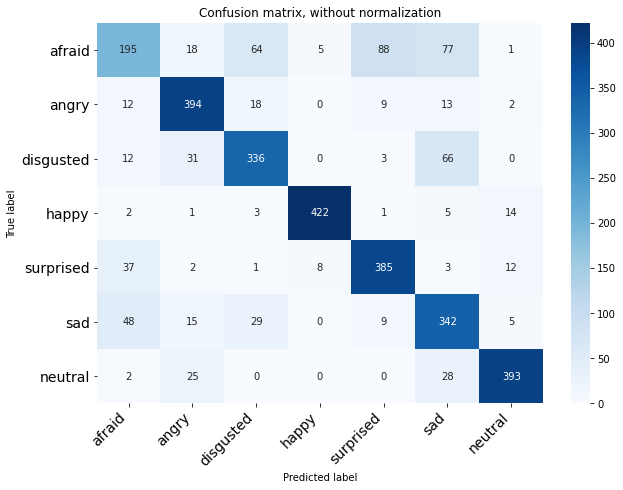

In [ ]:
fig = print_confusion_matrix(cm, label, "d", title = "Confusion matrix, without normalization")
tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/human_matrix.tex")

Total Values for the predicted classes

In [ ]:
np.sum(cm, axis = 0)

array([308, 486, 451, 435, 495, 534, 427])

and for the actual classes

In [ ]:
np.sum(cm, axis = 1)

array([448, 448, 448, 448, 448, 448, 448])

Normalized confusion matrix


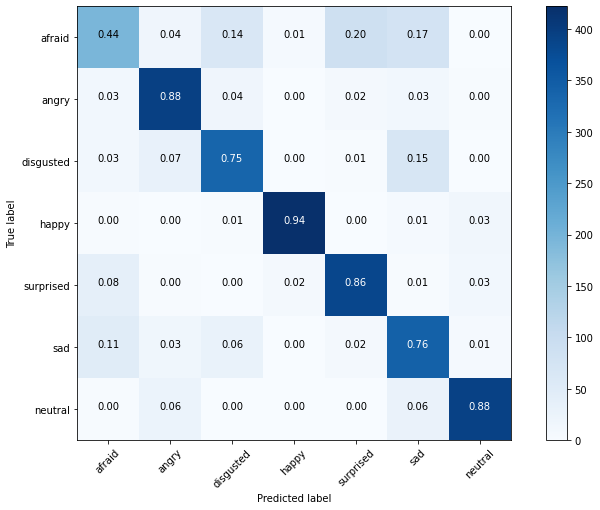

In [ ]:
# Plot normalized confusion matrix         # is equal to the recall values. Since it is normalized on the total images of the actual classes (448)
fig = plot_confusion_matrix(cm, classes=label, normalize=True, print_cm = False, title= "")
tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/human_normalized_matrix.tex")

Classification results split by participants: To compute the Mean and standard accuracy over all participants. To get a better understanding how the persons are differing in classifing the testimages. 

In [ ]:
by_participant = df.groupby("participant")

In [ ]:
def mean_and_sd_for_confusion(true_label_count, pred_label_count, normalize = False):
  goal = 448
  goal_for_single = 16
  first_inedx = np.arange(28)  # participant name
  sec_ind_pos = np.full(28, true_label_count) # true label (0-6) ["afraid", "angry", "disgusted", "happy", "surprised", "sad", "neutral"]
  third_index = np.full(28, pred_label_count) # predicted label(0-6) ["afraid", "angry", "disgusted", "happy", "surprised", "sad", "neutral"]

  single_array  = np.zeros(28, dtype = np.int8)
  for i in range(28):
    single_array[i] = full_array[first_inedx[i]][sec_ind_pos[i]][third_index[i]]

  
  if normalize == True:
    normalized = sum(single_array) / goal
    normalized_values =  single_array / goal_for_single
    norm_mean = np.mean(normalized_values)
    sd_norm = np.std(normalized_values)
    #print("Normalized:")
    #print("True label " + label[true_label_count] + "; Predicted label " + label[pred_label_count])
    #print("Correct:" + str(normalized)) 
    #print("M " + str(norm_mean) + " ,SD " + str(sd_norm))
    return normalized, norm_mean, sd_norm
  else: 
    corr = sum(single_array)
    mean = np.mean(single_array)
    sd = np.std(single_array)
    #print("NOT Normalized:")
    #print("True label " + label[true_label_count] + "; Predicted label " + label[pred_label_count])
    #print("Correct:" + str(corr) + " of " + str(goal)) 
    #print("M " + str(mean) + " ,SD " + str(sd))
    return corr, mean, sd

In [ ]:
def M_SD_for_confusion_norm():
  conf_corr_norm = np.zeros((7,7))
  conf_mean_norm = np.zeros((7,7))
  conf_sd_norm = np.zeros((7,7))
  for i in range(len(label)):
    for j in range(len(label)):
      conf_corr_norm[i][j], conf_mean_norm[i][j], conf_sd_norm[i][j] = mean_and_sd_for_confusion(i, j, True)
  return conf_corr_norm, conf_mean_norm, conf_sd_norm

def M_SD_for_confusion():
  conf_corr = np.zeros((7,7))
  conf_mean = np.zeros((7,7))
  conf_sd = np.zeros((7,7))
  for k in range(len(label)):
    for l in range(len(label)):
      conf_corr[k][l], conf_mean[k][l], conf_sd[k][l] = mean_and_sd_for_confusion(k, l, False)
  return conf_corr, conf_mean, conf_sd

In [ ]:
def normalized_confusion(df_sort_by_participants, normal = False):
  count = 0
  full_array = np.zeros((28,7,7), dtype=np.int8)
  name = df.participant.unique()
  for i in by_participant:
      test = by_participant.get_group(name[count])
      full_array[count] = confusion_matrix(test.label_num, test.num_clicked_label)
      count +=1
  
  corr_norm, mean_norm, sd_norm = np.around(M_SD_for_confusion_norm(),2)

  corr, mean, sd = np.around(M_SD_for_confusion(),2)

  if normal == True:
    print("Absolut values nomalized:")
    print(corr_norm)
    print("")
    print("Nomalized means:")
    print(mean_norm)
    print("")
    print("Nomalized standard diviation (SD):")
    print(sd_norm)
    return corr_norm, mean_norm, sd_norm
  else: 
    print("Absolut values:")
    print(corr)
    print("")
    print("Means:")
    print(mean)
    print("")
    print("Standard diviation (SD):")
    print(sd)
    return corr, mean, sd

In [ ]:
count = 0
full_array = np.zeros((28,7,7), dtype=np.int8)
name = df.participant.unique()
for i in by_participant:
    test = by_participant.get_group(name[count])
    full_array[count] = confusion_matrix(test.label_num, test.num_clicked_label)
    count +=1

In [ ]:
corr, mean, sd =  normalized_confusion(by_participant, normal = False)

Absolut values:
[[195.  18.  64.   5.  88.  77.   1.]
 [ 12. 394.  18.   0.   9.  13.   2.]
 [ 12.  31. 336.   0.   3.  66.   0.]
 [  2.   1.   3. 422.   1.   5.  14.]
 [ 37.   2.   1.   8. 385.   3.  12.]
 [ 48.  15.  29.   0.   9. 342.   5.]
 [  2.  25.   0.   0.   0.  28. 393.]]

Means:
[[ 6.96  0.64  2.29  0.18  3.14  2.75  0.04]
 [ 0.43 14.07  0.64  0.    0.32  0.46  0.07]
 [ 0.43  1.11 12.    0.    0.11  2.36  0.  ]
 [ 0.07  0.04  0.11 15.07  0.04  0.18  0.5 ]
 [ 1.32  0.07  0.04  0.29 13.75  0.11  0.43]
 [ 1.71  0.54  1.04  0.    0.32 12.21  0.18]
 [ 0.07  0.89  0.    0.    0.    1.   14.04]]

Standard diviation (SD):
[[2.65 0.77 2.07 0.38 2.1  1.53 0.19]
 [0.82 1.22 0.77 0.   0.66 0.63 0.26]
 [0.68 1.11 2.3  0.   0.31 1.56 0.  ]
 [0.26 0.19 0.31 0.84 0.19 0.38 0.82]
 [1.44 0.26 0.19 0.7  1.86 0.31 0.56]
 [1.62 0.57 1.12 0.   0.54 2.01 0.38]
 [0.26 1.4  0.   0.   0.   1.67 2.49]]


Printing a confusion matrix including the results of all participants into one and print one for each participant seperatly. Including the classification report.

In [ ]:
count = 0
name = df.participant.unique()
print("Confusion Matrix for all participants")
print(confusion_matrix(df.label_num, df.num_clicked_label))
print('Classification Report')
print(classification_report(df.label_num, df.num_clicked_label, target_names=label))
print("For Individual Participants:")
for i in by_participant:
    test = by_participant.get_group(name[count])
    print('Confusion Matrix für:',name[count])
    cm = confusion_matrix(test.label_num, test.num_clicked_label)
    print(cm)
    print('Classification Report',name[count])
    cr = classification_report(test.label_num, test.num_clicked_label, target_names = label)
    print(cr)
    count +=1

Confusion Matrix for all participants
[[195  18  64   5  88  77   1]
 [ 12 394  18   0   9  13   2]
 [ 12  31 336   0   3  66   0]
 [  2   1   3 422   1   5  14]
 [ 37   2   1   8 385   3  12]
 [ 48  15  29   0   9 342   5]
 [  2  25   0   0   0  28 393]]
Classification Report
              precision    recall  f1-score   support

      afraid       0.63      0.44      0.52       448
       angry       0.81      0.88      0.84       448
   disgusted       0.75      0.75      0.75       448
       happy       0.97      0.94      0.96       448
   surprised       0.78      0.86      0.82       448
         sad       0.64      0.76      0.70       448
     neutral       0.92      0.88      0.90       448

    accuracy                           0.79      3136
   macro avg       0.79      0.79      0.78      3136
weighted avg       0.79      0.79      0.78      3136

For Individual Participants:
Confusion Matrix für: EJ5
[[12  0  1  0  0  3  0]
 [ 0 15  0  0  1  0  0]
 [ 1  0 14  0  0  1  0

To compute the mean and standard deviation of the classification reports including the precision, recall and f-scores.

In [ ]:
from sklearn.metrics import precision_recall_fscore_support as score
count = 0
participant_all = []
precision_all = []
recall_all = []
fscore_all = []
#full = pd.DataFrame(columns = ['participant', 'precision', 'recall', 'fscore'])
name = df.participant.unique()
for i in by_participant:
    test = by_participant.get_group(name[count])
    precision,recall,fscore,support=score(test.label_num, test.num_clicked_label, average='macro')
    participant_all.append(name[count])
    precision_all.append(precision)
    recall_all.append(recall)
    fscore_all.append(fscore)
    #cm = confusion_matrix(test.label_num, test.num_clicked_label)
    #print(cm)
    #print('Classification Report',name[count])
    #cr = classification_report(test.label_num, test.num_clicked_label, target_names = label)
    #print(cr)
    count +=1

exp_data = {'participant':participant_all, 'precision':precision_all, 'recall':recall_all, 'fscore':fscore_all}
exp_dataframe = pd.DataFrame(exp_data)

np.around(exp_dataframe.describe(),2)

,precision,recall,fscore
count,28.00,28.00,28.00
mean,0.80,0.79,0.78
std,0.04,0.05,0.05
min,0.70,0.65,0.64
25%,0.76,0.76,0.75
50%,0.81,0.79,0.78
75%,0.83,0.81,0.81
max,0.86,0.86,0.86


In the eye tracker experiment showed the participants a mean accuracy (fscore) of 0.78 with a range (0.64 - 0.86). A mean precision of 0.80 with a range (0.70 - 0.86). Mean recall 0.79 range (0.65 - 0.86).


**Getting the Range Data from each classification report.**

In [ ]:
count = 0
name = df.participant.unique()
full_dataframe = pd.DataFrame(columns = ['label', 'precision', 'recall', 'f1-score','participant'])
print("Dataframe for displaying the individual ranges:")
for i in by_participant:
    test = by_participant.get_group(name[count])
    cr = classification_report(test.label_num, test.num_clicked_label, target_names = label, output_dict= True)
    data_frame = pd.DataFrame.from_dict(cr)
    data_frame_transposed = data_frame.T
    data_frame_short = data_frame_transposed[:7]   # cut out the accuracy and mean values. Only keeping the emotions
    data_frame_short["participant"] = name[count] # appending a colum with the person
    data_frame_short = data_frame_short.drop(['support'], axis=1)
    reset = data_frame_short.reset_index()
    reset = reset.rename(columns={"index": "label"})
    full_dataframe = pd.concat([full_dataframe, reset], sort = False)
    count +=1

Dataframe for displaying the individual ranges:


In [ ]:
np.around(full_dataframe.groupby("label").agg(['mean','min', 'max']),2)

precision             recall             f1-score            
               mean   min   max   mean   min   max     mean   min   max
label                                                                  
afraid         0.66  0.33  1.00   0.44  0.06  0.75     0.50  0.11  0.77
angry          0.82  0.62  1.00   0.88  0.69  1.00     0.85  0.71  0.97
disgusted      0.77  0.47  0.92   0.75  0.38  1.00     0.74  0.50  0.88
happy          0.97  0.84  1.00   0.94  0.81  1.00     0.96  0.88  1.00
neutral        0.92  0.79  1.00   0.88  0.38  1.00     0.89  0.52  1.00
sad            0.66  0.41  0.89   0.76  0.50  0.94     0.70  0.53  0.81
surprised      0.79  0.61  1.00   0.86  0.50  1.00     0.82  0.62  0.94

In [ ]:
np.around(full_dataframe.groupby("label").describe(),2)

precision                          ... f1-score                        
              count  mean   std   min   25%  ...      min   25%   50%   75%   max
label                                        ...                                 
afraid         28.0  0.66  0.17  0.33  0.58  ...     0.11  0.43  0.54  0.59  0.77
angry          28.0  0.82  0.10  0.62  0.74  ...     0.71  0.81  0.87  0.89  0.97
disgusted      28.0  0.77  0.10  0.47  0.71  ...     0.50  0.69  0.75  0.81  0.88
happy          28.0  0.97  0.04  0.84  0.94  ...     0.88  0.93  0.97  0.97  1.00
neutral        28.0  0.92  0.07  0.79  0.85  ...     0.52  0.84  0.91  0.97  1.00
sad            28.0  0.66  0.10  0.41  0.60  ...     0.53  0.67  0.72  0.75  0.81
surprised      28.0  0.79  0.10  0.61  0.73  ...     0.62  0.79  0.83  0.86  0.94

[7 rows x 24 columns]

Check if single Trials were often missclassified. (Used to display next to the human heatmaps)

In [ ]:
df["Image_name"] =  df["Image"].str.slice(start=-11, stop=-4)
df["Actor"] =  df["Image_name"].str.slice(start=0, stop=4)

In [ ]:
df["correct"] = np.where(df["label_num"] ==  df["num_clicked_label"], 1, 0)
df["incorrect"] = np.where(df["label_num"] ==  df["num_clicked_label"], 0, 1)

In [ ]:
number_of_corr = df.groupby(["Image_name"])["correct"].agg(sum).reset_index()

In [ ]:
number_of_corr.to_csv("/content/gdrive/My Drive/Thesis/nr_correct_human_trials.csv", sep=',', encoding='utf-8' )

In [ ]:
number_of_correct =  pd.read_csv("/content/gdrive/My Drive/Thesis/nr_correct_human_trials.csv")

Read in the data with correct trials

In [ ]:
# Directory with the test images
data_dir = "/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/"
# Directory with the human heatmaps
#human_heatmap_dir = "/content/gdrive/My Drive/Thesis/human_heatmaps/"
human_heatmap_dir = "/content/gdrive/My Drive/Thesis/Heatmap_array/"
number_of_correct =  pd.read_csv("/content/gdrive/My Drive/Thesis/nr_correct_human_trials.csv")

#creating dummy arrays to store the images (data) and the human heatmaps
data = np.zeros((112, 224,224,3), dtype = np.float32)
human_heatmap = np.zeros((112, 224,224), dtype = np.float32)
names = [] # name of the image
labels = [] #labels
correct_human = []
j = 0 # index 
for i in os.listdir(data_dir):
  try:
    # Load the image resize and append to data array
    name = data_dir + i
    img = cv2.imread(name, cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
    img = cv2.resize(img, (224,224))   
    b,g,r = cv2.split(img)           # get the single color channels and flip them to account for the flipped reading by opencv
    rgb_img1 = cv2.merge([r,g,b]) 
    data[j] = rgb_img1
    names.append(i[:7])

    # if statement to extract and append the right label
    if i[-7:-5] == "AF":
        labels_num = 0
    elif i[-7:-5] == "AN":
        labels_num = 1
    elif i[-7:-5] == "DI":
        labels_num = 2
    elif i[-7:-5] == "HA":
        labels_num = 3
    elif i[-7:-5] == "NE":
        labels_num = 4
    elif i[-7:-5] == "SA":
        labels_num = 5
    else:
        labels_num = 6
    
    labels.append(labels_num)



    for index, row in number_of_correct.iterrows():
      if row['Image_name'] == i[:7]:
        correct_human.append(row['correct'])
    # Load the respective human heatmap and store it in the human heatmap array
    
    #heatmap_name = "Heatmap_array" + i[:7] + ".npy"   # for coorect and inccorect classifications in the human heatmaps
    heatmap_name = i[:7] + ".npy"   # heatmaps only with correct human trials
    human_heatmap[j] = np.load(human_heatmap_dir + heatmap_name)

    j += 1
  except:
    print(name)
    print("File that is no png")

print("Total number of images:"+ str(j))

/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/.ipynb_checkpoints
File that is no png
Total number of images:112


In [ ]:
# turning the list of labels to an array 
new_labels = np.zeros((112, 7))
for i in range(len(new_labels)):
  np.put(new_labels[i], labels[i], 1)

### Raw Data

At first we read in the raw data to compute kernel densitiy estimation plots for each trial over all partipants. These build the foundation for the human heatmaps.

In [ ]:
#directory with the participants data
data_dir = "/content/gdrive/My Drive/Thesis/raw_data/"
participants_count = 0
AOI = pd.read_csv("/content/gdrive/My Drive/Thesis/AOI.csv")
all_participants = pd.DataFrame(columns = ['block', 'xp', 'yp', 'time',
       'ts', 'ID', 'label', 'Emotion_choose.clicked_name', 'participant',
       'correct', 'Image','New_Image', 'Unnamed: 0', 'filename', 'eyes_xmin',
       'eyes_ymin', 'eyes_xmax', 'eyes_ymax', 'nose_xmin', 'nose_ymin',
       'nose_xmax', 'nose_ymax', 'mouth_xmin', 'mouth_ymin', 'mouth_xmax',
       'mouth_ymax'])

#Loop over all files add the AOI regions and append to the dataframe "all_particpants" for the whole data
for file in os.listdir(data_dir):
  try:
    print("read in: " + file)
    data = pd.read_csv(data_dir + file)
    data = data.dropna()
    data["New_Image"] = data.Image.apply(lambda x: x[-11:])
    full = pd.merge(data, AOI, left_on= data["New_Image"], right_on=AOI["filename"] )
    full.rename(columns={'key_0':'Picture'}, inplace=True)
    all_participants = pd.concat([all_participants, full])
    #print("read in:" + file)
    participants_count +=1
  except:
    print("No csv file")
print("Loaded data of: " + str(participants_count) + " participants")

read in: .ipynb_checkpoints
No csv file
read in: A47XZ.csv
read in: C5AP.csv
read in: A24282.csv
read in: AFD1.csv
read in: BA43X.csv
read in: CB1.csv
read in: AJ8RD.csv
read in: CT381.csv
read in: EC0617.csv
read in: iakr.csv
read in: k5s1.csv
read in: EJ5.csv
read in: JR61.csv
read in: KF783.csv
read in: L40.csv
read in: PA651.csv
read in: KT125.csv
read in: KF39.csv
read in: M69V2.csv
read in: PK15.csv
read in: S8TV.csv
read in: TH371.csv
read in: SS0393.csv
read in: UV729.csv
read in: VB318.csv
read in: TSH030.csv
read in: TT431.csv
read in: WW1996.csv
Loaded data of: 28 participants


The raw data of 28 Participants was read in. (Matches the participants that are included in the experiment.) The data of two participnats was excluded because of instable recordings. 

Subsetting the all_participants dataframe into the single trials and safe each to disk

In [ ]:
os.chdir("/content/gdrive/My Drive/Thesis/Trial_Subsets")
trial_count = 0
for image in np.unique(all_participants["Picture"]):
    trial_count += 1
    subset = all_participants[all_participants["Picture"] == str(image)]
    subset.to_csv(str(image[:7]+".csv"))
                  
print(trial_count)

112


Lists for each Trial how many participants classified the picture correct|wrong

In [ ]:
sub_dir = "/content/gdrive/My Drive/Thesis/Trial_Subsets/"
stats = pd.DataFrame(columns = ['Picture', 'correct','wrong'])
picture = []
correct = []
wrong = []
for file in os.listdir(sub_dir):
    test = pd.read_csv(sub_dir + file)
    prob = np.array(test.groupby("correct")["participant"].nunique())
    if len(prob) == 1:
        correct.append(prob[0])
        wrong.append(0)
    else:
        correct.append(prob[0])
        wrong.append(prob[1])
    picture.append(file)
    #print("Image "+ str(file) + " was classfied correct | wrong" + str(prob)+ " times.")
df = pd.DataFrame(list(zip(picture, correct, wrong)), columns =['picture', 'correct', 'wrong']) 

In [ ]:
np.around(df.describe(),2)

,correct,wrong
count,112.00,112.00
mean,22.03,5.97
std,6.65,6.65
min,2.00,0.00
25%,19.75,1.00
50%,24.00,4.00
75%,27.00,8.25
max,28.00,26.00


#### Human Heatmaps by Emotion

In this section the heat maps for human eye movements are made using the raw eyelink data. The raw data is used to consider the fixation duration. 

**Heatmaps only correct vpn fixations:**
The heatmaps for the (humans) human participants are created using the fixations during trials that were correctly classified by the participants. 
(To load the heatmap arrays with only the correct da the numpy files in the path "/content/gdrive/My Drive/Thesis/Heatmap_array/" only containing the image name should be used. For example "AF04AFS.npy")

**All fixation regardless of correct| incorrect:**
Another possibility is to use all fixation points regardless of whether the trial was correctly or incorrectly classified by the test person ( herefore the numpy arrays in the path "/content/gdrive/My Drive/Thesis/Heatmap_array/" containing "Heatmap_array" should be used. For example "Heatmap_arrayAF04AFS.npy")

In [ ]:
# Takes around 2 hours
data_dir = "/content/gdrive/My Drive/Thesis/Trial_Subsets/"
j = 0
for i in os.listdir(data_dir):
    image_to_heatmap(i)   # with this function the heatmaps are generated and appended
    print("converted image: "+i+" - "+str(j))
    j += 1

Overview Plot

In [ ]:
def human_heatmap_overview(trial):
  hfont = {'fontname':'serif'}
  data_dir = "/content/gdrive/My Drive/Thesis/all_fixations/fixations" + trial + "/"
  heatmap_dir = "/content/gdrive/My Drive/Thesis/Heatmap_array/" + trial +".npy"
  number = len(os.listdir(data_dir)) + 1

  fig = plt.figure(constrained_layout=True, figsize=(20,5))
  fig.tight_layout()
  spec = gridspec.GridSpec(ncols= number, nrows=1, figure=fig)

  ######## random ##################
  count = 0
  for i in os.listdir(data_dir):
    im = plt.imread(data_dir + i)
    im = im[64:221, 143:299]      # if i want to use with gray surrounding
    f_ax1_p4 = fig.add_subplot(spec[0, count])
    f_ax1_p4.imshow(im)
    f_ax1_p4.set_title('Subject ' +  str(count + 1) + "\n",fontsize=30, **hfont)
    f_ax1_p4.set_xticks([])
    f_ax1_p4.set_yticks([])
    count +=1

  heatmap = np.load(heatmap_dir)
  f_ax1_p2 = fig.add_subplot(spec[0, count])
  f_ax1_p2.imshow(heatmap, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
  f_ax1_p2.set_title('Heatmap \n',fontsize=30, **hfont)
  f_ax1_p2.set_xticks([])
  f_ax1_p2.set_yticks([])

  return fig

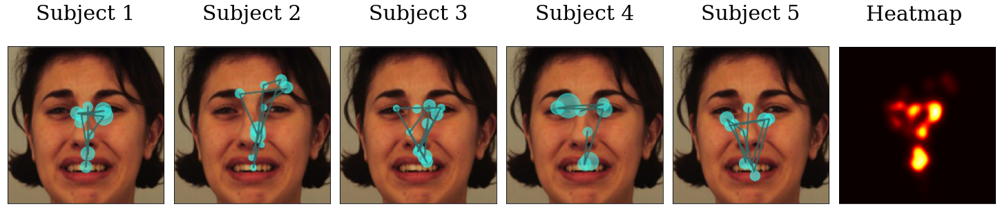

In [ ]:
fig = human_heatmap_overview("AF17AFS")
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/human_heat_overview.pdf') 

In [ ]:
# Test overlaying heatmaps

def mean_heatmap(expression):
  heatmap_path = "/content/gdrive/My Drive/Thesis/Heatmap_array/"
  array = np.zeros(16, dtype= object)
  count = 0
  for i in os.listdir(heatmap_path):
    if i[4:7] == expression:
      array[count] =  np.load(heatmap_path + i)
      count+=1

  merge = np.sum(array, axis=0) / 16
  
  #plt.imshow(merge, cmap='hot', interpolation='nearest', clim = (0.0,1.0))

  return merge 

In [ ]:
AFS = mean_heatmap("AFS")
ANS = mean_heatmap("ANS")
DIS = mean_heatmap("DIS")
HAS = mean_heatmap("HAS")
NES = mean_heatmap("NES")
SAS = mean_heatmap("SAS")
SUS = mean_heatmap("SUS")

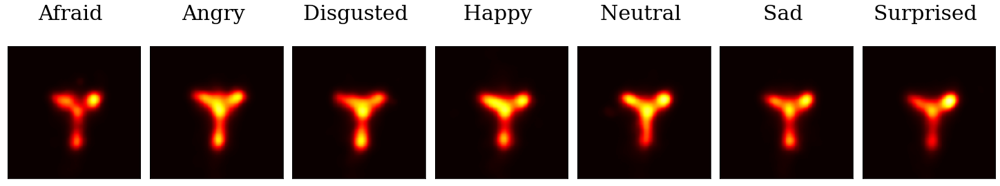

In [ ]:
AFS = mean_heatmap("AFS")
ANS = mean_heatmap("ANS")
DIS = mean_heatmap("DIS")
HAS = mean_heatmap("HAS")
NES = mean_heatmap("NES")
SAS = mean_heatmap("SAS")
SUS = mean_heatmap("SUS")

fig = plt.figure(constrained_layout=True, figsize=(20,5))
fig.tight_layout()
spec = gridspec.GridSpec(ncols= 7, nrows=1, figure=fig)

f_ax1_p1 = fig.add_subplot(spec[0, 0])
f_ax1_p1.imshow(AFS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p1.set_title('Afraid \n',fontsize=30, **hfont)
f_ax1_p1.set_xticks([])
f_ax1_p1.set_yticks([])

f_ax1_p2 = fig.add_subplot(spec[0, 1])
f_ax1_p2.imshow(ANS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p2.set_title('Angry \n',fontsize=30, **hfont)
f_ax1_p2.set_xticks([])
f_ax1_p2.set_yticks([])

f_ax1_p3 = fig.add_subplot(spec[0, 2])
f_ax1_p3.imshow(DIS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p3.set_title('Disgusted \n',fontsize=30, **hfont)
f_ax1_p3.set_xticks([])
f_ax1_p3.set_yticks([])

f_ax1_p4 = fig.add_subplot(spec[0, 3])
f_ax1_p4.imshow(HAS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p4.set_title('Happy \n',fontsize=30, **hfont)
f_ax1_p4.set_xticks([])
f_ax1_p4.set_yticks([])

f_ax1_p5 = fig.add_subplot(spec[0, 4])
f_ax1_p5.imshow(NES, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p5.set_title('Neutral \n',fontsize=30, **hfont)
f_ax1_p5.set_xticks([])
f_ax1_p5.set_yticks([])

f_ax1_p6 = fig.add_subplot(spec[0, 5])
f_ax1_p6.imshow(SAS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p6.set_title('Sad \n',fontsize=30, **hfont)
f_ax1_p6.set_xticks([])
f_ax1_p6.set_yticks([])

f_ax1_p7 = fig.add_subplot(spec[0, 6])
f_ax1_p7.imshow(SUS, cmap='hot', interpolation='nearest', clim = (0.0,1.0))
f_ax1_p7.set_title('Surprised \n',fontsize=30, **hfont)
f_ax1_p7.set_xticks([])
f_ax1_p7.set_yticks([])

plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/merged_heatmaps.pdf') 

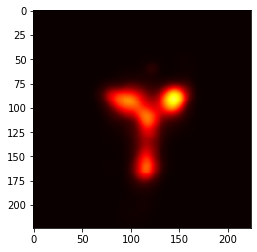

In [ ]:
mean_heatmap("AFS")

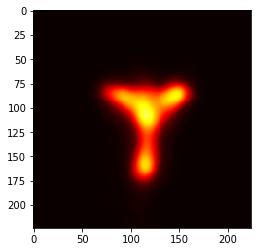

In [ ]:
mean_heatmap("ANS")

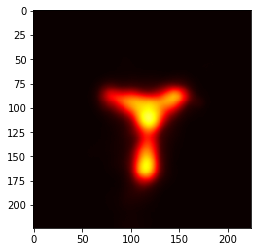

In [ ]:
mean_heatmap("DIS")

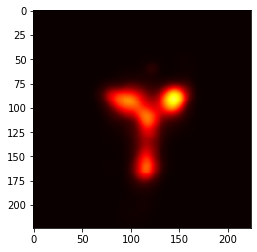

In [ ]:
plt.imshow(test, cmap='hot', interpolation='nearest', clim = (0.0,1.0))

In [ ]:
heat_1 = np.load("/content/gdrive/My Drive/Thesis/Heatmap_array/AF04AFS.npy")
heat_2 = np.load("/content/gdrive/My Drive/Thesis/Heatmap_array/AF05AFS.npy")

heat_3 = (heat_1 + heat_2 ) /2


plt.imshow(heat_3, cmap='hot', interpolation='nearest', clim = (0.0,1.0))

#### Human Heatmaps (only fixations of correctly classified trials)

##### Afraid


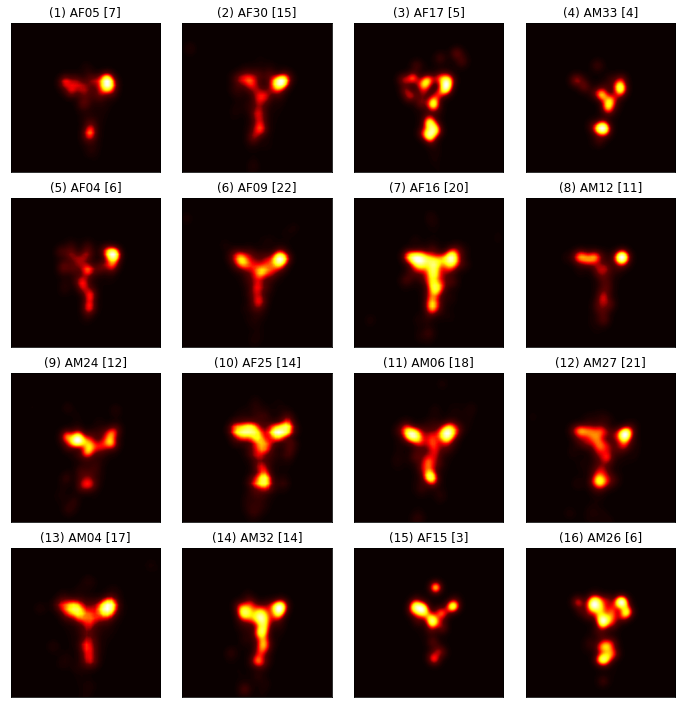

In [ ]:
human_heatmaps_with_corr
fig = human_heatmaps_with_corr(0, labels, human_heatmap, correct_human)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_afraid.pdf')  

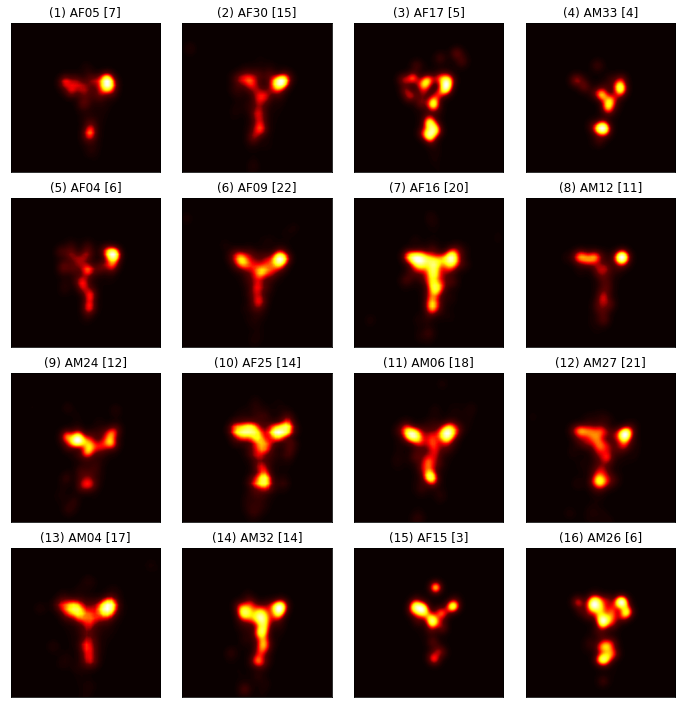

In [ ]:
human_heatmaps_with_corr(0, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_afraid.pdf') 

##### Angry

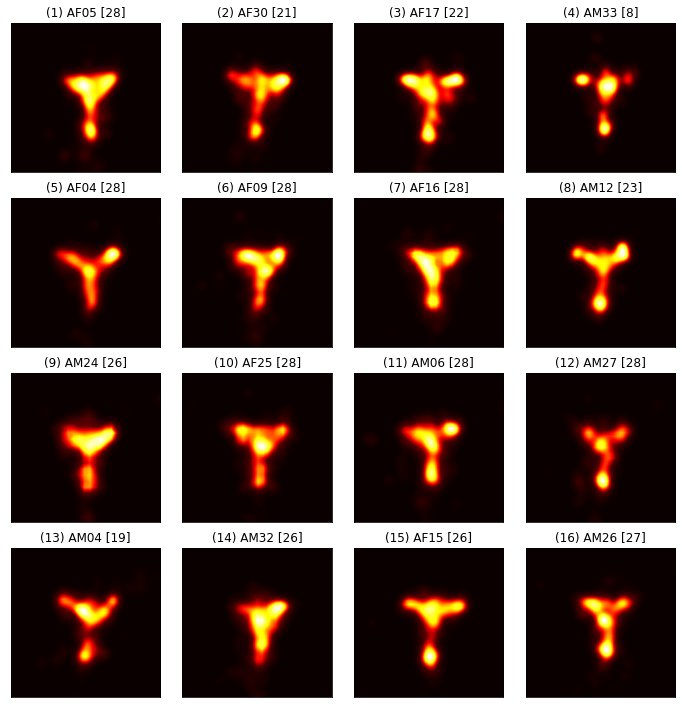

In [ ]:
human_heatmaps_with_corr(1, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_angry.pdf') 

##### Disgusted

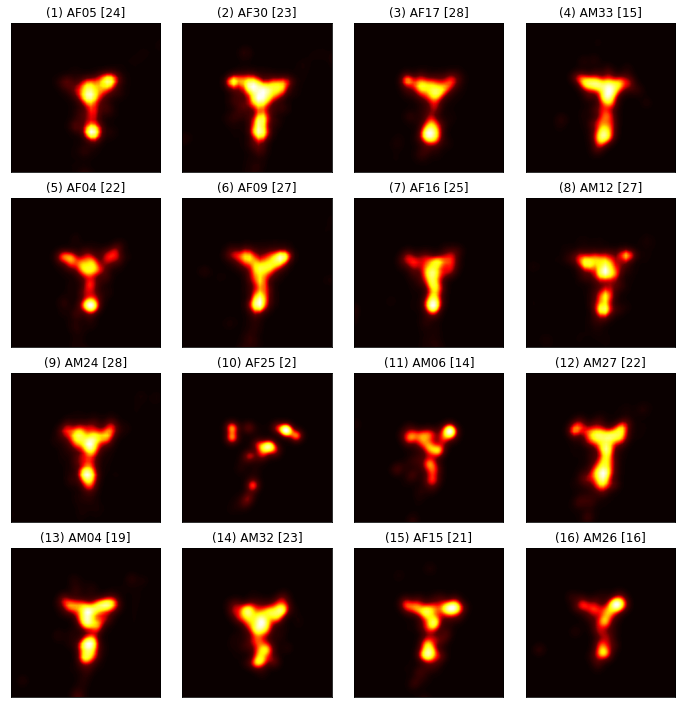

In [ ]:
human_heatmaps_with_corr(2, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_disgusted.pdf') 

##### Happy

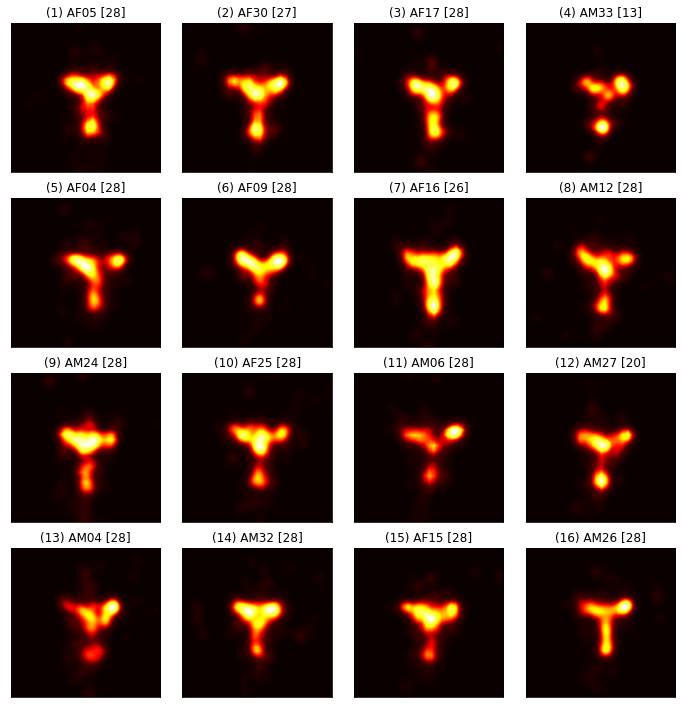

In [ ]:
human_heatmaps_with_corr(3, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_happy.pdf') 

##### Neutral

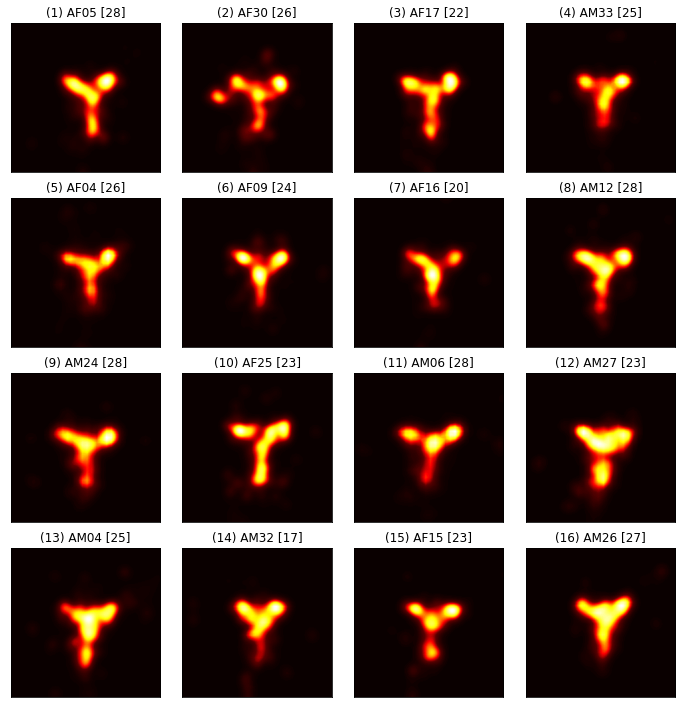

In [ ]:
human_heatmaps_with_corr(4, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_neutral.pdf') 

##### Sad

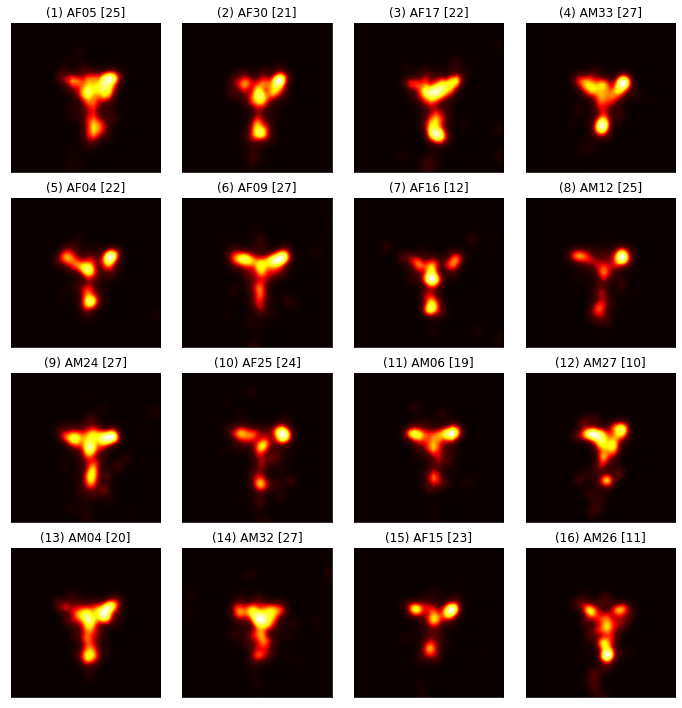

In [ ]:
human_heatmaps_with_corr(5, labels, human_heatmap, correct_human)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_sad.pdf') 

##### Surprise

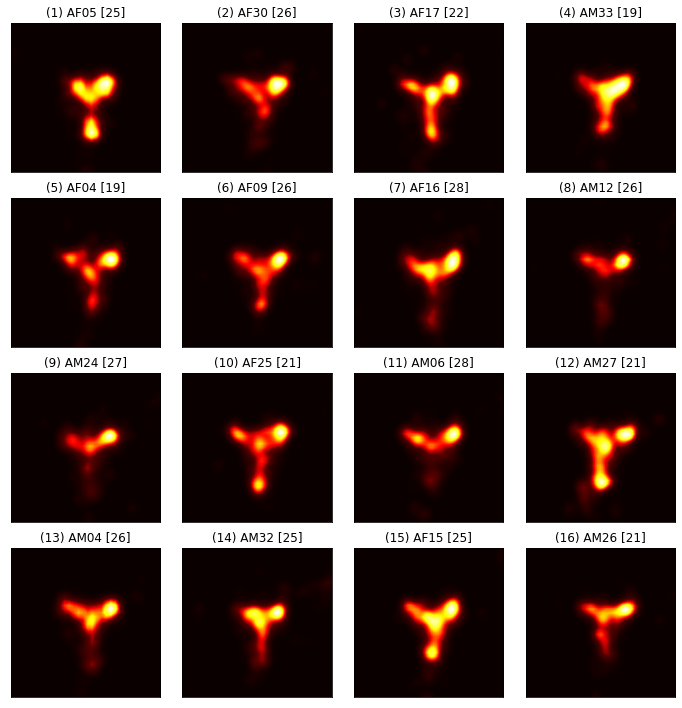

In [ ]:
human_heatmaps_with_corr(6, labels, human_heatmap, correct_human) 
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/humanhmap_surprised.pdf') 

#### Human Heatmaps (all fixations (not used in permutation analysis))

##### Afraid

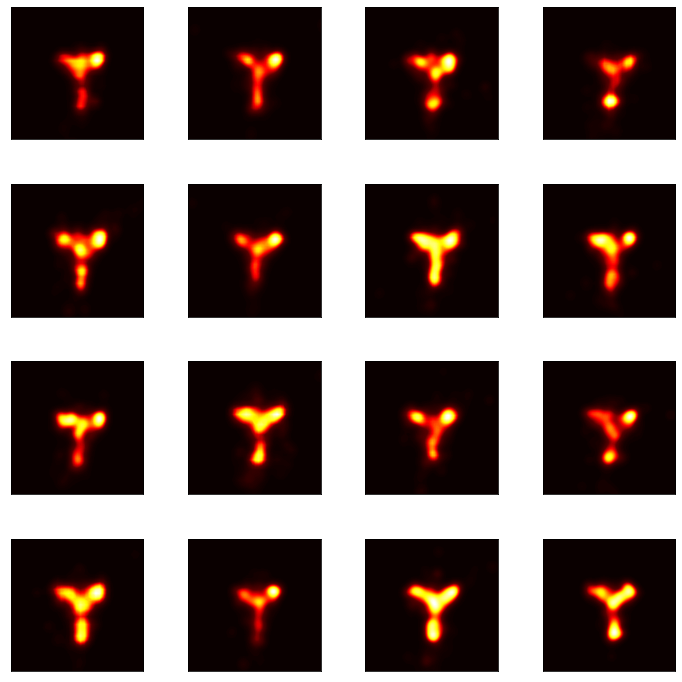

In [ ]:
human_heatmaps(0, labels, human_heatmap) 

##### Angry

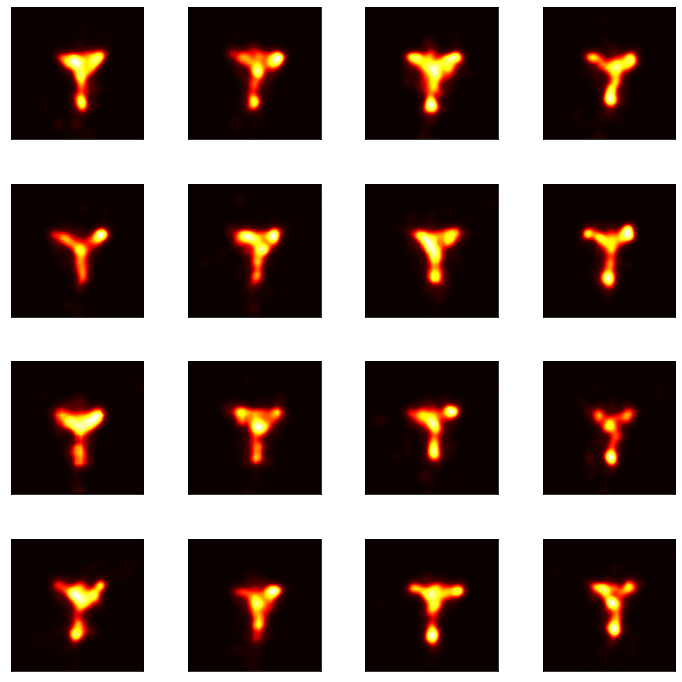

In [ ]:
human_heatmaps(1, labels, human_heatmap)  # with all trials

##### Disgusted

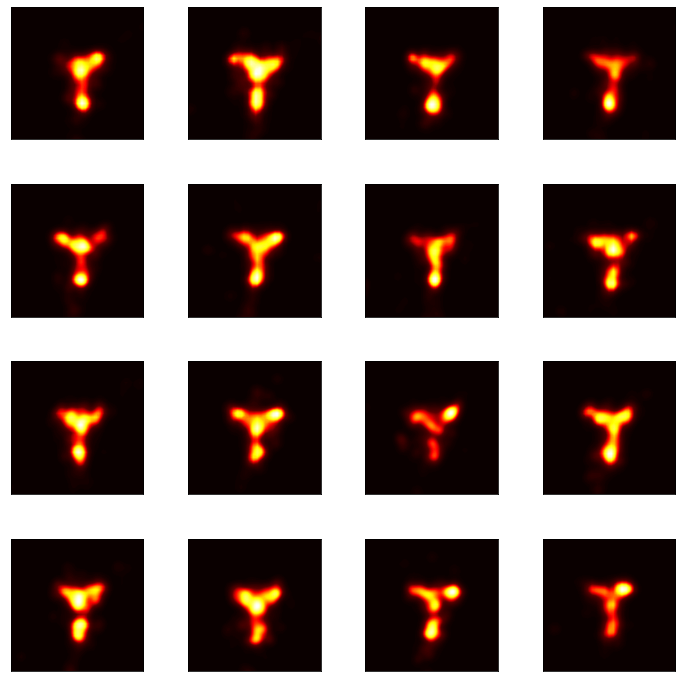

In [ ]:
human_heatmaps(2, labels, human_heatmap)

##### Happy

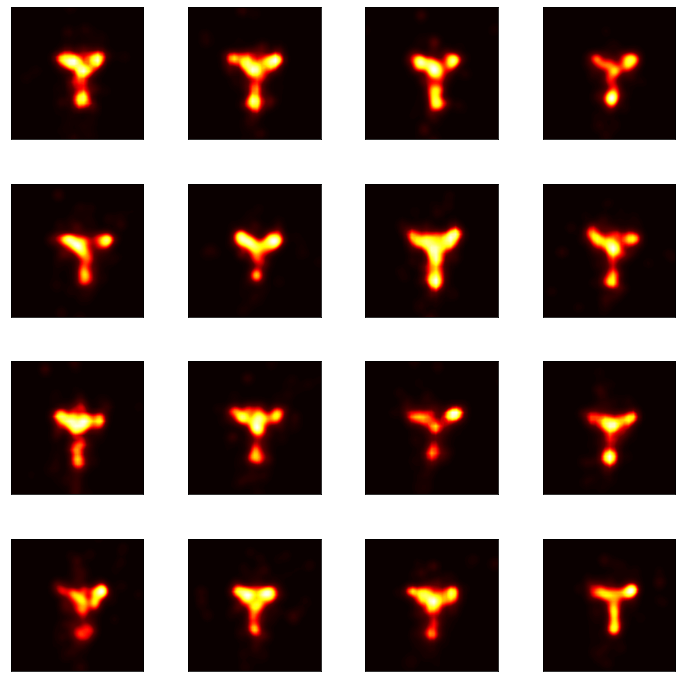

In [ ]:
human_heatmaps(3, labels, human_heatmap)

##### Neutral

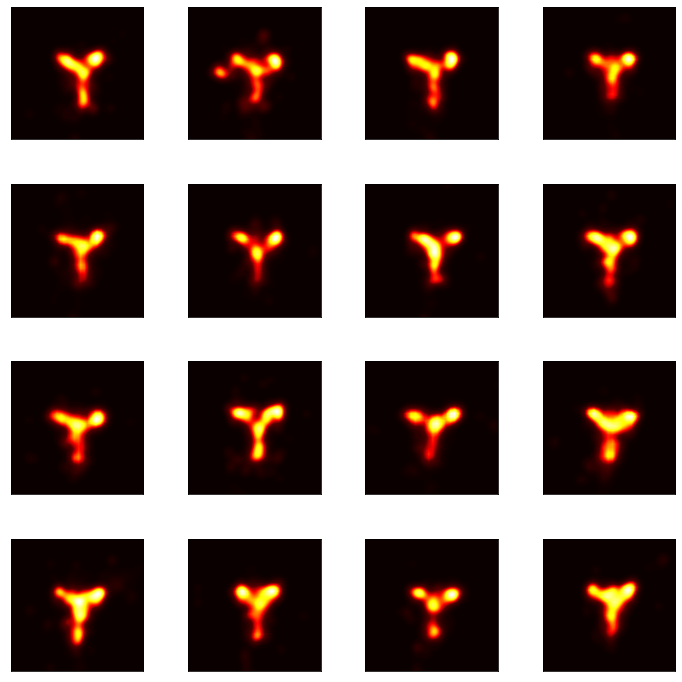

In [ ]:
human_heatmaps(4, labels, human_heatmap)

##### Sad

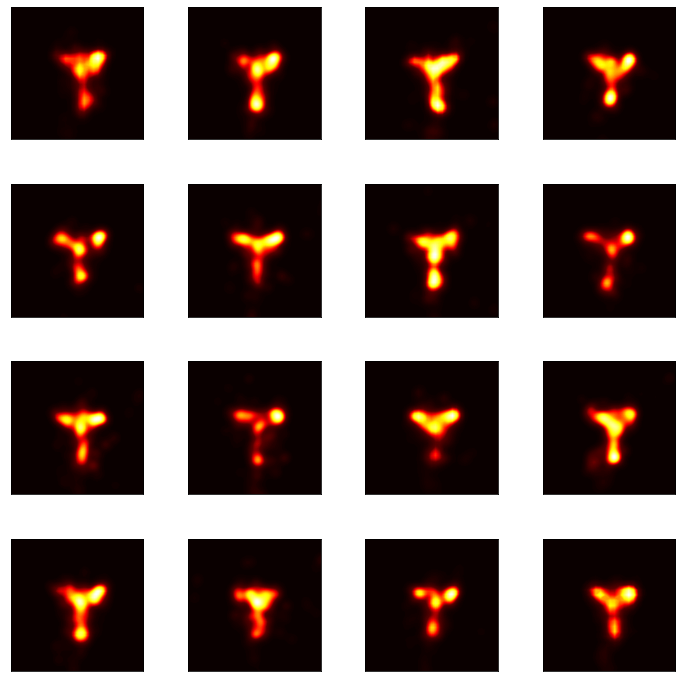

In [ ]:
human_heatmaps(5, labels, human_heatmap)

##### Surprised

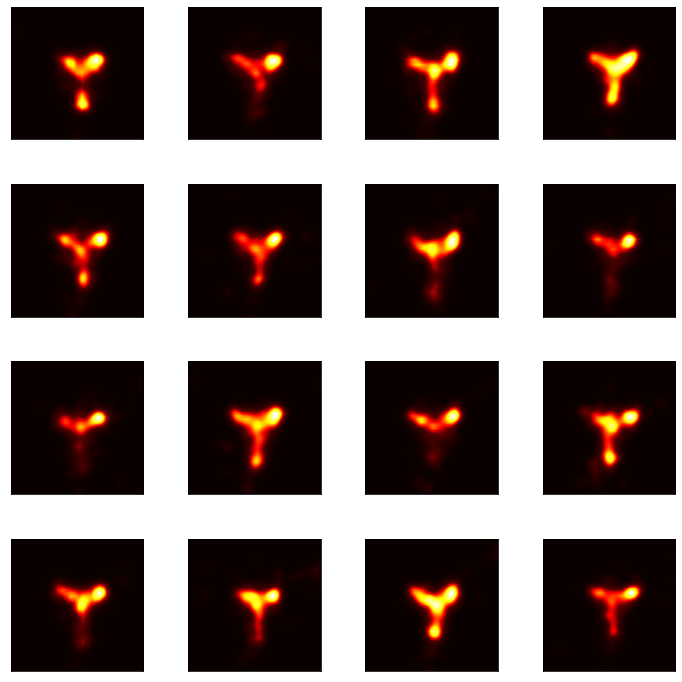

In [ ]:
human_heatmaps(6, labels, human_heatmap)

### Event Data (containing fixation and saccades)

#### Human Fixation plots

Fixation Maps for each Trial

!! Für die Fixation maps muss ich wieder die Data analysis daten von R einlesen. Damit ich zugriff auf die fixations und saccades habe. 

In [ ]:
#directory with the participants data
data_dir = "/content/gdrive/My Drive/Thesis/Data_analysis/"
participants_count = 0
AOI = pd.read_csv("/content/gdrive/My Drive/Thesis/AOI.csv")
all_participants = pd.DataFrame(columns = ['Picture', 'block', 'sacc_stime', 'sacc_etime', 'sxp', 'syp', 'exp',
       'eyp', 'screen.x', 'screen.y', 'fix_stime', 'fix_etime', 'axp', 'ayp',
       'dur', 'ID', 'label', 'Emotion_choose.clicked_name', 'participant',
       'correct', 'Image','New_Image', 'Unnamed: 0', 'filename', 'eyes_xmin',
       'eyes_ymin', 'eyes_xmax', 'eyes_ymax', 'nose_xmin', 'nose_ymin',
       'nose_xmax', 'nose_ymax', 'mouth_xmin', 'mouth_ymin', 'mouth_xmax',
       'mouth_ymax'])

#Loop over all files add the AOI regions and append to the dataframe "all_particpants" for the whole data
for file in os.listdir(data_dir):
  try:
    print("read in: " + file)
    data = pd.read_csv(data_dir + file)
    data = data.dropna()
    data["New_Image"] = data.Image.apply(lambda x: x[-11:])
    full =  pd.merge(data, AOI, left_on= data["New_Image"], right_on=AOI["filename"] )
    full.rename(columns={'key_0':'Picture'}, inplace=True)
    all_participants = pd.concat([all_participants, full])
    participants_count +=1
  except:
    print("No csv file")
print("Loaded data of: " + str(participants_count) + " participants")

read in: .ipynb_checkpoints
No csv file
read in: iakr.csv
read in: TSH030.csv
read in: C5AP.csv
read in: M69V2.csv
read in: A24282.csv
read in: EJ5.csv
read in: TT431.csv
read in: WW1996.csv
read in: L40.csv
read in: AFD1.csv
read in: VB318.csv
read in: PA651.csv
read in: KT125.csv
read in: JR61.csv
read in: k5s1.csv
read in: KF783.csv
read in: PK15.csv
read in: KF39.csv
read in: BA43X.csv
read in: UV729.csv
read in: CT381.csv
read in: TH371.csv
read in: SS0393.csv
read in: AJ8RD.csv
read in: A47XZ.csv
read in: S8TV.csv
read in: EC0617.csv
read in: CB1.csv
Loaded data of: 28 participants


In [ ]:
os.chdir("/content/gdrive/My Drive/Thesis/Trial_Subsets_fixations")
trial_count = 0
for image in np.unique(all_participants["Picture"]):
    trial_count += 1
    subset = all_participants[all_participants["Picture"] == str(image)]
    subset.to_csv(str(image[:7]+".csv"))
                  
print(trial_count)

112


In [ ]:
def safe_fixation_maps(data, AOI_image, show, save, save_path = "/content/gdrive/My Drive/Thesis/"):

    
    # if it should be shown with the AOI backround or without
    data = data[data["correct"] == "correct"]
    if save:
        top_dir = save_path + "all_fixations/"
        if not os.path.exists(top_dir):
            os.makedirs(top_dir)
        os.chdir(top_dir)
        directory = top_dir + "fixations" + data["Picture"].iloc[0][:7]
        if not os.path.exists(directory):
            os.makedirs(directory)
        os.chdir(directory)

    for participant in np.unique(data["participant"]):
        vpn_data = data[data["participant"] == participant]
        if AOI_image:
            image = plt.imread("/content/gdrive/My Drive/Thesis/AOI_images/" + vpn_data["Picture"].iloc[0])
        else:
            image = plt.imread("/content/gdrive/My Drive/Thesis/test_images_with_backround/" + vpn_data["Picture"].iloc[0])
            
        fig = plt.figure()
        ax1 = fig.add_subplot(1, 1, 1)
        ax1.imshow(image)
        ax1.plot(vpn_data.sxp, vpn_data.syp, linestyle='solid', color='#326865')
        ax1.scatter(vpn_data.axp, vpn_data.ayp, s = (vpn_data.dur / 25) ** 2, alpha = 0.1, color = '#41F9EF')
        plt.axis('off')
        plt.close()
        #plt.title(participant)
        if show:
            plt.show(fig)
            
        if save:
            fig.savefig(participant + "_fixmap.jpg")

In [ ]:
trial_dir = "/content/gdrive/My Drive/Thesis/Trial_Subsets_fixations/"
trials = []
for file in os.listdir(trial_dir):
  if file [-3:] == "csv":
    name = trial_dir + file
    trials.append(name)
  else:
    print("Skipped because no .csv file")

Skipped because no .csv file


Plotting Fixations

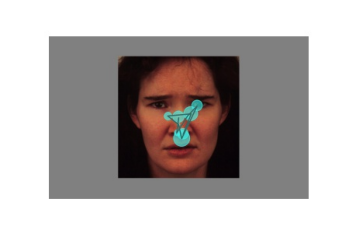

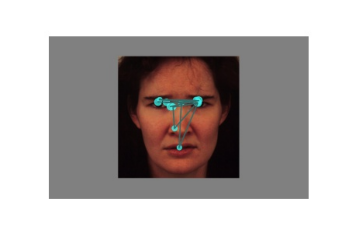

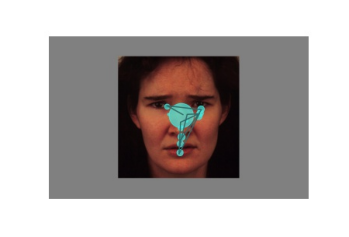

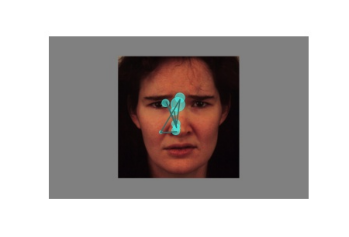

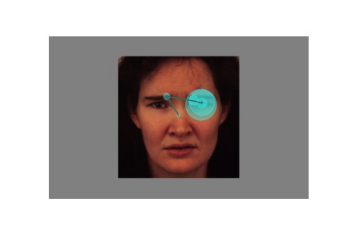

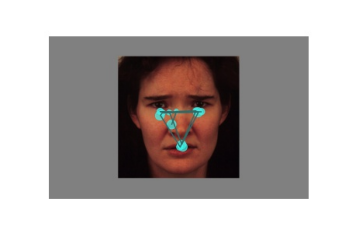

In [ ]:
name_of_trial = "/content/gdrive/My Drive/Thesis/all_fixations/fixationsAF04AFS/"

for i in os.listdir(name_of_trial):
  img = cv2.imread(name_of_trial + i, cv2.COLOR_BGR2RGB)
  fig = plt.figure(figsize=(6, 6))
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.axis("off")

## Explaining the CNN using LRP

### Load Model

In [ ]:
#load the keras model from the google drive
model = load_model('/content/gdrive/My Drive/Thesis/Networks/saved-model-16-0.93.hdf5')












Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where




In [ ]:
#load model history
history_dict = json.load(open("/content/gdrive/My Drive/Thesis/Networks/historyKDEF_model_100.json", 'r'))

#### Alternativ: Load the data using keras test generator (Not used)


```python
test_data = pd.read_csv("/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/data_csv/test_data.csv")
# adapt the pathes to fit with the drive structur on the google drive
new_test = test_data["Image"].str.split("Test/", n = 1, expand = True)
test_data['Image'] = new_test[1]
```
Reading in the data using the keras ImageDataGenerator:

```python
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_generator = test_datagen.flow_from_dataframe(
  dataframe = test_data,
  directory = "/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test",
  x_col = "Image",
  y_col="label",
  color_mode="rgb",
  class_mode="categorical",
  target_size = (224,224),
  batch_size = 1, shuffle=False)
```

show the classes with the respective indices

```python
test_generator.class_indices
```

Extract the data and label arrays from the generator

```python
data_gen = []     # store all the generated data batches
labels_gen = []   # store all the generated label batches
max_iter = 112  # maximum number of iterations, in each iteration one batch
# is generated; the proper value depends on batch size and size of whole data
i = 0
for d, l in test_generator:
  data_gen.append(d)
  labels_gen.append(l)
  i += 1
  if i == max_iter:
    break
```

reshaping the data and the labels and store them as arrays
```python
data_gen = np.array(data_gen)
data_gen = np.reshape(data_gen, (data_gen.shape[0]*data_gen.shape[1],) + data_gen.shape[2:])

labels_gen = np.array(labels_gen)
labels_gen = np.reshape(labels_gen, (labels_gen.shape[0]*labels_gen.shape[1],) + labels_gen.shape[2:])
```

### Evaluating the model performance

First the fine tuning process of the pretrained VGG Face Model is displayed

#### Training Evaluaion:


**Plotting the training and validation accuracy:**

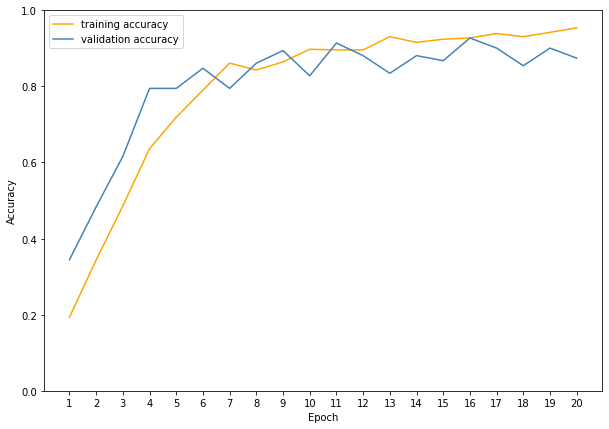

In [ ]:
# Plotting the models training and validation accuracy

fig = plt.figure(figsize=(10,7))
acc = history_dict['acc']
val_acc = history_dict['val_acc']

epochs = range(1, len(acc.values()) + 1)

plt.plot(epochs, list(acc.values()), "b", label = "training accuracy", color = "orange")
plt.plot(epochs, list(val_acc.values()), "b", label = "validation accuracy", color = "steelblue")
#plt.title("Model Accuracy")
plt.xticks(epochs)
plt.ylim(0,1)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
#plt.show
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/CNN_acc.tex")

Plotting the training and validation loss:

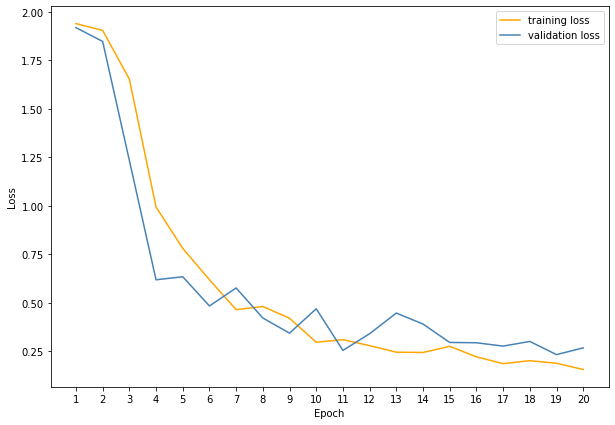

In [ ]:
# Plotting the model training and validation loss

fig = plt.figure(figsize=(10,7))
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(val_loss) + 1)

plt.plot(epochs, list(loss.values()), "b", label = "training loss", color = "orange")
plt.plot(epochs, list(val_loss.values()), "b", label = "validation loss", color = "steelblue")
#plt.title("Model Loss")
plt.xticks(epochs)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/CNN_loss.tex")


#### Evaluation on the test set:

In [ ]:
#Acc and Loss of the model
score = model.evaluate(data, new_labels, verbose = 1)
print('Test loss:', score[0])         # Test loss: 0.478945608649935
print('Test accuracy:', score[1])     # Test accuracy: 0.8303571428571429

#We get the same scores when using the test_generator 
#score = model.evaluate(data_gen, labels_gen, verbose = 1)
#print('Test loss:', score[0])        # Test loss: 0.4881676009723118
#print('Test accuracy:', score[1])    # Test accuracy: 0.8303571428571429


112/112 [==============================] - 56s 504ms/step
Test loss: 0.478945608649935
Test accuracy: 0.8303571428571429


In [ ]:
#to predict the labels only with data 
y_pred = model.predict(data, verbose = 1)

#predict with test generator 
#Y_pred = model.predict_generator(test_generator,len(test_generator.filenames), verbose=1)

112/112 [==============================] - 56s 498ms/step


In [ ]:
Y_pred = np.argmax(y_pred, axis = 1)

In [ ]:
def print_confusion_matrix(confusion_matrix, class_names, fmt, title, figsize = (10,7), fontsize=14):
    
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names, 
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt=fmt, cmap="Blues")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.title(title)
  
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return fig

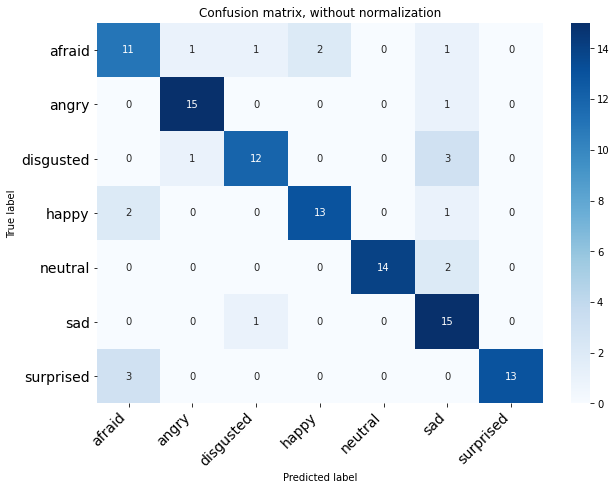

In [ ]:
fig = print_confusion_matrix(cnf_matrix, target_names, "d", title = "Confusion matrix, without normalization")
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/CNN_confusion_matrix.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/matrix.tex")

In [ ]:
def compute_acc(TP, TN, FP, FN):
  acc = (TP + TN) / (TP+ TN + FP + FN)
  return acc

In [ ]:
acc_afraid = compute_acc(11, 91, 5, 5)
acc_angry = compute_acc(15, 94, 2, 1)
acc_disgusted = compute_acc(12, 94, 2, 4 )
acc_happy = compute_acc(13, 94, 2, 3)
acc_neutral = compute_acc(14, 96, 0, 2)
acc_sad = compute_acc(15, 88, 8, 1)
acc_surprised = compute_acc(13, 96, 0, 3)

In [ ]:
print("The network classified afraid with an accuracy of:", acc_afraid)
print("The network classified angry with an accuracy of:", acc_angry)
print("The network classified disgusted with an accuracy of:", acc_disgusted)
print("The network classified happy with an accuracy of:", acc_happy)
print("The network classified neutral with an accuracy of:", acc_neutral)
print("The network classified sad with an accuracy of:", acc_sad)
print("The network classified surprised with an accuracy of:", acc_surprised)

The network classified afraid with an accuracy of: 0.9107142857142857
The network classified angry with an accuracy of: 0.9732142857142857
The network classified disgusted with an accuracy of: 0.9464285714285714
The network classified happy with an accuracy of: 0.9553571428571429
The network classified neutral with an accuracy of: 0.9821428571428571
The network classified sad with an accuracy of: 0.9196428571428571
The network classified surprised with an accuracy of: 0.9732142857142857


In [ ]:
print('Confusion Matrix')
print(confusion_matrix(np.argmax(new_labels, axis = 1), Y_pred))

Confusion Matrix
[[11  1  1  2  0  1  0]
 [ 0 15  0  0  0  1  0]
 [ 0  1 12  0  0  3  0]
 [ 2  0  0 13  0  1  0]
 [ 0  0  0  0 14  2  0]
 [ 0  0  1  0  0 15  0]
 [ 3  0  0  0  0  0 13]]


In [ ]:
print('Classification Report')
target_names = ["afraid", "angry", "disgusted", "happy", "neutral", "sad", "surprised"]
print(classification_report(np.argmax(new_labels, axis = 1), Y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

      afraid       0.69      0.69      0.69        16
       angry       0.88      0.94      0.91        16
   disgusted       0.86      0.75      0.80        16
       happy       0.87      0.81      0.84        16
     neutral       1.00      0.88      0.93        16
         sad       0.65      0.94      0.77        16
   surprised       1.00      0.81      0.90        16

    accuracy                           0.83       112
   macro avg       0.85      0.83      0.83       112
weighted avg       0.85      0.83      0.83       112



In [ ]:
# to see with predictions are correct
correct = np.zeros((len(y_pred)))
for i in range(len(y_pred)):
  if np.argmax(y_pred[i]) == np.argmax(new_labels[i]):
    correct[i] = 1
  else:
    correct[i] = 0
#correct = np.array(correct)

In [ ]:
correct

array([0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 0.,
       1., 1., 1., 1., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0.,
       1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 0., 0., 1., 0., 1., 1.])

### LRP

For analyzing the fine tuned VGG Face Modell we cut out the last softmax filter

In [ ]:
model_no_softmax = innvestigate.utils.model_wo_softmax(model)

Then we create an analyzer for out model (without the softmax) using a choosen LRP Rule. In this thesis **"lrp.sequential_preset_a_flat"** is used.

In [ ]:
analyzer = innvestigate.create_analyzer('lrp.sequential_preset_a_flat',  model_no_softmax)

With the plot all trials function we load the data, the human heatmaps and define the number of tiles into which the image is split. The images are permuted and again evaluated by the network. 

In [ ]:
def plot_curve_all_trials(analyzer, data, human_heatmap, labels, tiles = 16, random_n = 20):
  
  diff_array = np.zeros((len(data), 3, (tiles + 1)))
  correct = np.zeros((len(data)))

  for num in range(len(data)):
    #print("Image " + str(num) + " correct is perturbated!")
    image = np.copy(data[num]) # data [2]
    heatmap = np.copy(human_heatmap[num]) # human_heatmap [2]
    lrp , rand_data, human = permutation_pictures(analyzer, image, tiles, heatmap)

    random_pictures = multi_random_pictures(analyzer, data[num], tiles, random_n)
    print("Random images for Image "+ str(num) + " are created.")
    results = np.zeros((random_pictures.shape[0], random_pictures.shape[1]))
    for j in range(random_pictures.shape[0]):
      random_predict = model.predict(random_pictures[j], verbose = 1)
      for i in range(random_predict.shape[0]):
        results[j][i] = random_predict[i][np.argmax(labels[num])]

    mean_random = np.mean(results, axis = 0)

    y_pred_lrp = model.predict(lrp[0], verbose = 1)
    y_pred_human = model.predict(human[0], verbose = 1)

    if np.argmax(y_pred_lrp[0]) == np.argmax(labels[num]) and np.argmax(y_pred_human[0]) == np.argmax(labels[num]):

      steps_lrp, values_lrp = get_values(y_pred_lrp, num)
      steps_human, values_human = get_values(y_pred_human, num)

      lrp_rand = diff_to_random(values_lrp, mean_random)     #shape (17,)
      diff_array[num][0] = lrp_rand
      human_rand = diff_to_random(values_human, mean_random)
      diff_array[num][1] = human_rand
      rand_rand = diff_to_random(mean_random, mean_random)
      diff_array[num][2] = rand_rand

      correct[num] = 1

      print("Image " + str(num) + " was correct gets perturbated!")

    else:
      print("Image " + str(num) + " was not correctly classified and therefore is skipped.")

      correct[num] = 0


  length = np.sum(correct)
  only_correct = np.zeros((int(length), 3, 17))
  j = 0
  for i in range(len(correct)):
    if correct[i] == 1:
      only_correct[j][0] = diff_array[i][0]
      only_correct[j][1] = diff_array[i][1]
      only_correct[j][2] = diff_array[i][2]
      j += 1
    else:
      continue


  lrp_difference = np.zeros((only_correct.shape[0], 17))
  human_difference = np.zeros((only_correct.shape[0], 17))
  random_difference = np.zeros((only_correct.shape[0], 17))
  for i in range(len(only_correct)):
    lrp_difference[i] = only_correct[i][0]
    human_difference[i] = only_correct[i][1]
    random_difference[i] = only_correct[i][2]



  return only_correct, lrp_difference, human_difference, random_difference, steps_lrp


In [ ]:
 only_correct, lrp_difference, human_difference, random_difference, steps = plot_curve_all_trials(analyzer, data, human_heatmap, new_labels, tiles = 16, random_n= 20)

Random images for Image 0 are created.
17/17 [==============================] - 8s 499ms/step
Image 0 was not correctly classified and therefore is skipped.
Random images for Image 1 are created.
17/17 [==============================] - 8s 499ms/step
Image 1 was not correctly classified and therefore is skipped.
Random images for Image 2 are created.
17/17 [==============================] - 8s 498ms/step
Image 2 was correct gets perturbated!
Random images for Image 3 are created.
17/17 [==============================] - 8s 500ms/step
Image 3 was correct gets perturbated!
Random images for Image 4 are created.
17/17 [==============================] - 9s 500ms/step
Image 4 was correct gets perturbated!
Random images for Image 5 are created.
17/17 [==============================] - 8s 498ms/step
Image 5 was correct gets perturbated!
Random images for Image 6 are created.
17/17 [==============================] - 9s 501ms/step
Image 6 was correct gets perturbated!
Random images for Image 7 

The Function plot_curve_all_trials  takes around 5 hours to run. 

Save arrays after computing:
```python
np.save("/content/gdrive/My Drive/Thesis/only2_correct.npy", only_correct)
np.save("/content/gdrive/My Drive/Thesis/lrp2_difference.npy", lrp_difference)
np.save("/content/gdrive/My Drive/Thesis/human2_difference.npy", human_difference)
np.save("/content/gdrive/My Drive/Thesis/random2_difference.npy", random_difference)
np.save("/content/gdrive/My Drive/Thesis/steps2.npy", steps)
 ```    

In [ ]:
np.save("/content/gdrive/My Drive/Thesis/only4_correct.npy", only_correct)
np.save("/content/gdrive/My Drive/Thesis/lrp4_difference.npy", lrp_difference)
np.save("/content/gdrive/My Drive/Thesis/human4_difference.npy", human_difference)
np.save("/content/gdrive/My Drive/Thesis/random4_difference.npy", random_difference)
np.save("/content/gdrive/My Drive/Thesis/steps4.npy", steps)

### LRP Heatmaps split by Emotions

#### Afraid

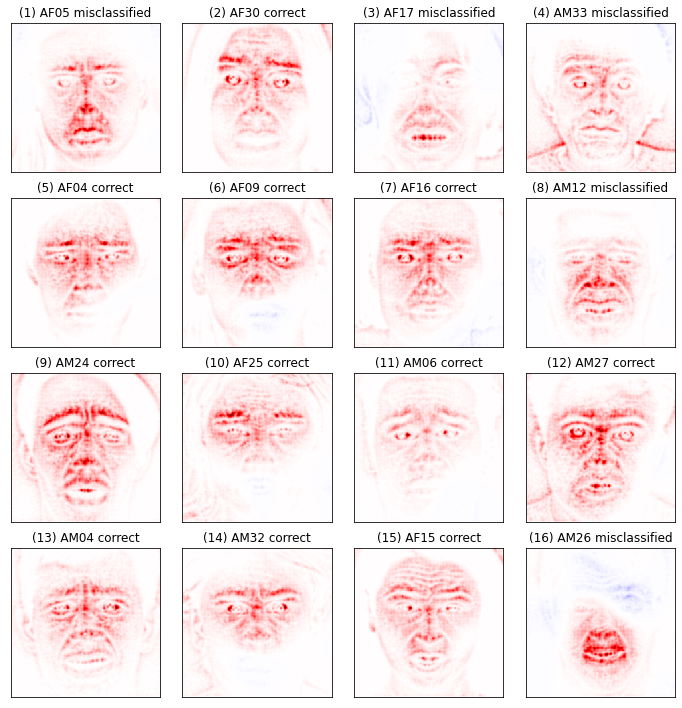

In [ ]:
emotion_heatmaps(analyzer, 0, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_afraid.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_afraid.tex")

#### Angry

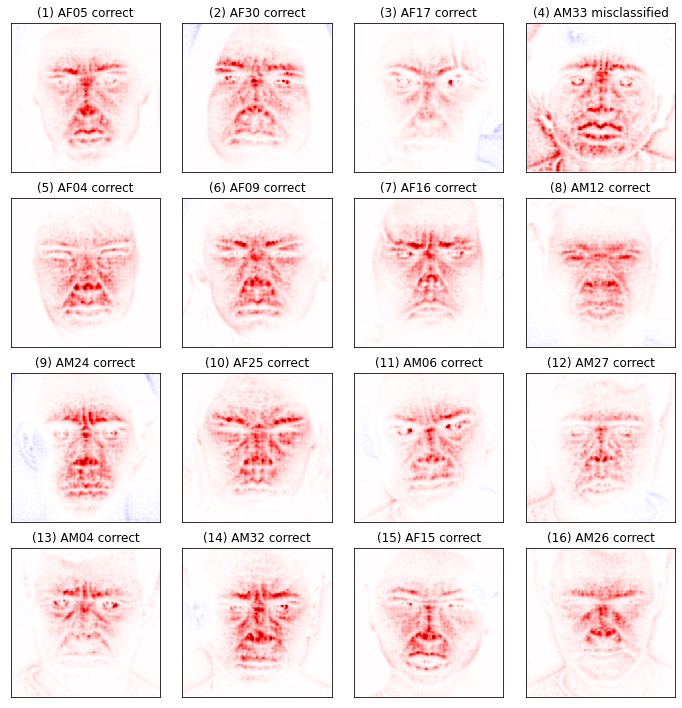

In [ ]:
emotion_heatmaps(analyzer, 1, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_angry.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_angry.tex")

#### Disgusted

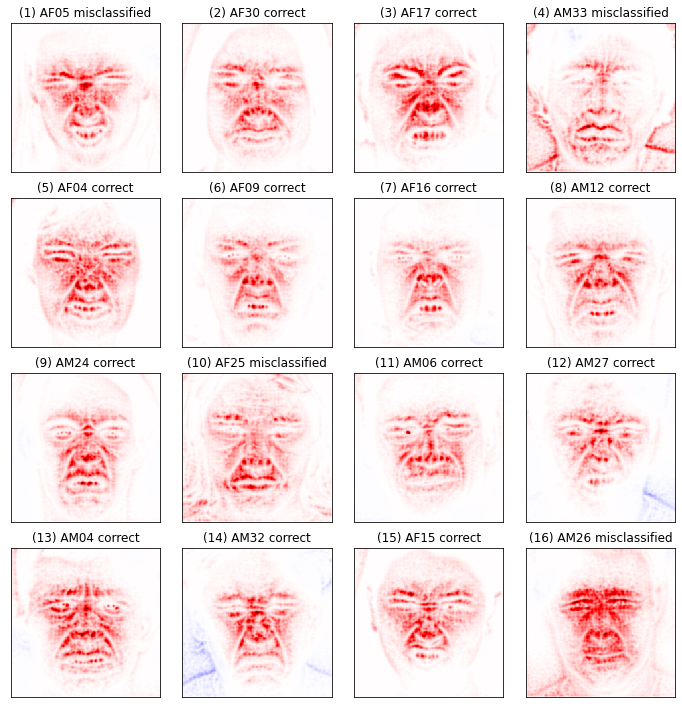

In [ ]:
emotion_heatmaps(analyzer, 2, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_disgusted.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_disgusted.tex")

#### Happy

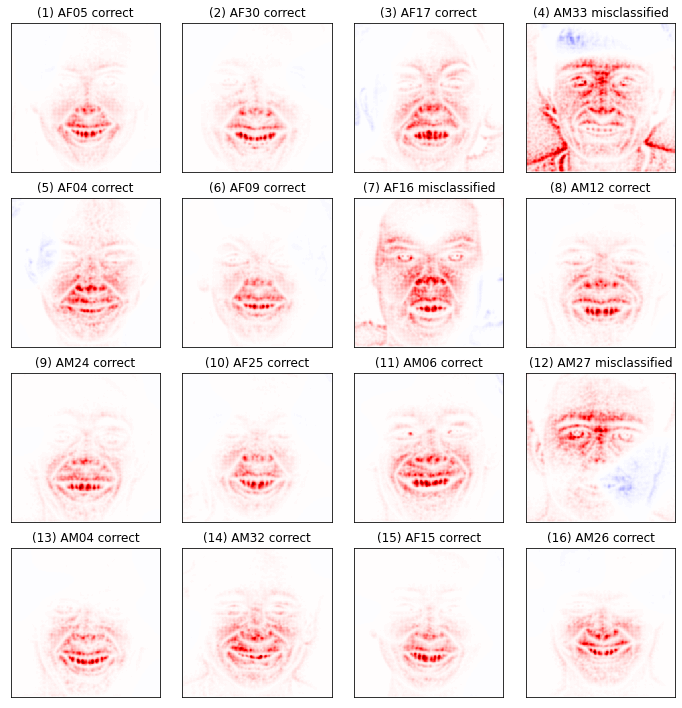

In [ ]:
emotion_heatmaps(analyzer, 3, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_happy.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_happy.tex")

#### Neutral

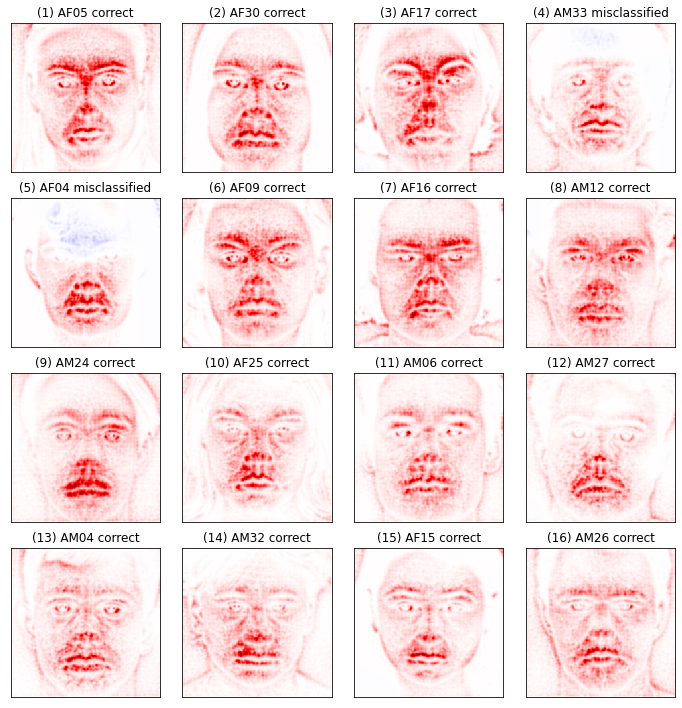

In [ ]:
emotion_heatmaps(analyzer, 4, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_neutral.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_neutral.tex")

#### Sad

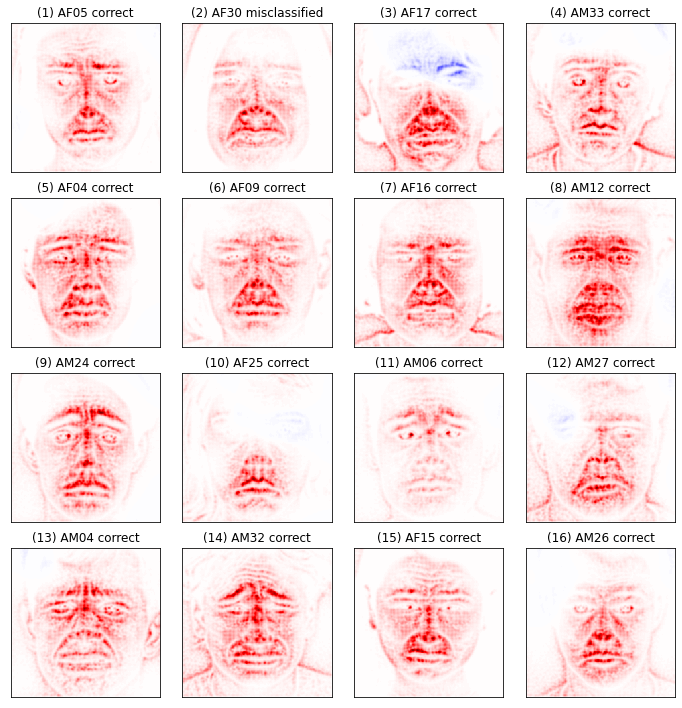

In [ ]:
emotion_heatmaps(analyzer, 5, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_sad.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_sad.tex")

#### Surprise

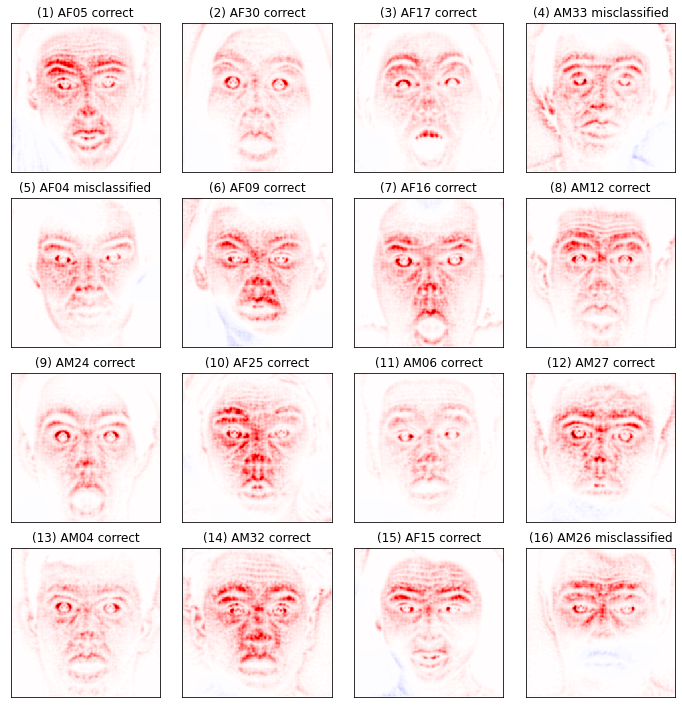

In [ ]:
emotion_heatmaps(analyzer, 6, new_labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/Lrp_surprised.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/lrp_heatmaps_surprise.tex")

### Permutation Analysis Overview Plot

This plot displayes the process of the permutation analysis. The used picture can be changeing by choosing another trial number for the image. 

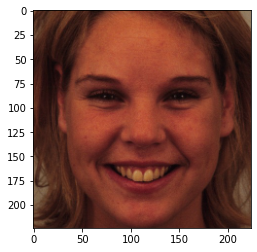

In [ ]:
# Choose and display the image permutated in the plot
img = np.copy(data[64]) # change the number here to change the image
image = img.reshape(1,224,224,3)
plt.imshow(img)
plt.show()


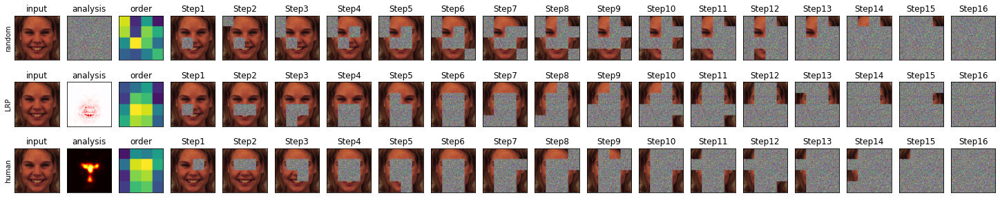

In [ ]:
plot = permutation_plot(analyzer,image, 16, human_heatmap[64])
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/perturbation_overview.pdf') 
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/Plots/perturbation_overview.tex")

### Evaluation of the permutation analysis and ploting the permutation curves:

In this section the resulting accurracys of the perumtation analysis a read in and then computed the difference to the random baseline. For a experiment in choosing the right baseline see the following section. 

For comparing humans and the network visualized by LRP the auc (Area under the curve) values between each group and the random baseline is computed. 

For a statistical comparison of the curves the requirements for a ttest are checked. If these are given, the ttest is calculated, otherwise the non-parametric equivalent the Mann Whitney U Test is used. 

#### All Steps

In [ ]:
# Loading the arrays
only_correct = np.load("/content/gdrive/My Drive/Thesis/only4_correct.npy")
lrp_difference = np.load("/content/gdrive/My Drive/Thesis/lrp4_difference.npy")
human_difference = np.load("/content/gdrive/My Drive/Thesis/human4_difference.npy")
random_difference = np.load("/content/gdrive/My Drive/Thesis/random4_difference.npy")
steps = np.load("/content/gdrive/My Drive/Thesis/steps4.npy")

In [ ]:
# Computing the Mean | Max | Min
# LRP
mean_lrp_diff = np.mean(lrp_difference, axis = 0)
maximum_lrp_diff = np.max(lrp_difference, axis = 0)
minimum_lrp_diff = np.min(lrp_difference, axis = 0)
#Human
mean_human_diff = np.mean(human_difference, axis = 0)
maximum_human_diff = np.max(human_difference, axis = 0)
minimum_human_diff = np.min(human_difference, axis = 0)
#Random (obviously zero)
mean_random_diff = np.mean(random_difference, axis = 0)

##### Main Comparison of both groups over all of the network correct classified trials (n = 93)

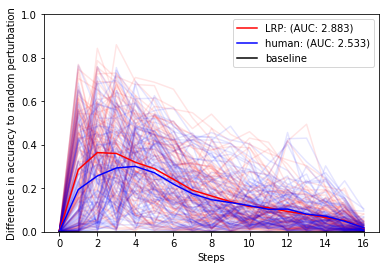

In [ ]:
#Compute AUC for the means 
auc_lrp = np.around((auc(steps, mean_lrp_diff)), 3)
auc_human = np.around((auc(steps, mean_human_diff)), 3)

fig = plt.figure()
ax= fig.add_subplot(111)
for i in range(lrp_difference.shape[0]):
  ax.plot(steps, lrp_difference[i], "b", color = "red", alpha=0.1 )
for i in range(human_difference.shape[0]):
  ax.plot(steps, human_difference[i], "b", color = "blue", alpha=0.1 )
ax.set_ylim(0,1)
ax.plot(steps, mean_lrp_diff, "b", color ="red", label = "LRP: (AUC: " + str(auc_lrp)+")")
ax.plot(steps, mean_human_diff, "b", color ="blue", label = "human: (AUC: " + str(auc_human)+")")
ax.plot(steps, mean_random_diff, "b", color ="black", label = "baseline")
ax.set_xlabel("Steps")
ax.set_ylabel("Difference in accuracy to random perturbation")
ax.legend()

#plt.show()
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/Comparison_main.tex")

##### Permutation Plots with AUC by Emotion

Flagging the from the network correctly classified trials. This is used to futher group the permutation curves to each emotion block.

In [ ]:
# to see with predictions are correct
correct = np.zeros((len(y_pred)))
for i in range(len(y_pred)):
  if np.argmax(y_pred[i]) == np.argmax(new_labels[i]):
    correct[i] = 1
  else:
    correct[i] = 0
#correct = np.array(correct)

In [ ]:
trial = []
labels_short = []
for index,value in enumerate(correct):
  if value == 1:
    trial.append(index)
    labels_short.append(new_labels[index])

In [ ]:
def permutation_subplots_auc(emotion_string, class_index, labels_short, lrp_difference, human_difference, random_difference):
  """
  Function creating permutation comparison plot for a single stated emotion. 
  :param emotion_string: The displayed emotion as a string. e.g "afraid" 
  :param class_index: afraid:0, angry:1,disgusted:2, happy:3, neutral:4, sad:5, surprise:6)
  :param labels_short: array used to iterate over the difference arrays. Ensures that
                       only correct trials are used. 
  :param lrp_difference: the differences between the accuracy values generated using 
                         the lrp perturbation 
  :param human_difference: the differences between the accuracy values generated using 
                         the human perturbation                          
  :param random_difference: arrays containg the random baseline values. (Is always zero)
  :return displays the plot
  """

  emotion_subset = []
  for index,value in enumerate(labels_short):
    if np.argmax(value) == class_index:
      emotion_subset.append(index)

  lrp_diff_subset = np.array([lrp_difference[i] for i in emotion_subset])
  human_diff_subset = np.array([human_difference[i] for i in emotion_subset])
  random_diff_subset = np.array([random_difference[i] for i in emotion_subset])


  # Computing the Mean | Max | Min
  # LRP
  mean_lrp_diff_subset = np.mean(lrp_diff_subset, axis = 0)
  #Human
  mean_human_diff_subset = np.mean(human_diff_subset, axis = 0)
  #Random (obviously zero)
  mean_random_diff_subset = np.mean(random_diff_subset, axis = 0)
  #Compute AUC for the means 
  auc_lrp = np.around((auc(steps, mean_lrp_diff_subset)), 3)
  auc_human = np.around((auc(steps, mean_human_diff_subset)), 3)

  return auc_lrp, auc_human

In [ ]:
afraid_auc_lrp, afraid_auc_human = permutation_subplots_auc("afraid", 0, labels_short, lrp_difference, human_difference, random_difference)
angry_auc_lrp, angry_auc_human = permutation_subplots_auc("angry", 1, labels_short, lrp_difference, human_difference, random_difference)
disgusted_auc_lrp, disgusted_auc_human = permutation_subplots_auc("disgusted", 2, labels_short, lrp_difference, human_difference, random_difference)
happy_auc_lrp, happy_auc_human = permutation_subplots_auc("happy", 3, labels_short, lrp_difference, human_difference, random_difference)
neutral_auc_lrp, neutral_auc_human = permutation_subplots_auc("neutral", 4, labels_short, lrp_difference, human_difference, random_difference)
sad_auc_lrp, sad_auc_human = permutation_subplots_auc("sad", 5, labels_short, lrp_difference, human_difference, random_difference)
surprised_auc_lrp, surprised_auc_human = permutation_subplots_auc("surprised", 6, labels_short, lrp_difference, human_difference, random_difference)

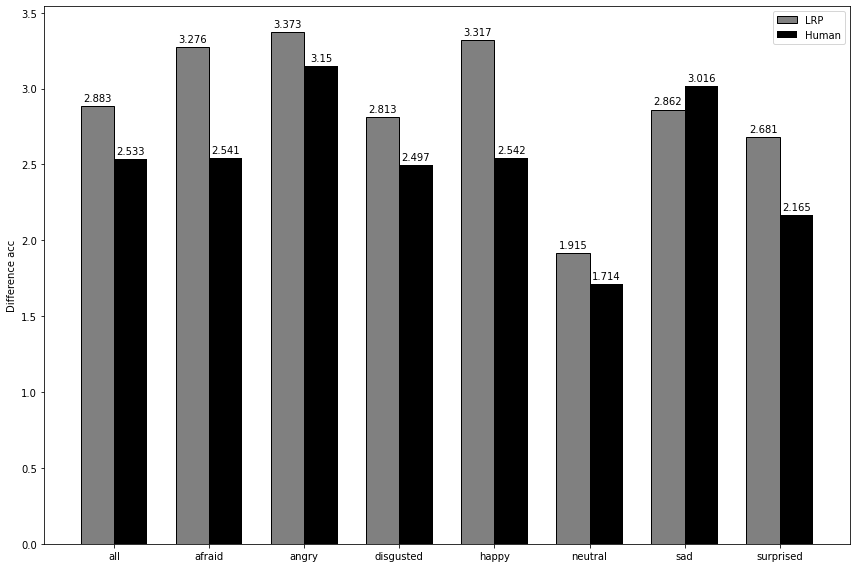

In [ ]:

labels = ['all', 'afraid', 'angry', 'disgusted', 'happy', 'neutral', 'sad', 'surprised']
lrp_means = [auc_lrp, afraid_auc_lrp, angry_auc_lrp, disgusted_auc_lrp, happy_auc_lrp, neutral_auc_lrp,sad_auc_lrp, surprised_auc_lrp]
human_means = [auc_human, afraid_auc_human, angry_auc_human, disgusted_auc_human, happy_auc_human, neutral_auc_human,sad_auc_human,surprised_auc_human]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(12,8))
rects1 = ax.bar(x - width/2, lrp_means, width, label='LRP', color = "gray", edgecolor = "black")
rects2 = ax.bar(x + width/2, human_means, width, label='Human', color = "black")

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Difference acc')
ax.set_xticks(x)
#ax.set_ylim(0,4.2)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_per_trial.tex")

###### Afraid

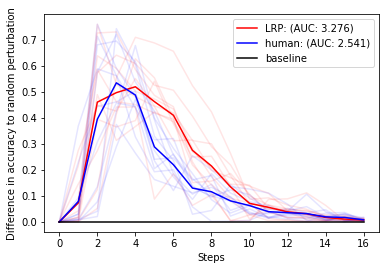

In [ ]:
permutation_subplots("afraid", 0, labels_short, lrp_difference, human_difference, random_difference)
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_afraid.tex")

###### Angry

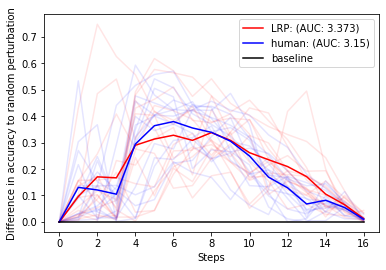

In [ ]:
permutation_subplots("angry", 1, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_angry.tex")

###### Disgusted

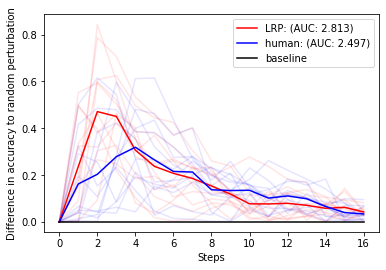

In [ ]:
permutation_subplots("disgusted", 2, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_disgusted.tex")

###### Happy

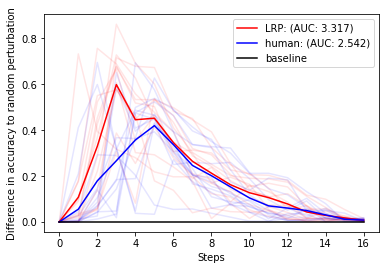

In [ ]:
permutation_subplots("happy", 3, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_happy.tex")
# The differences in this plot show the big difference because for correctly classifing happy mostly the mouth is important and the human heatmap first permutates the eye region

###### Neutral

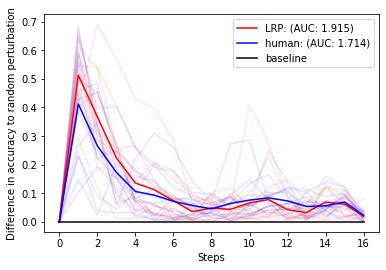

In [ ]:
permutation_subplots("neutral", 4, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_neutral.tex")

###### Sad

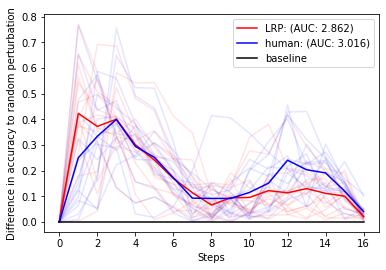

In [ ]:
permutation_subplots("sad", 5, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_sad.tex")

###### Surprised

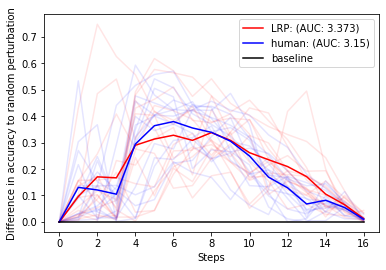

In [ ]:
permutation_subplots("surprise", 1, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_surprised.tex")
# Suprise is intresting, because the LRP heatmaps mark the Eyebrows as especially imporant. But also especially the mouth is important. Because the human sailancy maps focus on eyes here they are bad. 

##### Statistical analysis of the differences between both groups

In [ ]:
from scipy import stats
from statsmodels.graphics.gofplots import qqplot
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import levene
from scipy.stats import mannwhitneyu

In [ ]:
# extract the auc values
auc_lrp = []
auc_human = []
for i in range(lrp_difference.shape[0]):
  lrp_auc = auc(steps, lrp_difference[i])
  human_auc = auc(steps, human_difference[i])
  auc_lrp.append(lrp_auc)
  auc_human.append(human_auc)

Check for normality (visual)


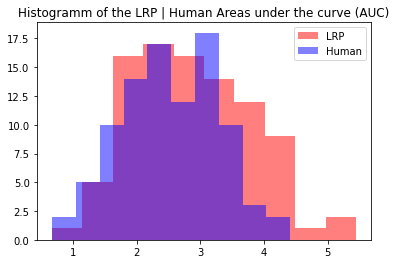

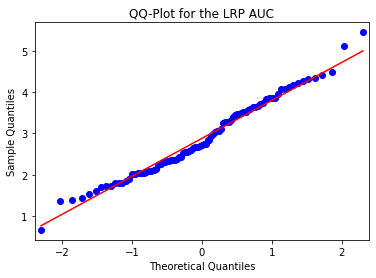

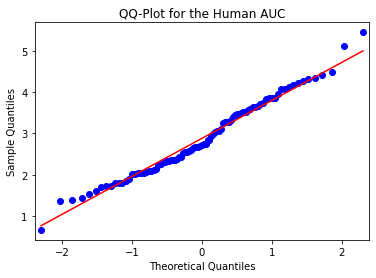

In [ ]:
plt.hist(auc_lrp, color = "red", alpha = 0.5, label = "LRP")
plt.hist(auc_human, color = "blue", alpha = 0.5, label = "Human")
plt.title("Histogramm of the LRP | Human Areas under the curve (AUC)")
plt.legend()
plt.show()

qqplot(np.array(auc_lrp), line='s')
plt.title("QQ-Plot for the LRP AUC")
plt.show()

qqplot(np.array(auc_lrp), line='s')
plt.title("QQ-Plot for the Human AUC")
plt.show()


# Looks rather normal

In [ ]:
print("Using the Shapiro-Wilk Test:\n")
stat, p = shapiro(auc_lrp)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('The LRP AUC values look Gaussian (fail to reject H0)')
else:
	print('The LRP AUC values does not look Gaussian (reject H0)')
 
print("")
stat, p = shapiro(auc_human)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('The Human AUC values look Gaussian (fail to reject H0)')
else:
	print('The Human AUC values does not look Gaussian (reject H0)')

Using the Shapiro-Wilk Test:

Statistics=0.983, p=0.279
The LRP AUC values look Gaussian (fail to reject H0)

Statistics=0.994, p=0.961
The Human AUC values look Gaussian (fail to reject H0)


In [ ]:
print("Using the D'Agostino and Pearson's Test:\n")
stat, p = normaltest(auc_lrp)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('The LRP AUC values look Gaussian (fail to reject H0)')
else:
	print('The LRP AUC values does not look Gaussian (reject H0)')
 
print("")
stat, p = normaltest(auc_human)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('The Human AUC values look Gaussian (fail to reject H0)')
else:
	print('The Human AUC values does not look Gaussian (reject H0)')
 

Using the D'Agostino and Pearson's Test:

Statistics=1.715, p=0.424
The LRP AUC values look Gaussian (fail to reject H0)

Statistics=0.629, p=0.730
The Human AUC values look Gaussian (fail to reject H0)


In [ ]:
#Looks like the data is normal, no checking the other assumtions of a independent samples t test 

print("Mean LRP: " + str(np.around(np.mean(auc_lrp), 4)) + " Variance LRP: " + str(np.around(np.var(auc_lrp), 4)) + " Standard deviation LRP: " + str(np.around(np.std(auc_lrp), 4)))
print("Mean Human: " + str(np.around(np.mean(auc_human), 4)) + " Variance LRP: " + str(np.around(np.var(auc_human), 4)) + " Standard deviation LRP: " + str(np.around(np.std(auc_human), 4)))
print("")

levenetest = levene(auc_lrp, auc_human)
print(levenetest)
print("Homogeneity of variances assumption is not violated, we can assume equal variance")
print("")
ttest = stats.ttest_ind(auc_lrp,auc_human, equal_var = False)
print(ttest)
alpha = 0.05
if ttest.pvalue > alpha:
	print('Equal averages  (fail to reject H0)')
else:
	print('No equal averages of the AUCs of both groups (reject H0)')
 


print("")
print("Power Analysis:")
cohens_d = (np.mean(auc_lrp) - np.mean(auc_human)) / np.sqrt((np.std(auc_lrp, ddof=1) ** 2 + np.std(auc_human, ddof=1) ** 2) / 2.0)
print("The effectsize (Cohens d) is " + str(np.around(cohens_d, 4)))

#import statsmodels.stats.power as smp

print("")
print("With a effect size of " + str(np.around(cohens_d, 4)) + " and a sample size of "+ str(len(auc_human)) + " we reach a statistical power of:")

from statsmodels.stats.power import TTestIndPower
# parameters for power analysis
effect = cohens_d
alpha = 0.05
sample_size = len(auc_human) 
# perform power analysis
analysis = TTestIndPower()
result = analysis.solve_power(effect, power=None, nobs1=sample_size, ratio=1.0, alpha=alpha)
print('Power: %.3f' % result)



Mean LRP: 2.883 Variance LRP: 0.8429 Standard deviation LRP: 0.9181
Mean Human: 2.5333 Variance LRP: 0.569 Standard deviation LRP: 0.7543

LeveneResult(statistic=3.895716057041543, pvalue=0.049906269811511125)
Homogeneity of variances assumption is not violated, we can assume equal variance

Ttest_indResult(statistic=2.822806661284894, pvalue=0.005304655970145642)
No equal averages of the AUCs of both groups (reject H0)

Power Analysis:
The effectsize (Cohens d) is 0.414

With a effect size of 0.414 and a sample size of 93 we reach a statistical power of:
Power: 0.802


For more summary statistics and a confidence intervall ttest was als carried out in R

``` R
test <- t.test(x = auc_lrp, y = auc_human, alternative = "two.sided", var.equal = TRUE)
test

>>> 	Two Sample t-test

    data:  auc_lrp and auc_human
    t = 2.8228, df = 184, p-value = 0.005284
    alternative hypothesis: true difference in means is not equal to 0
    95 percent confidence interval: 0.1052829 0.5941055
    sample estimates:
    mean of x mean of y 
    2.883018  2.533323 



test <- t.test(x = auc_lrp, y = auc_human, alternative = "two.sided", var.equal = FALSE)
test

	Welch Two Sample t-test

data:  auc_lrp and auc_human
t = 2.8228, df = 177.33, p-value = 0.005305
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 0.1052220 0.5941664
sample estimates:
mean of x mean of y 
 2.883018  2.533323 


Concern of dependent samples. 
Since in this experiment the inner workings of the CNN are visualized through LRP and these heatmaps are compared with the human heatmaps by the CNN. It could be the case that the resulting AUC samples are dependent on each other. 
Therefore a dependent t-test is done to check if the same results are aquired. 

In [ ]:

print("")
dep_ttest = stats.ttest_rel(auc_lrp,auc_human)
print(dep_ttest)
alpha = 0.05
if dep_ttest.pvalue > alpha:
	print('Equal averages  (fail to reject H0)')
else:
	print('No equal averages of the AUCs of both groups (reject H0)')
 


Ttest_relResult(statistic=4.9823874006535265, pvalue=2.9322880337951013e-06)
No equal averages of the AUCs of both groups (reject H0)


**Mann-Whitney U Test:**

If the data does not look normal we compute a Mann-Whitney U Test: 
Which compares two independent samples by comparing the ranks of the dependent variable (auc values LRP | humans) (comparing the central tendecies)

H_0 = Same distribution

H_1 = Different distributions


In [ ]:
#Data does NOT look normal. So we cant use two independent sample ttest, but rather need to do a non-parametic test. (Mann-Whitney U Test)  

print("Mean LRP: " + str(np.around(np.mean(auc_lrp), 4)) + " Variance LRP: " + str(np.around(np.var(auc_lrp), 4)))
print("Mean Human: " + str(np.around(np.mean(auc_human), 4)) + " Variance LRP: " + str(np.around(np.var(auc_human), 4)))
print("")

stat, p = mannwhitneyu(auc_human, auc_lrp)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Mean LRP: 2.8923 Variance LRP: 0.9827
Mean Human: 2.5227 Variance LRP: 0.9065

Statistics=3342.000, p=0.004
Different distribution (reject H0)


to compute the effect size for the Mann-Whitney U Test we need the pingouin library.

In [ ]:
!pip install pingouin

In [ ]:
import pingouin as pg

In [ ]:
pg.mwu(auc_human, auc_lrp, tail='two-sided')

,U-val,tail,p-val,RBC,CLES
MWU,3342.0,two-sided,0.007476,0.227,0.614


#### Only Steps 1 to 7

Because in facial expression images only some regions in the face are important, differences in the later perturbations are based of random fluctuations and could bias the interpretation. Therefore the plottet steps can be choosed. 
6 Steps are needed to cover the whole face

In [ ]:
# choose number of steps 
number_of_steps = 7
# Loading the arrays
only_correct = only_correct[:,:number_of_steps]
lrp_difference = lrp_difference[:,:number_of_steps]
human_difference = human_difference[:,:number_of_steps]
random_difference = random_difference[:,:number_of_steps]
steps = steps[:number_of_steps]

In [ ]:
# Computing the Mean | Max | Min
# LRP
mean_lrp_diff = np.mean(lrp_difference, axis = 0)
maximum_lrp_diff = np.max(lrp_difference, axis = 0)
minimum_lrp_diff = np.min(lrp_difference, axis = 0)
#Human
mean_human_diff = np.mean(human_difference, axis = 0)
maximum_human_diff = np.max(human_difference, axis = 0)
minimum_human_diff = np.min(human_difference, axis = 0)
#Random (obviously zero)
mean_random_diff = np.mean(random_difference, axis = 0)

##### Main Comparison of both groups over all of the network correct classified trials (n = 93)

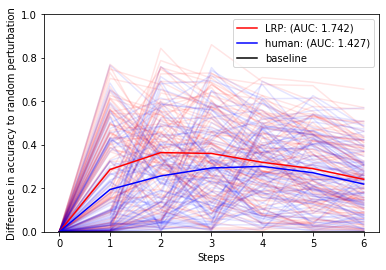

In [ ]:
#Compute AUC for the means 
auc_lrp = np.around((auc(steps, mean_lrp_diff)), 3)
auc_human = np.around((auc(steps, mean_human_diff)), 3)

fig = plt.figure()
ax= fig.add_subplot(111)
for i in range(lrp_difference.shape[0]):
  ax.plot(steps, lrp_difference[i], "b", color = "red", alpha=0.1 )
for i in range(human_difference.shape[0]):
  ax.plot(steps, human_difference[i], "b", color = "blue", alpha=0.1 )
ax.set_ylim(0,1)
ax.plot(steps, mean_lrp_diff, "b", color ="red", label = "LRP: (AUC: " + str(auc_lrp)+")")
ax.plot(steps, mean_human_diff, "b", color ="blue", label = "human: (AUC: " + str(auc_human)+")")
ax.plot(steps, mean_random_diff, "b", color ="black", label = "baseline")
ax.set_xlabel("Steps")
ax.set_ylabel("Difference in accuracy to random perturbation")
ax.legend()

#plt.show()
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/Comparison_main.tex")

##### Permutation Plots with AUC by Emotion

Flagging the from the network correctly classified trials. This is used to futher group the permutation curves to each emotion block.

In [ ]:
# to see with predictions are correct
correct = np.zeros((len(y_pred)))
for i in range(len(y_pred)):
  if np.argmax(y_pred[i]) == np.argmax(new_labels[i]):
    correct[i] = 1
  else:
    correct[i] = 0
#correct = np.array(correct)

In [ ]:
trial = []
labels_short = []
for index,value in enumerate(correct):
  if value == 1:
    trial.append(index)
    labels_short.append(new_labels[index])

In [ ]:
afraid_auc_lrp, afraid_auc_human = permutation_subplots_auc("afraid", 0, labels_short, lrp_difference, human_difference, random_difference)
angry_auc_lrp, angry_auc_human = permutation_subplots_auc("angry", 1, labels_short, lrp_difference, human_difference, random_difference)
disgusted_auc_lrp, disgusted_auc_human = permutation_subplots_auc("disgusted", 2, labels_short, lrp_difference, human_difference, random_difference)
happy_auc_lrp, happy_auc_human = permutation_subplots_auc("happy", 3, labels_short, lrp_difference, human_difference, random_difference)
neutral_auc_lrp, neutral_auc_human = permutation_subplots_auc("neutral", 4, labels_short, lrp_difference, human_difference, random_difference)
sad_auc_lrp, sad_auc_human = permutation_subplots_auc("sad", 5, labels_short, lrp_difference, human_difference, random_difference)
surprised_auc_lrp, surprised_auc_human = permutation_subplots_auc("surprised", 6, labels_short, lrp_difference, human_difference, random_difference)

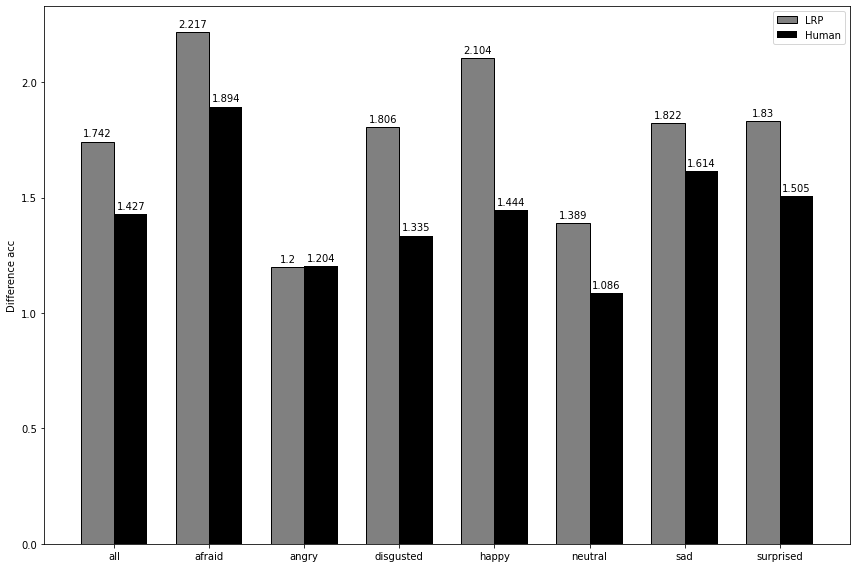

In [ ]:

labels = ['all', 'afraid', 'angry', 'disgusted', 'happy', 'neutral', 'sad', 'surprised']
lrp_means = [auc_lrp, afraid_auc_lrp, angry_auc_lrp, disgusted_auc_lrp, happy_auc_lrp, neutral_auc_lrp,sad_auc_lrp, surprised_auc_lrp]
human_means = [auc_human, afraid_auc_human, angry_auc_human, disgusted_auc_human, happy_auc_human, neutral_auc_human,sad_auc_human,surprised_auc_human]

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(12,8))
rects1 = ax.bar(x - width/2, lrp_means, width, label='LRP', color = "gray", edgecolor = "black")
rects2 = ax.bar(x + width/2, human_means, width, label='Human', color = "black")

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Difference acc')
ax.set_xticks(x)
#ax.set_ylim(0,4.2)
ax.set_xticklabels(labels)
ax.legend()


def autolabel(rects):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')


autolabel(rects1)
autolabel(rects2)

fig.tight_layout()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_per_trial.tex")

###### Afraid

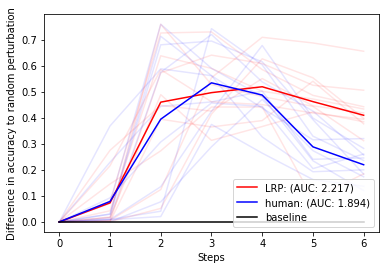

In [ ]:
permutation_subplots("afraid", 0, labels_short, lrp_difference, human_difference, random_difference)
#tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_afraid.tex")

###### Angry

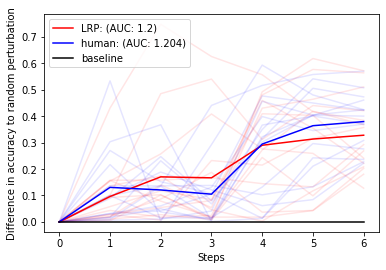

In [ ]:
permutation_subplots("angry", 1, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_angry.tex")

###### Disgusted

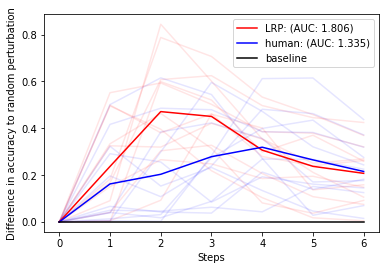

In [ ]:
permutation_subplots("disgusted", 2, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_disgusted.tex")

###### Happy

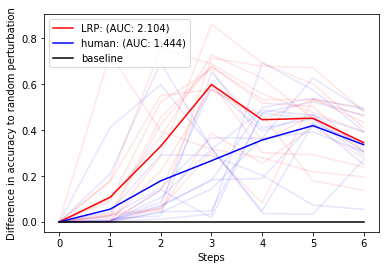

In [ ]:
permutation_subplots("happy", 3, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_happy.tex")
# The differences in this plot show the big difference because for correctly classifing happy mostly the mouth is important and the human heatmap first permutates the eye region

###### Neutral

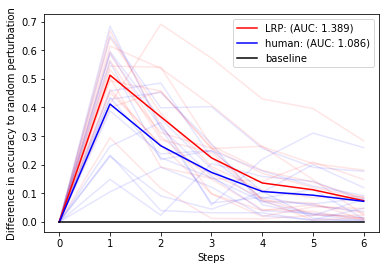

In [ ]:
permutation_subplots("neutral", 4, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_neutral.tex")

###### Sad

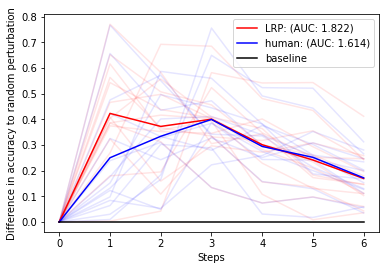

In [ ]:
permutation_subplots("sad", 5, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_sad.tex")

###### Surprised

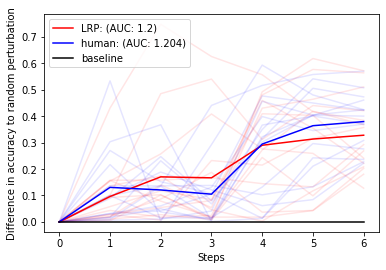

In [ ]:
permutation_subplots("surprise", 1, labels_short, lrp_difference, human_difference, random_difference)
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/auc_surprised.tex")
# Suprise is intresting, because the LRP heatmaps mark the Eyebrows as especially imporant. But also especially the mouth is important. Because the human sailancy maps focus on eyes here they are bad. 

#### Permutation Plots for each trial:

In [ ]:
for i in range(lrp_difference.shape[0]):
  auc_lrp = np.around((auc(steps, lrp_difference[i])), 3)
  auc_human = np.around((auc(steps, human_difference[i])), 3)

  plt.ion()
  plt.plot(steps, lrp_difference[i], "b", color ="red", label = "LRP: (AUC: " + str(auc_lrp)+")")
  plt.plot(steps, human_difference[i], "b", color ="orange", label = "human: (AUC: " + str(auc_human)+")")
  plt.plot(steps,random_difference[i], "b", color ="blue", label = "baseline")
  plt.title("Man vs Machine in trial: " + str(i))
  plt.xlabel("Steps")
  plt.ylabel("Difference in accuracy to random perturbation")
  plt.legend()
  plt.show()
  _ = input("Press [enter] to continue.") # wait for input from the user
  plt.close()

#### Experiments with the random perturbation:

Because with one single random perturbation the resulting baseline can be quite different for each trial and even varing in each execution. To determine the right amount of random perturbations for the baseline some differen n's (10,20,50,100,200) where computetd. To save computational cost a lower bound n is choosen. 

In [ ]:
# can be run to create the random perturbated images. (choose n)
random_multi_test = multi_random_pictures(analyzer, data[2], 16, 15)

In [ ]:
results = np.zeros((random_multi_test.shape[0], random_multi_test.shape[1]))
for j in range(random_multi_test.shape[0]):
  random_predict = model.predict(random_multi_test[j], verbose = 1)
  print(j)
  for i in range(random_predict.shape[0]):
    print(i)
    results[j][i] = random_predict[i][np.argmax(new_labels[2])]

In [ ]:
# saving the results. Also needs to be run after each creation. 

# TODO: IF TIME left create a function 
results = np.zeros((random_multi_test.shape[0], 17))
for j in range(random_multi_test.shape[0]):
  test = model.predict(random_multi_test[j], verbose = 1)
  print(np.argmax(test[0]))
  print(np.argmax(new_labels[2]))
  if np.argmax(test[0]) == np.argmax(labels[2]):
    for i in range(test.shape[0]):
      results[j][i] = test[i][5]
  else:
    continue

In [ ]:
# Experiments run with n's (10, 15, 20, 50, 100, 200)
mean_comparison_array = np.zeros((6,2), dtype = object)
mean_comparison_array[0][0] = results_10
mean_comparison_array[0][1] = mean_rand_10
mean_comparison_array[1][0] = results_15
mean_comparison_array[1][1] = mean_rand_15
mean_comparison_array[2][0] = results_20
mean_comparison_array[2][1] = mean_rand_20
mean_comparison_array[3][0] = results_50
mean_comparison_array[3][1] = mean_rand_50
mean_comparison_array[4][0] = results_100
mean_comparison_array[4][1] = mean_rand_100
mean_comparison_array[5][0] = results_200
mean_comparison_array[5][1] = mean_rand_200

# array with all arrays as stated above to plot the experiment
np.save("/content/gdrive/My Drive/Thesis/mean_comparison_array.npy", mean_comparison_array)

NameError: ignored

In [ ]:
mean_random = np.load("/content/gdrive/My Drive/Thesis/mean_comparison_array.npy", allow_pickle = True)

In [ ]:
mean_random.shape

(6, 2)

##### Plots from the Experiment

In [ ]:
steps = np.arange(0,17)

In [ ]:
steps

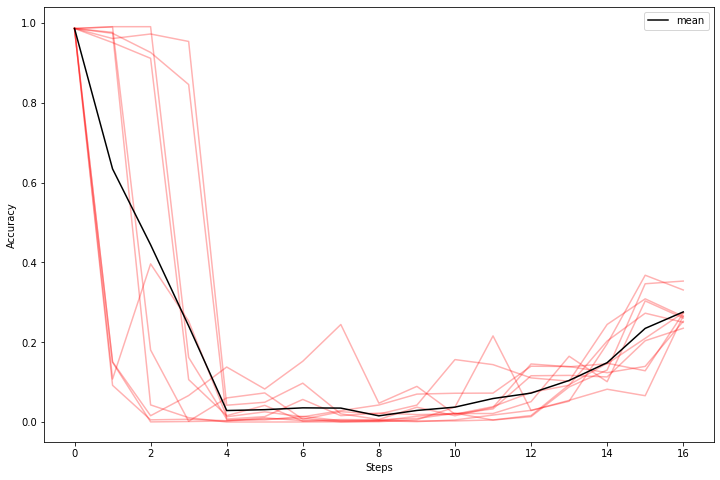

In [ ]:
fig10 = plt.figure(figsize=(12,8))
#results_10 = results
#mean_rand_10 = np.mean(results, axis = 0)
results_10 = mean_random[0][0]
mean_rand_10 = mean_random[0][1]

for i in range(results_10.shape[0]):
  plt.plot(steps, results_10[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_10, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("10 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_10.tex")

In [ ]:
steps = np.arange(0,17)

In [ ]:
steps

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

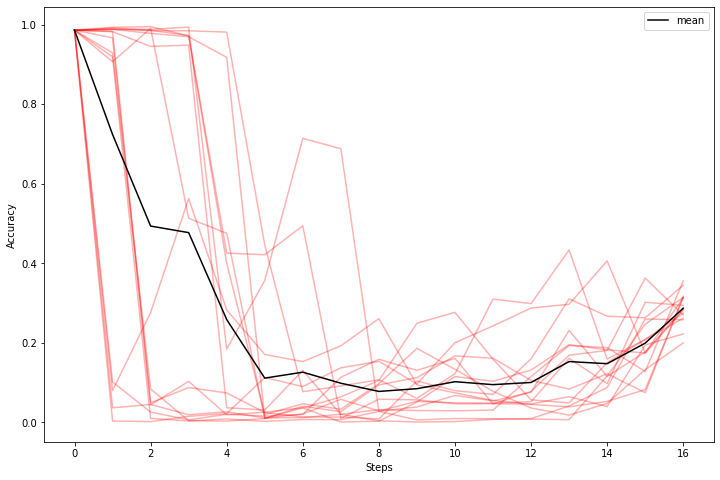

In [ ]:
fig15 = plt.figure(figsize=(12,8))
#results_15 = results
#mean_rand_15 = np.mean(results, axis = 0)
results_15 = mean_random[1][0]
mean_rand_15 = mean_random[1][1]

for i in range(results_15.shape[0]):
  plt.plot(steps, results_15[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_15, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("15 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_15.tex")

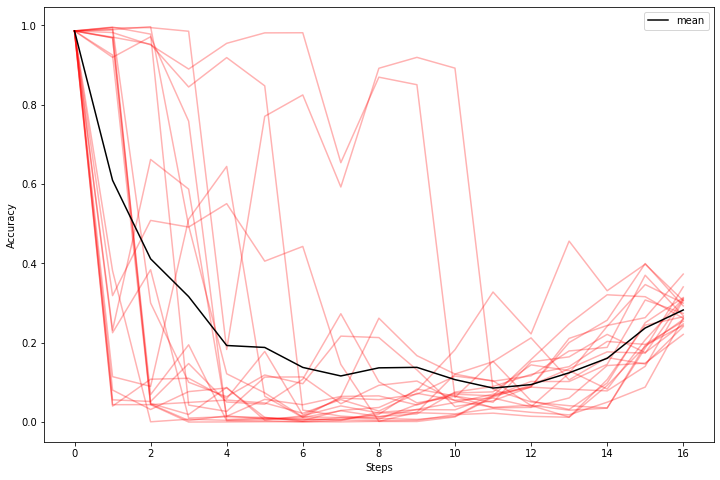

In [ ]:
fig20 = plt.figure(figsize=(12,8))
#results_20 = results
#mean_rand_20 = np.mean(results_20, axis = 0)
results_20 = mean_random[2][0]
mean_rand_20 = mean_random[2][1]

for i in range(results_20.shape[0]):
  plt.plot(steps, results_20[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_20, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("20 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_20.tex")

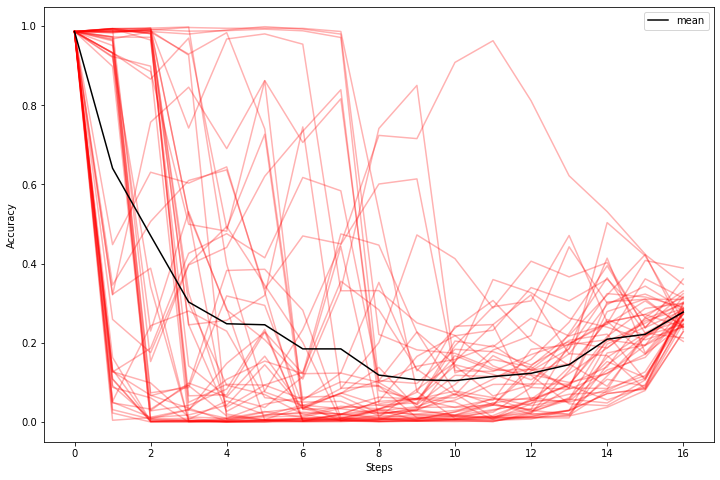

In [ ]:
fig50 = plt.figure(figsize=(12,8))
#results_50 = results
#mean_rand_50 = np.mean(results, axis = 0)

results_50 = mean_random[3][0]
mean_rand_50 = mean_random[3][1]

for i in range(results_50.shape[0]):
  plt.plot(steps, results_50[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_50, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("50 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_50.tex")

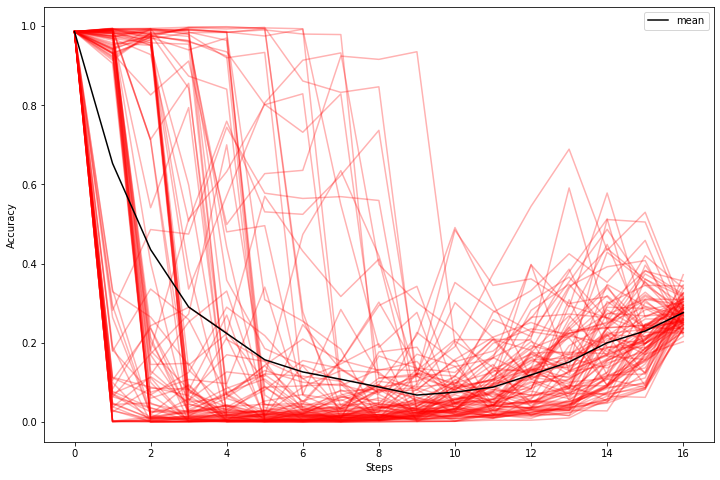

In [ ]:
fig100 = plt.figure(figsize=(12,8))
#results_100 = results
#mean_rand_100 = np.mean(results_100, axis = 0)
results_100 = mean_random[4][0]
mean_rand_100 = mean_random[4][1]

for i in range(results_100.shape[0]):
  plt.plot(steps, results_100[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_100, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("100 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_100.tex")

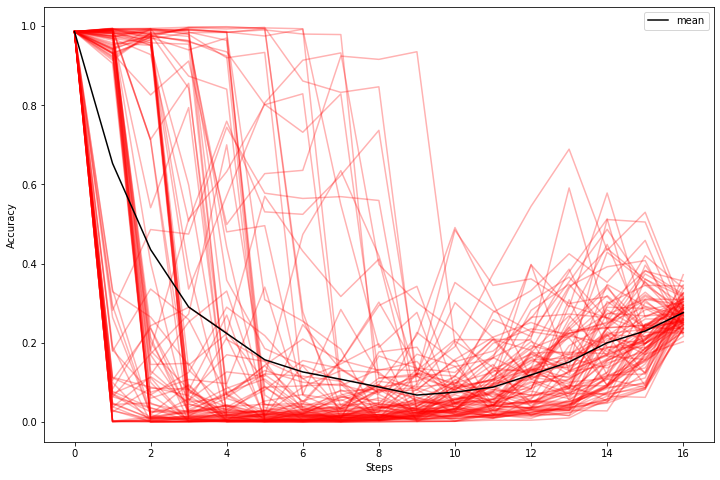

In [ ]:
fig200 = plt.figure(figsize=(12,8))
#results_200 = results
#mean_rand_200 = np.mean(results_200, axis = 0)
results_200 = mean_random[4][0]
mean_rand_200 = mean_random[4][1]

for i in range(results_200.shape[0]):
  plt.plot(steps, results_200[i], "b", color = "red", alpha=0.3 )

plt.plot(steps, mean_rand_200, "b", color ="black", label = "mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
#plt.title("200 Random perturbations with mean")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
#plt.show()
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/experiment_200.tex")

Final Comparison Plot:

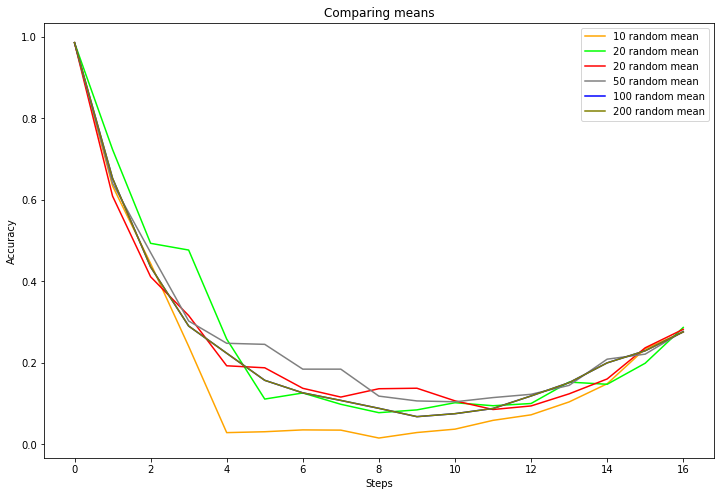

In [ ]:
fig_full = plt.figure(figsize=(12,8))
plt.plot(steps, mean_rand_10, "b", color ="orange", label = "10 random mean")
plt.plot(steps, mean_rand_15, "b", color ="lime", label = "20 random mean")
plt.plot(steps, mean_rand_20, "b", color ="red", label = "20 random mean")
plt.plot(steps, mean_rand_50, "b", color ="gray", label = "50 random mean")
plt.plot(steps, mean_rand_100, "b", color ="blue", label = "100 random mean")
plt.plot(steps, mean_rand_200, "b", color ="olive", label = "200 random mean")
#plt.fill_between(steps, maximum_lrp_diff, minimum_lrp_diff)
plt.title("Comparing means")
plt.xlabel("Steps")
plt.ylabel("Accuracy")
plt.legend()
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/random_perturbation_comparison.pdf') 
tikzplotlib.save("/content/gdrive/My Drive/Thesis/PDF_plots/random_perturbation_comparison.tex")

In the Plot 10 perturbations looks quite different from the rest. With 20 Iterations a good lower bound of the random baseline should be archived.

Hole mir AUC plotte die Verteilungen. 
Check auf Normalverteilung
Wenn Normalverteilt -> t-test
sonst Mann-Whitney-U


Ansonten eher einfach alles Berichten was mir auffällt.


Areas of intrest 


Wie weit unterschieden sich die Sailency maps von CNNs gemacht durch LRP und humans beim erkennen von Emotionen. 

Abhänige variable Difference in Accruracy je nachdem ob die Sailency map von humans oder dem Netzwerk als Grundlage nehme (das sind die unabhänigen variablen) 

Methode is der perturbation Ansatz.

Results: Ziemlich ähnlich. LRP steiler und höher AUC. Was das bedeutet, Die Perturbation von LRP cancelt schneller die für das Netzwerk relevanten Bildbereiche raus. Scheint erstmal trivial, zeigt aber das das Netzwerk und Menschen auf unterschiedliche bereiche achten. Wie unterscheidet sich das bei den unterschiedlichen Emotionen. (Vielleicht in Perturbation curve und heatmaps)


Discussion: 
Das liegt wahrscheinlich daran, dass die Personen keinen spefizfischen Task hatten und dadurch ein bottom down suchverhalten zeigen und auf Saliente Bildbereiche achten. Besonders wichtig sind hier die Augen.
Unterscheidet sich aber von anderen Findings, die mit dem Bubble Ansatz die Informationsrelevanten Bereiche für Emotionsgesichter gefunden haben. 
Diese sind augenscheinlich ähnlicher. Möglcherweise müssten noch tests mit diesen Heatmaps gemacht werden. 

Happy menschen gut aber Augen kriegen bei den S. Maps größten share somit verzerrt.





Was muss zu sehen sein: 
Beginn von Results Acc von Training und dem Eye-tracker( Gesamtmatrix - Vergleich der ACC zwischen den menschen (Wahrscheinlich als Ranges im text)



Beispielhaft LRP und Human sailancy maps:
Perturbation Overview Plot

Random Experiment- zum erklären wie Baseline zu stande kommt. 

Perturbation Plot Man vs Machine complete 
für jede Emotion aufgesplittet und 

93 von 112: 

### Show the mean difference for each trial (only that that were correctly classified by the network) 

Press Enter to see the next Plot

## Read in the data

In [ ]:
# Directory with the test images
data_dir = "/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/"
# Directory with the human heatmaps
#human_heatmap_dir = "/content/gdrive/My Drive/Thesis/human_heatmaps/"
human_heatmap_dir = "/content/gdrive/My Drive/Thesis/Heatmap_array/"
number_of_correct =  pd.read_csv("/content/gdrive/My Drive/Thesis/nr_correct_human_trials.csv")

#creating dummy arrays to store the images (data) and the human heatmaps
data = np.zeros((112, 224,224,3), dtype = np.float32)
human_heatmap = np.zeros((112, 224,224), dtype = np.float32)
names = [] # name of the image
labels = [] #labels
correct_human = []
j = 0 # index 
for i in os.listdir(data_dir):
  try:
    # Load the image resize and append to data array
    name = data_dir + i
    img = cv2.imread(name, cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
    img = cv2.resize(img, (224,224))   
    b,g,r = cv2.split(img)           # get the single color channels and flip them to account for the flipped reading by opencv
    rgb_img1 = cv2.merge([r,g,b]) 
    data[j] = rgb_img1
    names.append(i[:7])

    # if statement to extract and append the right label
    if i[-7:-5] == "AF":
        labels_num = 0
    elif i[-7:-5] == "AN":
        labels_num = 1
    elif i[-7:-5] == "DI":
        labels_num = 2
    elif i[-7:-5] == "HA":
        labels_num = 3
    elif i[-7:-5] == "NE":
        labels_num = 4
    elif i[-7:-5] == "SA":
        labels_num = 5
    else:
        labels_num = 6
    
    labels.append(labels_num)



    for index, row in number_of_correct.iterrows():
      if row['Image_name'] == i[:7]:
        correct_human.append(row['correct'])
    # Load the respective human heatmap and store it in the human heatmap array
    
    #heatmap_name = "Heatmap_array" + i[:7] + ".npy"   # for coorect and inccorect classifications in the human heatmaps
    heatmap_name = i[:7] + ".npy"   # heatmaps only with correct human trials
    human_heatmap[j] = np.load(human_heatmap_dir + heatmap_name)

    j += 1
  except:
    print(name)
    print("File that is no png")

print("Total number of images:"+ str(j))

/content/gdrive/My Drive/Thesis/colab.zip (Unzipped Files)/colab/cropped_data/Test/.ipynb_checkpoints
File that is no png
Total number of images:112


In [ ]:
# turning the list of labels to an array 
new_labels = np.zeros((112, 7))
for i in range(len(new_labels)):
  np.put(new_labels[i], labels[i], 1)

# Appendix

## Testset split by facial expression

### Afraid

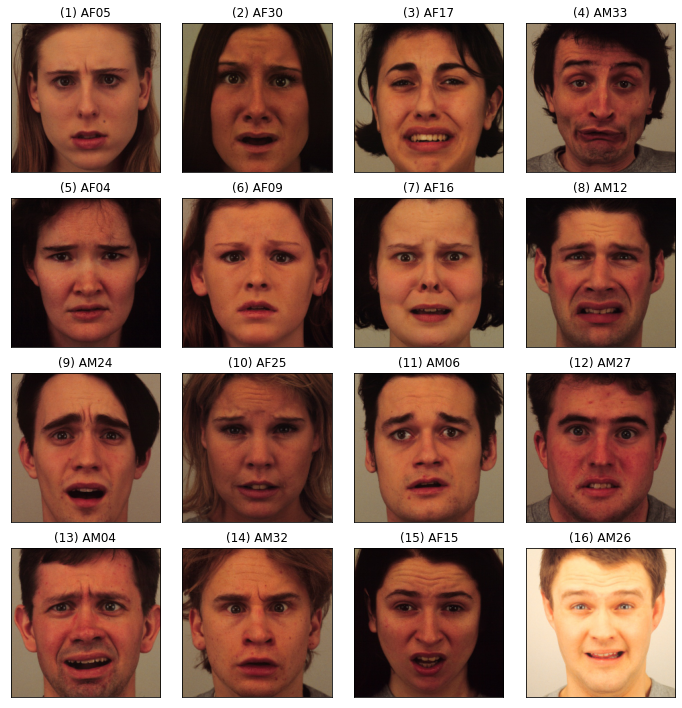

In [ ]:
human_heatmaps(0, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_afraid.pdf') 

### Angry

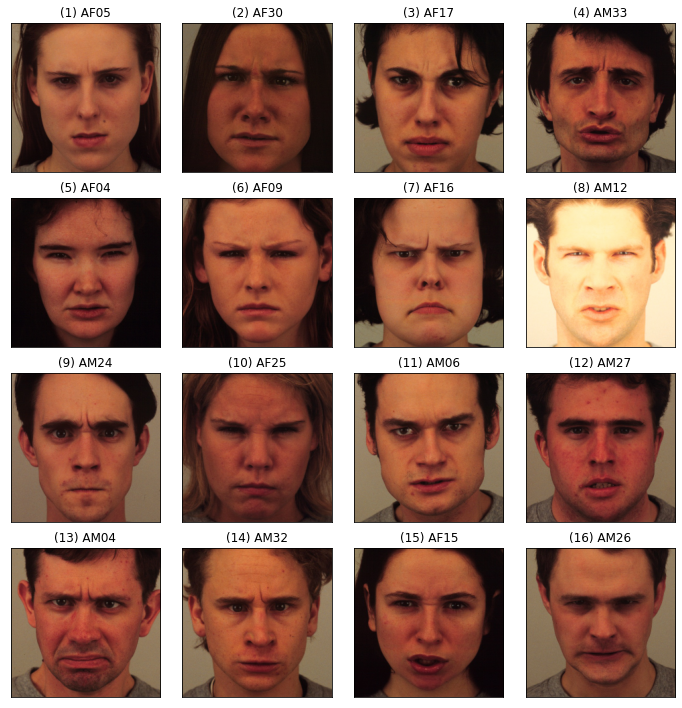

In [ ]:
human_heatmaps(1, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_angry.pdf') 

### Disgusted

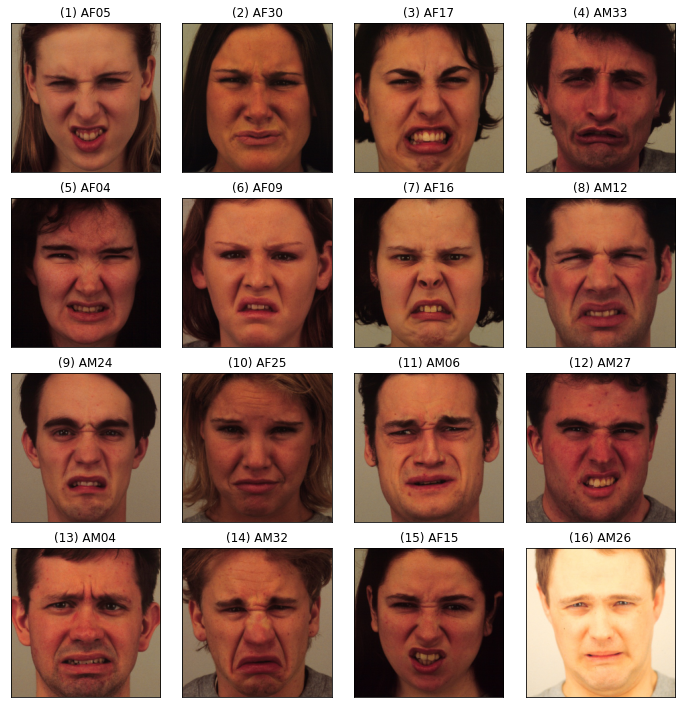

In [ ]:
human_heatmaps(2, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_disgusted.pdf') 

### Happy

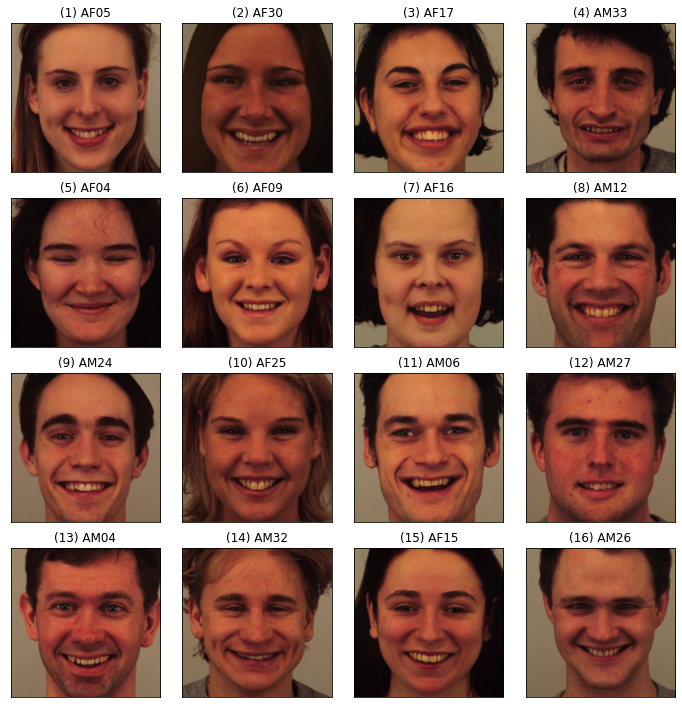

In [ ]:
human_heatmaps(3, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_happy.pdf') 

### Neutral


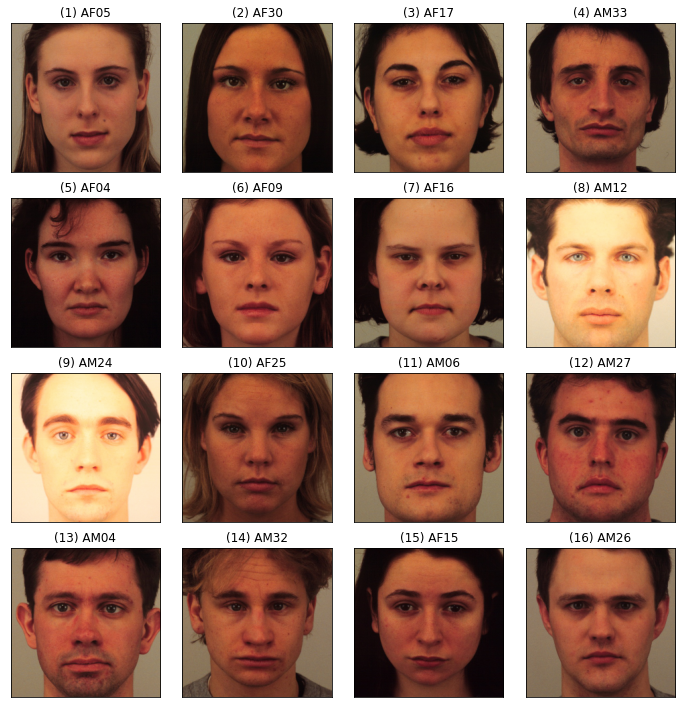

In [ ]:
human_heatmaps(4, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_neutral.pdf') 

### Sad

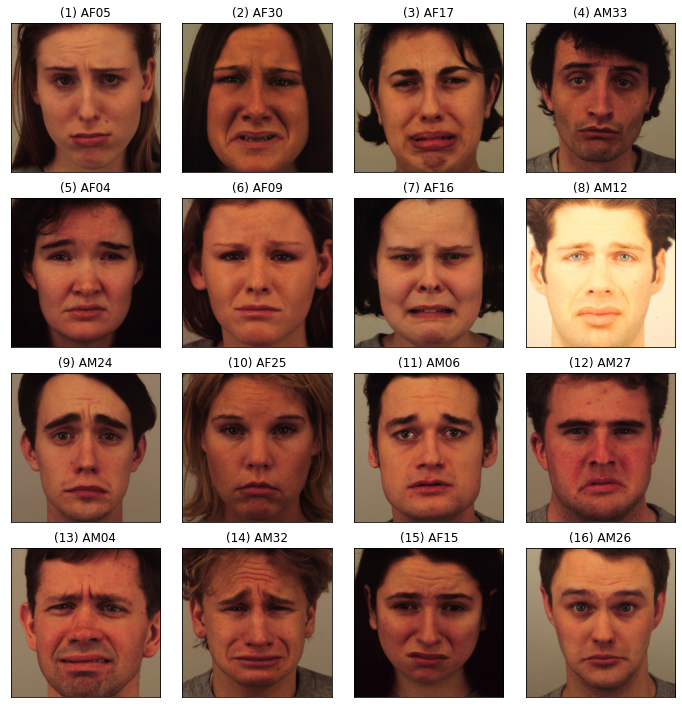

In [ ]:
human_heatmaps(5, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_sad.pdf') 

### Surprised

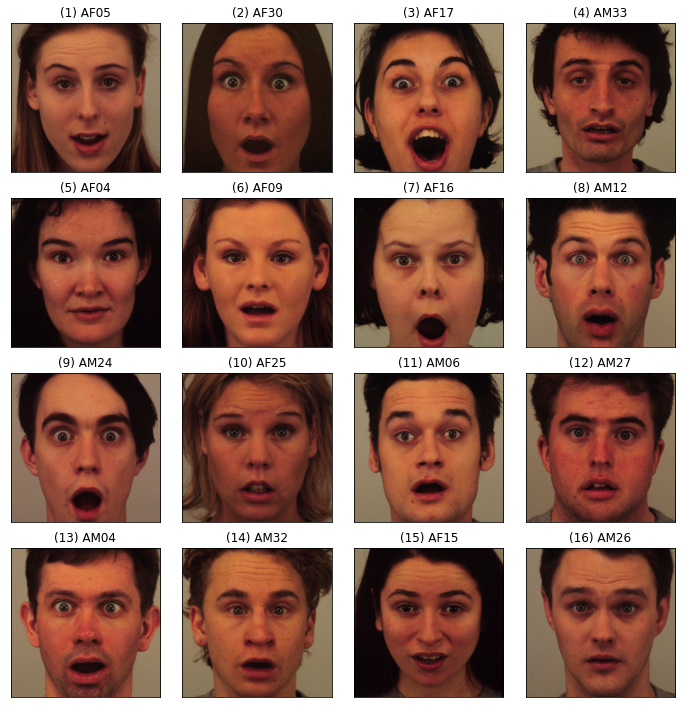

In [ ]:
human_heatmaps(6, labels, data)
plt.savefig('/content/gdrive/My Drive/Thesis/PDF_plots/testset_surprised.pdf') 